# Libraries

In [1]:
import pandas  as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import pickle
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit,RandomizedSearchCV,train_test_split,KFold,cross_val_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
import gc

from xgboost import XGBClassifier
import os
import joblib
import random
from random import sample
import warnings
warnings.filterwarnings('ignore')
from copy import deepcopy
from itertools import product
from collections import defaultdict
from scipy import stats
#Visualization
import matplotlib.pyplot as plt
import seaborn as sns
#Sklearn preprocessing
from sklearn.preprocessing import StandardScaler , LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

#metrics
from sklearn.metrics import accuracy_score,roc_auc_score,roc_curve,confusion_matrix,precision_score,recall_score,f1_score
from scipy.stats import boxcox, skew, kurtosis
# Machine Learning
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
#warnings
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, chi2, f_classif, mutual_info_classif
import shap
from PyALE import ale
import random
import yaml
from sklearn.inspection import PartialDependenceDisplay

# Data 

In [2]:
seed= 0 

In [3]:
df = pd.read_csv('model_data.csv',sep='|',low_memory=False)

In [4]:
df.head()

,Unnamed: 0,loan_id,act_period,channel,orig_rate,orig_upb,orig_term,orig_date,first_pay,loan_age,...,target,last_period,calc_age,age_dif,calc_rem_months,cscore_min,orig_val,Vintage,Prepay,Default
0,0,523899932680,2010-04-20,C,4.750,239000.0,360.0,2009-01-20,2009-03-20,14.0,...,A,NaN,15,1.0,346,778.0,412068.965517,2009,0,0
1,1,239106981350,2009-06-20,C,5.250,80000.0,180.0,2002-10-20,2003-01-20,81.0,...,P,2009-06-20,81,NaN,99,776.0,129032.258065,2002,1,0
2,2,667907597231,2018-05-20,R,2.875,210000.0,180.0,2012-12-20,2013-02-20,64.0,...,A,NaN,65,1.0,116,707.0,344262.295082,2012,0,0
3,3,940076896427,2012-05-20,B,6.875,134000.0,360.0,2002-09-20,2002-11-20,116.0,...,P,2012-05-20,116,NaN,244,710.0,138144.329897,2002,1,0
4,4,849058792149,2005-04-20,C,5.625,113000.0,180.0,2002-08-20,2002-10-20,31.0,...,A,NaN,33,2.0,149,792.0,182258.064516,2002,0,0


In [5]:
df.shape

(557640, 44)

In [6]:
df.drop(['Unnamed: 0'],axis=1,inplace=True)

In [7]:
df.head()

,loan_id,act_period,channel,orig_rate,orig_upb,orig_term,orig_date,first_pay,loan_age,rem_months,...,target,last_period,calc_age,age_dif,calc_rem_months,cscore_min,orig_val,Vintage,Prepay,Default
0,523899932680,2010-04-20,C,4.750,239000.0,360.0,2009-01-20,2009-03-20,14.0,346.0,...,A,NaN,15,1.0,346,778.0,412068.965517,2009,0,0
1,239106981350,2009-06-20,C,5.250,80000.0,180.0,2002-10-20,2003-01-20,81.0,99.0,...,P,2009-06-20,81,NaN,99,776.0,129032.258065,2002,1,0
2,667907597231,2018-05-20,R,2.875,210000.0,180.0,2012-12-20,2013-02-20,64.0,116.0,...,A,NaN,65,1.0,116,707.0,344262.295082,2012,0,0
3,940076896427,2012-05-20,B,6.875,134000.0,360.0,2002-09-20,2002-11-20,116.0,244.0,...,P,2012-05-20,116,NaN,244,710.0,138144.329897,2002,1,0
4,849058792149,2005-04-20,C,5.625,113000.0,180.0,2002-08-20,2002-10-20,31.0,149.0,...,A,NaN,33,2.0,149,792.0,182258.064516,2002,0,0


In [8]:
df.columns

Index(['loan_id', 'act_period', 'channel', 'orig_rate', 'orig_upb',
       'orig_term', 'orig_date', 'first_pay', 'loan_age', 'rem_months',
       'matr_dt', 'oltv', 'ocltv', 'num_bo', 'dti', 'cscore_b', 'cscore_c',
       'first_flag', 'purpose', 'prop', 'no_units', 'occ_stat', 'state', 'msa',
       'zip', 'mi_pct', 'dlq_status', 'zero_bal_code', 'zb_dte', 'mi_type',
       'homeready_program_indicator', 'relocation_mortgage_indicator',
       'high_balance_loan_indicator', 'target', 'last_period', 'calc_age',
       'age_dif', 'calc_rem_months', 'cscore_min', 'orig_val', 'Vintage',
       'Prepay', 'Default'],
      dtype='object')

In [9]:
df_default = df[df['Default'] == 1]

In [10]:
df_notdefault = df[df['Default'] == 0]

In [11]:
len(df_default) , len(df_notdefault)  # there is a huge imbalance

(157732, 399908)

In [12]:
# Lets balance this target value
df_notdefault = df_notdefault.sample(frac=0.5,axis=0,random_state=seed)

In [13]:
df_balanced = pd.concat([df_default,df_notdefault],axis=0)
df_balanced.Default.value_counts(normalize = True)

0    0.559021
1    0.440979
Name: Default, dtype: float64

In [14]:
df_balanced.Default.value_counts()

0    199954
1    157732
Name: Default, dtype: int64

# Merge W/ HPA & Unemployement Dataset

In [15]:
df_balanced.shape

(357686, 43)

In [16]:
parse_dates=["orig_date","first_pay","zb_dte","act_period","matr_dt"]
for i in parse_dates:
    df_balanced[i]=pd.to_datetime(df[i])

In [17]:
df_balanced['orig_mnth']='M'+df_balanced['orig_date'].dt.month.map("{:02}".format).astype(str)+df_balanced['orig_date'].dt.year.astype(str)


In [18]:
earliest_orig_date = df_balanced['orig_date'].min()
earliest_orig_date

Timestamp('1999-01-19 00:00:00')

In [19]:
## read in the ref table
hpa_path = 'hpa_ref_final.csv'
hpa=pd.read_csv(hpa_path,dtype={'zip':'str'})
hpa['zip']=hpa['zip'].str.pad(width=3, side='left', fillchar='0')
periods_to_drop=hpa[pd.to_datetime(hpa['Date'])<earliest_orig_date].index
hpa.drop(periods_to_drop, inplace=True)

In [20]:
hpa
print(df_balanced['zip'].dtype),print(hpa['zip'].dtype)

float64
object


(None, None)

In [21]:
df_balanced['zip'] = df_balanced['zip'].astype(str)  # Convert to string to handle both integers and floats
df_balanced['zip'] = df_balanced['zip'].str.split('.').str[0]  # Split by '.', and keep only the part before the '.'
df_balanced['zip'] = df_balanced['zip'].astype(object) 

In [22]:
print(df_balanced['zip'].dtype),print(hpa['zip'].dtype)

object
object


(None, None)

In [23]:
hpa['Date']=pd.to_datetime(hpa['Date'])
hpa['orig_mnth']='M'+hpa['Date'].dt.month.map("{:02}".format).astype(str)+hpa['Date'].dt.year.astype(str)
hpa.dtypes

Unnamed: 0                 int64
Date              datetime64[ns]
zip                       object
Year                     float64
Quarter                  float64
Index (NSA)              float64
Index Type                object
orig_qrtr                 object
orig_qrtr_date            object
12M Change               float64
36M Change               float64
60M Change               float64
orig_mnth                 object
dtype: object

In [24]:
df_balanced.zip.value_counts()

331    3490
606    3268
330    3263
945    3115
300    3023
       ... 
345       1
964       1
nan       1
965       1
886       1
Name: zip, Length: 906, dtype: int64

In [25]:
df_merged=pd.merge(df_balanced, hpa[['zip','12M Change','36M Change','60M Change','orig_mnth']],on=['zip','orig_mnth'],how='left',indicator=True)

In [26]:
list(df_merged)

['loan_id',
 'act_period',
 'channel',
 'orig_rate',
 'orig_upb',
 'orig_term',
 'orig_date',
 'first_pay',
 'loan_age',
 'rem_months',
 'matr_dt',
 'oltv',
 'ocltv',
 'num_bo',
 'dti',
 'cscore_b',
 'cscore_c',
 'first_flag',
 'purpose',
 'prop',
 'no_units',
 'occ_stat',
 'state',
 'msa',
 'zip',
 'mi_pct',
 'dlq_status',
 'zero_bal_code',
 'zb_dte',
 'mi_type',
 'homeready_program_indicator',
 'relocation_mortgage_indicator',
 'high_balance_loan_indicator',
 'target',
 'last_period',
 'calc_age',
 'age_dif',
 'calc_rem_months',
 'cscore_min',
 'orig_val',
 'Vintage',
 'Prepay',
 'Default',
 'orig_mnth',
 '12M Change',
 '36M Change',
 '60M Change',
 '_merge']

In [27]:
df_merged.shape

(357686, 48)

In [28]:
df_merged['_merge'].value_counts()

both          321555
left_only      36131
right_only         0
Name: _merge, dtype: int64

In [29]:
df_merged[['zip','orig_date','orig_mnth']][df_merged['_merge']=='left_only']

,zip,orig_date,orig_mnth
3,76,2013-07-20,M072013
17,85,2010-03-20,M032010
19,76,2012-04-20,M042012
24,87,2003-06-20,M062003
31,64,2007-12-20,M122007
...,...,...,...
357624,64,2020-07-20,M072020
357653,67,2002-12-20,M122002
357657,20,2016-04-20,M042016
357667,44,2005-05-20,M052005


In [30]:
df_merged.drop(['_merge'], axis=1 , inplace=True)

In [31]:
# Now let's focus on unemployment Dataset to merge with our loan dataset
zip_to_fips = pd.read_pickle('zip3_fips_lookup_s3.pkl')

In [32]:
zip_to_fips.rename(columns={'ZIP_3':'zip'}, inplace=True)
zip_to_fips['zip']=zip_to_fips['zip'].str.pad(width=3, side='left', fillchar='0')
zip_to_fips['FIPS']=zip_to_fips['FIPS'].str.pad(width=5, side='left', fillchar='0')

In [33]:
zip_to_fips.shape

(911, 4)

In [34]:
zip_to_fips.dtypes

zip           object
Latitude     float64
Longitude    float64
FIPS          object
dtype: object

In [35]:
list(zip_to_fips)

['zip', 'Latitude', 'Longitude', 'FIPS']

In [36]:
df2 = pd.merge(df_merged,zip_to_fips[['zip','Latitude','Longitude','FIPS']],on = ['zip'], how= 'left', indicator = True)

In [37]:
df2['_merge'].value_counts()

both          321586
left_only      36100
right_only         0
Name: _merge, dtype: int64

In [38]:
df2.drop(['_merge'],axis=1 , inplace=True)

In [39]:
df2.shape

(357686, 50)

In [40]:
df2.isna().sum()

loan_id                               0
act_period                            0
channel                               0
orig_rate                             0
orig_upb                              0
orig_term                             0
orig_date                             0
first_pay                             0
loan_age                              0
rem_months                            0
matr_dt                           92832
oltv                                  0
ocltv                                 0
num_bo                               66
dti                                   0
cscore_b                              0
cscore_c                              0
first_flag                          194
purpose                               0
prop                                  0
no_units                              0
occ_stat                              0
state                                 0
msa                                   0
zip                                   0


In [41]:
df2.drop(columns=['Latitude','Longitude'],axis=1,inplace=True)

In [42]:
df_unemp=pd.read_pickle('unemp_county_shrt.pkl')
df_unemp['FIPS']=df_unemp['FIPS'].str.pad(width=5, side='left', fillchar='0')

In [43]:
(df_unemp[df_unemp['value'].apply(lambda x: isinstance(x, str))])

,realtime_start,realtime_end,date,value,id,County,State,fips,name,FIPS,_merge
0,2023-01-27,2023-01-27,1990-01-01,0.700,AKALEU0URN,Aleutians West Census Area,AK,2016.0,Aleutians West Census Area,02016,both
1,2023-01-27,2023-01-27,1990-02-01,0.600,AKALEU0URN,Aleutians West Census Area,AK,2016.0,Aleutians West Census Area,02016,both
2,2023-01-27,2023-01-27,1990-03-01,0.7,AKALEU0URN,Aleutians West Census Area,AK,2016.0,Aleutians West Census Area,02016,both
3,2023-01-27,2023-01-27,1990-04-01,0.700,AKALEU0URN,Aleutians West Census Area,AK,2016.0,Aleutians West Census Area,02016,both
4,2023-01-27,2023-01-27,1990-05-01,0.7,AKALEU0URN,Aleutians West Census Area,AK,2016.0,Aleutians West Census Area,02016,both
...,...,...,...,...,...,...,...,...,...,...,...
1226870,2023-01-27,2023-01-27,2022-07-01,2.2,WYWEST5URN,Weston,WY,56045.0,Weston County,56045,both
1226871,2023-01-27,2023-01-27,2022-08-01,2.2,WYWEST5URN,Weston,WY,56045.0,Weston County,56045,both
1226872,2023-01-27,2023-01-27,2022-09-01,2.1,WYWEST5URN,Weston,WY,56045.0,Weston County,56045,both
1226873,2023-01-27,2023-01-27,2022-10-01,2.2,WYWEST5URN,Weston,WY,56045.0,Weston County,56045,both


In [44]:
print (df_unemp['value'][pd.to_numeric(df_unemp['value'], errors='coerce').isnull()].value_counts())

.    118
Name: value, dtype: int64


In [45]:
df_unemp.replace('.',np.NaN,inplace=True)

In [46]:
df_unemp['value'] = df_unemp.groupby(['FIPS'])['value'].bfill()

In [47]:
print (df_unemp['value'][pd.to_numeric(df_unemp['value'], errors='coerce').isnull()].value_counts())

Series([], Name: value, dtype: int64)


In [48]:
df_unemp.dtypes

realtime_start      object
realtime_end        object
date                object
value               object
id                  object
County              object
State               object
fips               float64
name                object
FIPS                object
_merge            category
dtype: object

In [49]:
df_unemp['value']=df_unemp['value'].astype(float)

In [50]:
df_unemp['date']=pd.to_datetime(df_unemp['date'])

In [51]:
df_unemp['orig_mnth']='M'+df_unemp['date'].dt.month.map("{:02}".format).astype(str)+df_unemp['date'].dt.year.astype(str)

In [52]:
df_unemp.groupby(['FIPS'])['orig_mnth'].min().value_counts()

M011990    2257
M011994       1
Name: orig_mnth, dtype: int64

In [53]:
df_unemp.FIPS=df_unemp.FIPS.astype(str)

In [54]:
df_unemp.drop(['_merge'],axis=1,inplace=True)

In [55]:
df3=pd.merge(df2, df_unemp[['orig_mnth','value','FIPS']],on=['orig_mnth','FIPS'],how='left',indicator=True)

In [56]:
df3.shape

(357686, 50)

In [57]:
df3['_merge'].value_counts()

both          234661
left_only     123025
right_only         0
Name: _merge, dtype: int64

In [58]:
df3.rename(columns={'value':'unemp'}, inplace=True)

In [59]:
df3.columns

Index(['loan_id', 'act_period', 'channel', 'orig_rate', 'orig_upb',
       'orig_term', 'orig_date', 'first_pay', 'loan_age', 'rem_months',
       'matr_dt', 'oltv', 'ocltv', 'num_bo', 'dti', 'cscore_b', 'cscore_c',
       'first_flag', 'purpose', 'prop', 'no_units', 'occ_stat', 'state', 'msa',
       'zip', 'mi_pct', 'dlq_status', 'zero_bal_code', 'zb_dte', 'mi_type',
       'homeready_program_indicator', 'relocation_mortgage_indicator',
       'high_balance_loan_indicator', 'target', 'last_period', 'calc_age',
       'age_dif', 'calc_rem_months', 'cscore_min', 'orig_val', 'Vintage',
       'Prepay', 'Default', 'orig_mnth', '12M Change', '36M Change',
       '60M Change', 'FIPS', 'unemp', '_merge'],
      dtype='object')

In [60]:
df_both = df3.loc[df3['_merge']=='both']  # Only taking the filled columns from merge

In [61]:
df_both.shape

(234661, 50)

In [62]:
df_both.isna().sum()

loan_id                               0
act_period                            0
channel                               0
orig_rate                             0
orig_upb                              0
orig_term                             0
orig_date                             0
first_pay                             0
loan_age                              0
rem_months                            0
matr_dt                           61342
oltv                                  0
ocltv                                 0
num_bo                               37
dti                                   0
cscore_b                              0
cscore_c                              0
first_flag                          121
purpose                               0
prop                                  0
no_units                              0
occ_stat                              0
state                                 0
msa                                   0
zip                                   0


In [63]:
cols_to_drop=['loan_id','first_pay','act_period','orig_date','matr_dt','msa','zip','zero_bal_code','zb_dte','last_period','calc_age','age_dif',
              'calc_rem_months' ,'Prepay','target','dlq_status','_merge','state',
              'FIPS','orig_mnth','_merge','homeready_program_indicator']

#Some of these columns give information about Our Target value and Future predictions so we decided to drop these columns


In [64]:
df_model=df_both.drop(cols_to_drop, axis=1)

In [65]:
df_model.isna().sum()

channel                               0
orig_rate                             0
orig_upb                              0
orig_term                             0
loan_age                              0
rem_months                            0
oltv                                  0
ocltv                                 0
num_bo                               37
dti                                   0
cscore_b                              0
cscore_c                              0
first_flag                          121
purpose                               0
prop                                  0
no_units                              0
occ_stat                              0
mi_pct                                0
mi_type                          178541
relocation_mortgage_indicator         0
high_balance_loan_indicator           0
cscore_min                            0
orig_val                              0
Vintage                               0
Default                               0


In [66]:
df_model['num_bo'].fillna(df_model['num_bo'].mode()[0], inplace = True)

In [67]:
df_model['first_flag'].fillna(df_model['first_flag'].mode()[0], inplace = True)


In [68]:
df_model.isna().sum()

channel                               0
orig_rate                             0
orig_upb                              0
orig_term                             0
loan_age                              0
rem_months                            0
oltv                                  0
ocltv                                 0
num_bo                                0
dti                                   0
cscore_b                              0
cscore_c                              0
first_flag                            0
purpose                               0
prop                                  0
no_units                              0
occ_stat                              0
mi_pct                                0
mi_type                          178541
relocation_mortgage_indicator         0
high_balance_loan_indicator           0
cscore_min                            0
orig_val                              0
Vintage                               0
Default                               0


In [69]:
df_model['mi_type'].unique()

array([ 1., nan,  2.,  3.])

In [70]:
df_model.mi_type.value_counts()

1.0    51909
2.0     4181
3.0       30
Name: mi_type, dtype: int64

In [71]:
df_model['mi_type'] = df_model['mi_type'].fillna(0) # fill with "0"  for clients with no mortgage insurance 

In [72]:
df_model.isna().sum()

channel                          0
orig_rate                        0
orig_upb                         0
orig_term                        0
loan_age                         0
rem_months                       0
oltv                             0
ocltv                            0
num_bo                           0
dti                              0
cscore_b                         0
cscore_c                         0
first_flag                       0
purpose                          0
prop                             0
no_units                         0
occ_stat                         0
mi_pct                           0
mi_type                          0
relocation_mortgage_indicator    0
high_balance_loan_indicator      0
cscore_min                       0
orig_val                         0
Vintage                          0
Default                          0
12M Change                       6
36M Change                       6
60M Change                       6
unemp               

In [73]:
missing_cols = df_model.columns[df_model.isnull().any()]

for i in missing_cols:
    df_model[i]=df_model[i].fillna(df_model[i].mean())
    print(i)

12M Change
36M Change
60M Change


In [74]:
df_model.isna().sum().sum()

0

In [75]:
num_vars=['orig_rate', 'orig_upb','orig_val',
       'orig_term' ,'loan_age', 'rem_months',
       'oltv', 'ocltv',  'dti', 'cscore_b', 'cscore_c','cscore_min',
        'mi_pct','12M Change','36M Change','60M Change','unemp']
cat_vars=['channel','purpose', 'prop', 'no_units', 'occ_stat',
       'mi_type',
       'num_bo']
bin_vars=['first_flag',
#        'homeready_program_indicator',
       'relocation_mortgage_indicator', 'high_balance_loan_indicator',
       ]

In [76]:
df_model[['relocation_mortgage_indicator','high_balance_loan_indicator','first_flag']].value_counts()

relocation_mortgage_indicator  high_balance_loan_indicator  first_flag
N                              N                            N             202065
                                                            Y              28901
                               Y                            N               2182
Y                              N                            N                794
N                              Y                            Y                581
Y                              N                            Y                128
                               Y                            N                  9
                                                            Y                  1
dtype: int64

In [77]:
df4 = df_model.copy()

In [78]:
for column in num_vars:
    df4[column] = df4[column].astype('float')

In [79]:
df4.columns

Index(['channel', 'orig_rate', 'orig_upb', 'orig_term', 'loan_age',
       'rem_months', 'oltv', 'ocltv', 'num_bo', 'dti', 'cscore_b', 'cscore_c',
       'first_flag', 'purpose', 'prop', 'no_units', 'occ_stat', 'mi_pct',
       'mi_type', 'relocation_mortgage_indicator',
       'high_balance_loan_indicator', 'cscore_min', 'orig_val', 'Vintage',
       'Default', '12M Change', '36M Change', '60M Change', 'unemp'],
      dtype='object')

In [80]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 234661 entries, 0 to 357685
Data columns (total 29 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   channel                        234661 non-null  object 
 1   orig_rate                      234661 non-null  float64
 2   orig_upb                       234661 non-null  float64
 3   orig_term                      234661 non-null  float64
 4   loan_age                       234661 non-null  float64
 5   rem_months                     234661 non-null  float64
 6   oltv                           234661 non-null  float64
 7   ocltv                          234661 non-null  float64
 8   num_bo                         234661 non-null  float64
 9   dti                            234661 non-null  float64
 10  cscore_b                       234661 non-null  float64
 11  cscore_c                       234661 non-null  float64
 12  first_flag                    

Skewness of orig_rate is -0.15780197014971717
Skewness of orig_upb is 0.9734342275864778
Skewness of orig_val is 1.495030423178461
Skewness of orig_term is -1.4964323971399147
Skewness of loan_age is 0.9850281028783698
Skewness of rem_months is -0.8867011802090273
Skewness of oltv is -0.9772126490529589
Skewness of ocltv is -0.9845141652754392
Skewness of dti is -0.08578367038857625
Skewness of cscore_b is -0.4530412415051978
Skewness of cscore_c is -0.472085759812861
Skewness of cscore_min is -0.40840648570235266
Skewness of mi_pct is -2.2157399828838287
Skewness of 12M Change is 0.20722427476890942
Skewness of 36M Change is 0.6028338951537231
Skewness of 60M Change is 0.6596619718230674
Skewness of unemp is 1.5641788005829886


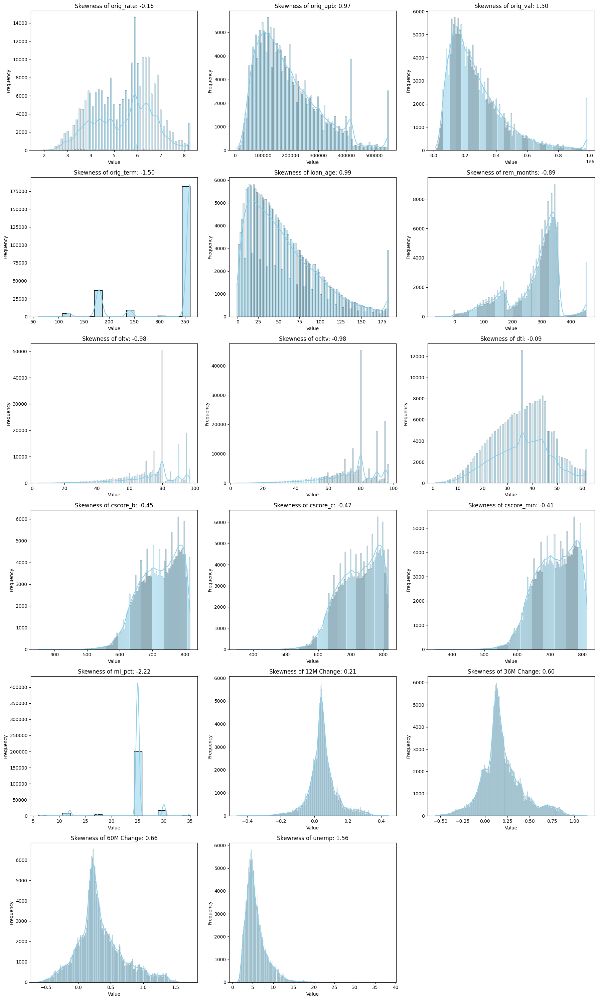

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew


num_columns = len(num_vars)
num_rows = (num_columns + 2) // 3  # Calculate the number of rows required

fig, axes = plt.subplots(num_rows, 3, figsize=(18, 5 * num_rows))
axes = axes.ravel()

for i, col in enumerate(num_vars):
    skewness = skew(df4[col])  # Calculate skewness
    print(f'Skewness of {col} is {skewness}')

    # Plot a distribution plot using Seaborn
    sns.histplot(df4[col], kde=True, color='skyblue', ax=axes[i])
    
    # Set title and labels
    axes[i].set_title(f'Skewness of {col}: {skewness:.2f}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any remaining empty subplots
for i in range(num_columns, num_rows * 3):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


In [82]:
from scipy.stats import skew, kurtosis

# List of columns you want to check for skewness and kurtosis (include the transformed columns)


# Calculate and print skewness and kurtosis for each column
for col in num_vars:
    skewness = skew(df4[col])
    kurt = kurtosis(df4[col])
    print(f'Skewness of {col} is {skewness}')
    print(f'Kurtosis of {col} is {kurt}')
    print('**'*50)

Skewness of orig_rate is -0.15780197014971717
Kurtosis of orig_rate is -0.720193469377512
****************************************************************************************************
Skewness of orig_upb is 0.9734342275864778
Kurtosis of orig_upb is 0.5706417894441884
****************************************************************************************************
Skewness of orig_val is 1.495030423178461
Kurtosis of orig_val is 2.6299730914027712
****************************************************************************************************
Skewness of orig_term is -1.4964323971399147
Kurtosis of orig_term is 0.4599666324503575
****************************************************************************************************
Skewness of loan_age is 0.9850281028783698
Kurtosis of loan_age is 0.5230903964180968
****************************************************************************************************
Skewness of rem_months is -0.8867011802090273
Kurtosis of r

In [83]:
# List of columns to apply square root transformation
columns_to_sqrt = ['orig_val', 'orig_upb', 'mi_pct', 'unemp']

# Apply square root transformation to specified columns
for col in columns_to_sqrt:
    df4[col] = np.sqrt(df4[col])


In [84]:
columns_to_sqrt = ['orig_val', 'orig_upb', 'mi_pct', 'unemp']

for col in columns_to_sqrt:
    skewness = skew(df4[col])
    kurt = kurtosis(df4[col])
    print(f'Skewness of {col} is {skewness}')
    print(f'Kurtosis of {col} is {kurt}')
    print('**'*50)

Skewness of orig_val is 0.674430137689724
Kurtosis of orig_val is 0.28974519032295154
****************************************************************************************************
Skewness of orig_upb is 0.3647722199258203
Kurtosis of orig_upb is -0.42665155548863565
****************************************************************************************************
Skewness of mi_pct is -3.0538636749896813
Kurtosis of mi_pct is 13.497518321661776
****************************************************************************************************
Skewness of unemp is 0.8085792239172332
Kurtosis of unemp is 1.0430185249367172
****************************************************************************************************


# Heatmap

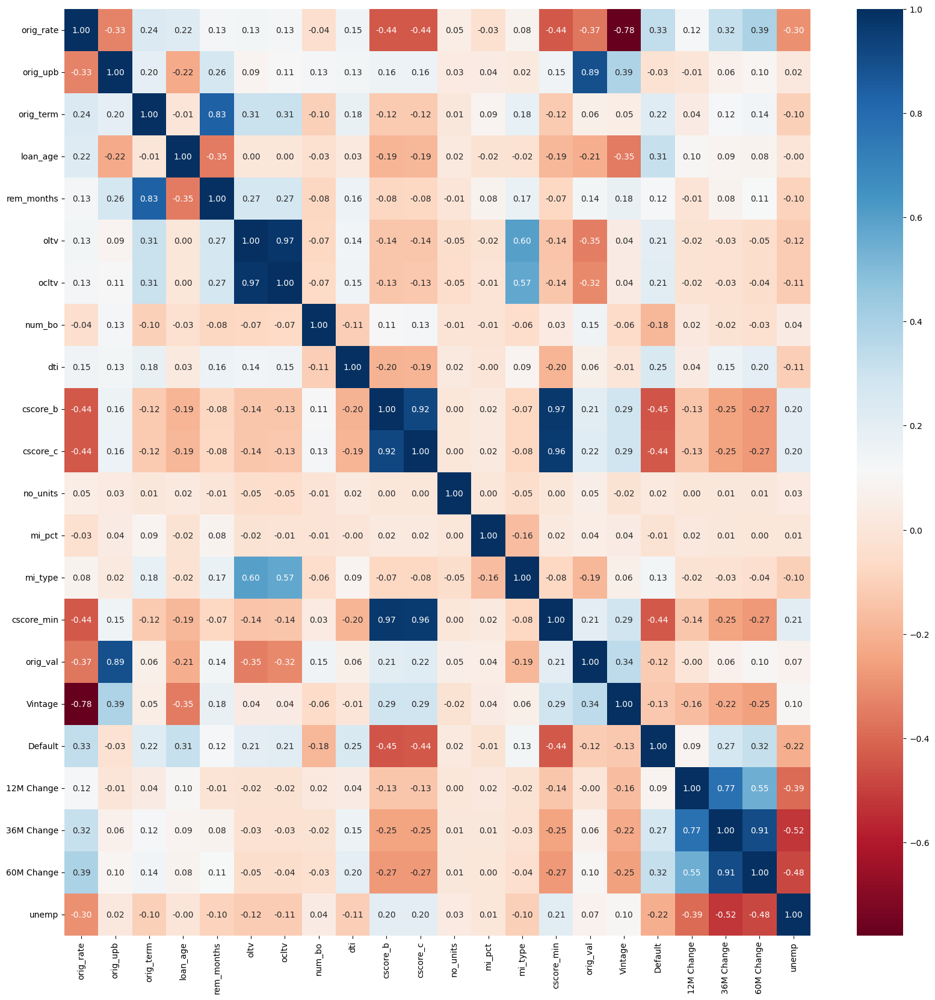

In [85]:
plt.figure(figsize=(20,20))
sns.heatmap(df4.corr(),annot=True, fmt = '.2f',cmap='RdBu');

# XGBClassifier 

## get_dummies

In [86]:
df4.num_bo.value_counts()

1.0    120452
2.0    113049
3.0       918
4.0       239
6.0         2
5.0         1
Name: num_bo, dtype: int64

In [87]:
df_model_xgb = pd.get_dummies(df4, columns=cat_vars+bin_vars)

In [88]:
df_model_xgb['unemp'] = pd.to_numeric(df_model_xgb['unemp'],errors='coerce')

In [89]:
df_model_xgb['bad_vintage']=df_model_xgb.apply(lambda x: 1 if x.Vintage in [2006,2007,2008] else 0,axis=1)

In [90]:
df_model_xgb[['bad_vintage','Default']].value_counts()

bad_vintage  Default
0            0          120100
             1           64965
1            1           37518
             0           12078
dtype: int64

In [91]:
df_model_xgb.columns

Index(['orig_rate', 'orig_upb', 'orig_term', 'loan_age', 'rem_months', 'oltv',
       'ocltv', 'dti', 'cscore_b', 'cscore_c', 'mi_pct', 'cscore_min',
       'orig_val', 'Vintage', 'Default', '12M Change', '36M Change',
       '60M Change', 'unemp', 'channel_B', 'channel_C', 'channel_R',
       'purpose_C', 'purpose_P', 'purpose_R', 'purpose_U', 'prop_CO',
       'prop_CP', 'prop_MH', 'prop_PU', 'prop_SF', 'no_units_1.0',
       'no_units_2.0', 'no_units_3.0', 'no_units_4.0', 'occ_stat_I',
       'occ_stat_P', 'occ_stat_S', 'mi_type_0.0', 'mi_type_1.0', 'mi_type_2.0',
       'mi_type_3.0', 'num_bo_1.0', 'num_bo_2.0', 'num_bo_3.0', 'num_bo_4.0',
       'num_bo_5.0', 'num_bo_6.0', 'first_flag_N', 'first_flag_Y',
       'relocation_mortgage_indicator_N', 'relocation_mortgage_indicator_Y',
       'high_balance_loan_indicator_N', 'high_balance_loan_indicator_Y',
       'bad_vintage'],
      dtype='object')

In [92]:
df_model_xgb.shape

(234661, 55)

In [93]:
df_model_xgb

,orig_rate,orig_upb,orig_term,loan_age,rem_months,oltv,ocltv,dti,cscore_b,cscore_c,...,num_bo_4.0,num_bo_5.0,num_bo_6.0,first_flag_N,first_flag_Y,relocation_mortgage_indicator_N,relocation_mortgage_indicator_Y,high_balance_loan_indicator_N,high_balance_loan_indicator_Y,bad_vintage
0,3.875,622.093241,360.0,15.0,345.0,90.0,90.0,37.0,791.0,791.0,...,0,0,0,0,1,1,0,1,0,0
1,6.125,371.483512,360.0,113.0,456.0,80.0,80.0,46.0,591.0,591.0,...,0,0,0,0,1,1,0,1,0,1
2,6.750,388.587185,360.0,62.0,298.0,90.0,90.0,39.0,726.0,723.0,...,0,0,0,1,0,1,0,1,0,1
4,5.625,320.936131,360.0,71.0,301.0,93.0,93.0,58.0,684.0,684.0,...,0,0,0,1,0,1,0,1,0,0
5,6.500,189.736660,360.0,74.0,286.0,87.0,87.0,22.0,656.0,656.0,...,0,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357678,6.375,471.168760,360.0,12.0,348.0,74.0,90.0,37.0,732.0,732.0,...,0,0,0,1,0,1,0,1,0,1
357679,4.125,651.152824,360.0,1.0,359.0,80.0,80.0,17.0,715.0,715.0,...,0,0,0,0,1,1,0,1,0,0
357681,5.250,618.869938,360.0,19.0,341.0,75.0,75.0,43.0,792.0,781.0,...,0,0,0,1,0,1,0,1,0,0
357683,3.375,325.576412,360.0,51.0,309.0,80.0,80.0,31.0,793.0,795.0,...,0,0,0,1,0,1,0,1,0,0


In [94]:
oot_index_names = df_model_xgb[(df_model_xgb['Vintage'] >= 2014)].index

In [95]:
df_oot=df_model_xgb.loc[oot_index_names]

In [96]:
df_oot.shape

(52026, 55)

In [97]:
df_ins=df_model_xgb.drop(oot_index_names)

In [98]:
df_oot.shape , df_ins.shape

((52026, 55), (182635, 55))

In [99]:
final_features = list(df_ins)
final_features

['orig_rate',
 'orig_upb',
 'orig_term',
 'loan_age',
 'rem_months',
 'oltv',
 'ocltv',
 'dti',
 'cscore_b',
 'cscore_c',
 'mi_pct',
 'cscore_min',
 'orig_val',
 'Vintage',
 'Default',
 '12M Change',
 '36M Change',
 '60M Change',
 'unemp',
 'channel_B',
 'channel_C',
 'channel_R',
 'purpose_C',
 'purpose_P',
 'purpose_R',
 'purpose_U',
 'prop_CO',
 'prop_CP',
 'prop_MH',
 'prop_PU',
 'prop_SF',
 'no_units_1.0',
 'no_units_2.0',
 'no_units_3.0',
 'no_units_4.0',
 'occ_stat_I',
 'occ_stat_P',
 'occ_stat_S',
 'mi_type_0.0',
 'mi_type_1.0',
 'mi_type_2.0',
 'mi_type_3.0',
 'num_bo_1.0',
 'num_bo_2.0',
 'num_bo_3.0',
 'num_bo_4.0',
 'num_bo_5.0',
 'num_bo_6.0',
 'first_flag_N',
 'first_flag_Y',
 'relocation_mortgage_indicator_N',
 'relocation_mortgage_indicator_Y',
 'high_balance_loan_indicator_N',
 'high_balance_loan_indicator_Y',
 'bad_vintage']

In [100]:
variables_to_remove = ['Default', 'Vintage']

# Create an empty list to store the updated final_features
updated_final_features = []

# Iterate through the original final_features
for var in final_features:
    # Check if the variable should not be removed
    if var not in variables_to_remove:
        # Append it to the updated_final_features list
        updated_final_features.append(var)

# Print the updated_final_features list
print(updated_final_features)


['orig_rate', 'orig_upb', 'orig_term', 'loan_age', 'rem_months', 'oltv', 'ocltv', 'dti', 'cscore_b', 'cscore_c', 'mi_pct', 'cscore_min', 'orig_val', '12M Change', '36M Change', '60M Change', 'unemp', 'channel_B', 'channel_C', 'channel_R', 'purpose_C', 'purpose_P', 'purpose_R', 'purpose_U', 'prop_CO', 'prop_CP', 'prop_MH', 'prop_PU', 'prop_SF', 'no_units_1.0', 'no_units_2.0', 'no_units_3.0', 'no_units_4.0', 'occ_stat_I', 'occ_stat_P', 'occ_stat_S', 'mi_type_0.0', 'mi_type_1.0', 'mi_type_2.0', 'mi_type_3.0', 'num_bo_1.0', 'num_bo_2.0', 'num_bo_3.0', 'num_bo_4.0', 'num_bo_5.0', 'num_bo_6.0', 'first_flag_N', 'first_flag_Y', 'relocation_mortgage_indicator_N', 'relocation_mortgage_indicator_Y', 'high_balance_loan_indicator_N', 'high_balance_loan_indicator_Y', 'bad_vintage']


In [101]:
X_train = df_ins.drop(columns=['Vintage', 'Default'])

In [102]:
y_train = df_ins['Default']

In [103]:
X_test = df_oot.drop(columns= ['Vintage' , 'Default'])

In [104]:
y_test = df_oot['Default']

In [105]:
X_train.shape , X_test.shape , y_train .shape , y_test.shape

((182635, 53), (52026, 53), (182635,), (52026,))

In [106]:
len(y_test) / len(X_train)  

0.28486325184110384

In [107]:
y_train.value_counts(), y_test.value_counts()

(0    97922
 1    84713
 Name: Default, dtype: int64,
 0    34256
 1    17770
 Name: Default, dtype: int64)

In [108]:
print('Test Data Percentage:',(len(X_test)/(len(X_train)+len(X_test)))*100)

Test Data Percentage: 22.170705826703202


# XGB Model Fit

In [109]:
Y_ins = y_train
Y_oot = y_test
df_ins = X_train
df_oot = X_test

In [107]:
def GridSearchCV_XGB_early_stoppping(param_grid, fit_params, scorer, cv, X, y,n_iter):
    """This function performs grid search for the best set of parameters of XGBoost model with early stopping.

    Args:
        param_grid (dict): The parameter ranges for which the function searches.
        fit_params (dict): The fitting parameters for XGBoost.
        scorer (_PredictScorer): The sklearn's scorer instance.
        cv (model_selection._split): The sklearn's split instance.
        X (DataFrame): The input data matrix.
        y (Series): The ground truth label.

    Returns:
        dict: The best set of parameters found via grid search.
    """
    if isinstance(X, pd.DataFrame):
        X = X.to_numpy()
    if isinstance(y, pd.Series):
        y = y.to_numpy()

    param_names, param_values = zip(*list(param_grid.items()))
    GS_unvrs_rand=random.sample(list(product(*param_values)), n_iter)
    cv_best_iterations = defaultdict(list)
    cv_results = defaultdict(list)

    for train_index, test_index in cv.split(X, y):
        X_in, X_out = X[train_index], X[test_index]
        y_in, y_out = y[train_index], y[test_index]

        fit_params_cv = deepcopy(fit_params)
        fit_params_cv['eval_set'] = [(X_out, y_out)]

  #      for value_combination in product(*param_values):
        for value_combination in GS_unvrs_rand:
            param_grid_cv = tuple(zip(param_names, value_combination))
            xgboost = XGBClassifier(**dict(param_grid_cv))

            xgboost.fit(X_in, y_in, **fit_params_cv)
            best_iteration = xgboost.get_num_boosting_rounds() if 'early_stopping_rounds' not in fit_params_cv else xgboost.best_iteration
            cv_best_iterations[param_grid_cv].append(best_iteration)

            score = scorer(xgboost, X_out, y_out)
            cv_results[param_grid_cv].append(score)

    best_params_xgb, score_list = max(cv_results.items(), key=lambda x: np.array(x[1]).mean())

    # Note that our XGBoost model may stop early,
    # so we calculate the mean of the actual number of estimators in each fold,
    # in place of the originally planned n_estimators after finishing cross validation.
    n_estimators = int(round(np.array(cv_best_iterations[best_params_xgb]).mean()))

    best_params_xgb = dict(best_params_xgb)
    best_params_xgb['n_estimators'] = n_estimators

    print ("Best score: {:.3f}".format(np.array(score_list).mean()))
    print ("Best Parameters: {}".format(best_params_xgb))

    return best_params_xgb

In [118]:
model = XGBClassifier()
pipeline = Pipeline(steps=[('classifier', model)])
param_grid = [
    {'classifier__n_estimators' : [10,20,30],
     'classifier__learning_rate' : [0.05,0.1,0.15],
     'classifier__max_depth' : [8,12,16],
     'classifier__min_child_weight' : [2,20],
     'classifier__gamma' : [0.05,0.5]
}]

In [119]:
cv_method = KFold(n_splits=4, shuffle=True)

In [120]:
xgb_grid = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=cv_method)

In [121]:
xgb_grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=4, random_state=None, shuffle=True),
             estimator=Pipeline(steps=[('classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None, gpu_id=None,
                                                      grow_poli...
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=None, ...))]),
             param_grid=[{'classifier__gamma': [0.05, 0.5],
                          'classifier__learning_rate': [0.05, 0.1, 0.15],
                          'classifier__max_depth': [8, 12, 16],
                          'classifier__min_child_weight': [2, 20],
                          'classifier__n_estimators': [10, 20, 30]}])

In [122]:
xgb_grid.best_params_

{'classifier__gamma': 0.05,
 'classifier__learning_rate': 0.15,
 'classifier__max_depth': 12,
 'classifier__min_child_weight': 20,
 'classifier__n_estimators': 30}

In [123]:
xgb_best_para = XGBClassifier(gamma=0.05,
                             learning_rate=0.15,
                             max_depth = 12,
                             min_child_weight = 20,
                             n_estimators = 30)

In [144]:
xgb_best_para.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.05, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=12, max_leaves=None,
              min_child_weight=20, missing=nan, monotone_constraints=None,
              n_estimators=30, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [146]:
y_pred = xgb_best_para.predict(X_test)
print(xgb_best_para.score(X_train,y_train))
print(accuracy_score(y_test, y_pred))

0.8634434801653571
0.7166993426363741


In [147]:
print('Training Score:', xgb_best_para.score(X_train, y_train))
print('Testing Score:', xgb_best_para.score(X_test, y_test))

Training Score: 0.8634434801653571
Testing Score: 0.7166993426363741


# Saving Best Model to Pickle

In [108]:
# import joblib
# grid_search_filename = 'xgboost_grid_search.joblib'
# # Save the grid search object, including the best model and parameters
# joblib.dump(xgb_grid, grid_search_filename)

In [110]:
import joblib
# Load the grid search object
loaded_grid_search = joblib.load("xgboost_grid_search.joblib")
# Access the best model and best parameters
best_model = loaded_grid_search.best_estimator_
best_params = loaded_grid_search.best_params_

In [111]:
best_params

{'classifier__gamma': 0.05,
 'classifier__learning_rate': 0.15,
 'classifier__max_depth': 12,
 'classifier__min_child_weight': 20,
 'classifier__n_estimators': 30}

In [112]:
best_model

Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0.05, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.15,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=12, max_leaves=None,
                               min_child_weight=20, missing=nan,
                               monotone_constraints=None, n_estimators=30,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

In [113]:
best_model.fit(X_train,y_train)

Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0.05, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.15,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=12, max_leaves=None,
                               min_child_weight=20, missing=nan,
                               monotone_constraints=None, n_estimators=30,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

In [114]:
xgbc_feature = best_model.named_steps['classifier']
xgbc_feature.feature_importances_

array([0.02887971, 0.00459594, 0.02474895, 0.05538837, 0.01550383,
       0.0110986 , 0.00985437, 0.00691857, 0.05764116, 0.09708509,
       0.00708652, 0.00747039, 0.00502847, 0.00824427, 0.00761613,
       0.00888053, 0.00464964, 0.00721742, 0.00322714, 0.00484197,
       0.00649549, 0.00719267, 0.00407189, 0.        , 0.00650623,
       0.        , 0.01441015, 0.0037441 , 0.0040171 , 0.00639002,
       0.00623226, 0.        , 0.        , 0.00640504, 0.00528937,
       0.00635715, 0.00953814, 0.00446165, 0.00880885, 0.        ,
       0.01503781, 0.0106788 , 0.        , 0.        , 0.        ,
       0.        , 0.00467252, 0.        , 0.01881823, 0.        ,
       0.        , 0.        , 0.47489542], dtype=float32)

In [115]:
loaded_grid_search

GridSearchCV(cv=KFold(n_splits=4, random_state=None, shuffle=True),
             estimator=Pipeline(steps=[('classifier',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None, gpu_id=None,
                                                      grow_poli...
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=None, ...))]),
             param_grid=[{'classifier__gamma': [0.05, 0.5],
                          'classifier__learning_rate': [0.05, 0.1, 0.15],
                          'classifier__max_depth': [8, 12, 16],
                          'classifier__min_child_weight': [2, 20],
                          'classifier__n_estimators': [10, 20, 30]}])

In [116]:
X_train.columns

Index(['orig_rate', 'orig_upb', 'orig_term', 'loan_age', 'rem_months', 'oltv',
       'ocltv', 'dti', 'cscore_b', 'cscore_c', 'mi_pct', 'cscore_min',
       'orig_val', '12M Change', '36M Change', '60M Change', 'unemp',
       'channel_B', 'channel_C', 'channel_R', 'purpose_C', 'purpose_P',
       'purpose_R', 'purpose_U', 'prop_CO', 'prop_CP', 'prop_MH', 'prop_PU',
       'prop_SF', 'no_units_1.0', 'no_units_2.0', 'no_units_3.0',
       'no_units_4.0', 'occ_stat_I', 'occ_stat_P', 'occ_stat_S', 'mi_type_0.0',
       'mi_type_1.0', 'mi_type_2.0', 'mi_type_3.0', 'num_bo_1.0', 'num_bo_2.0',
       'num_bo_3.0', 'num_bo_4.0', 'num_bo_5.0', 'num_bo_6.0', 'first_flag_N',
       'first_flag_Y', 'relocation_mortgage_indicator_N',
       'relocation_mortgage_indicator_Y', 'high_balance_loan_indicator_N',
       'high_balance_loan_indicator_Y', 'bad_vintage'],
      dtype='object')

In [117]:
# Assuming X_train.columns is a pandas Index object, convert it to a list
X_train_columns = X_train.columns.tolist()

# List the columns that are in X_train but not in final_features
columns_not_in_final_features = [col for col in final_features if col not in X_train_columns]

# Print or work with the columns that are not in final_features
print(columns_not_in_final_features)


['Vintage', 'Default']


# Default EDA

In [118]:
ypred = pd.DataFrame(best_model.predict_proba(X_train.values),columns=['predA','pred'])
df1 = pd.DataFrame(X_train.values, columns =updated_final_features)
df2 = pd.DataFrame(y_train.values, columns =['target'])
df3 = df.drop(oot_index_names) ## df_oot=df_model.loc[oot_index_names]s ##
df_ins_4plot=pd.concat([df1,df2,df3[['loan_id','act_period','Vintage']],ypred],axis=1)

In [119]:
ypred_oot = pd.DataFrame(best_model.predict_proba(X_test.values),columns=['predA','pred'])
df1_oot = pd.DataFrame(X_test.values, columns =updated_final_features)
df2_oot = pd.DataFrame(y_test.values, columns =['target'])
df3_oot=df.loc[oot_index_names] ## df_oot=df_model.loc[oot_index_names]
df_oot_4plot=pd.concat([df1_oot,df2_oot,df3_oot[['loan_id','act_period','Vintage']],ypred_oot],axis=1)

In [120]:
x_var='Vintage'
x_var_plot='Vintage'
y_var='target'
y_pred='pred'
bin_size=6

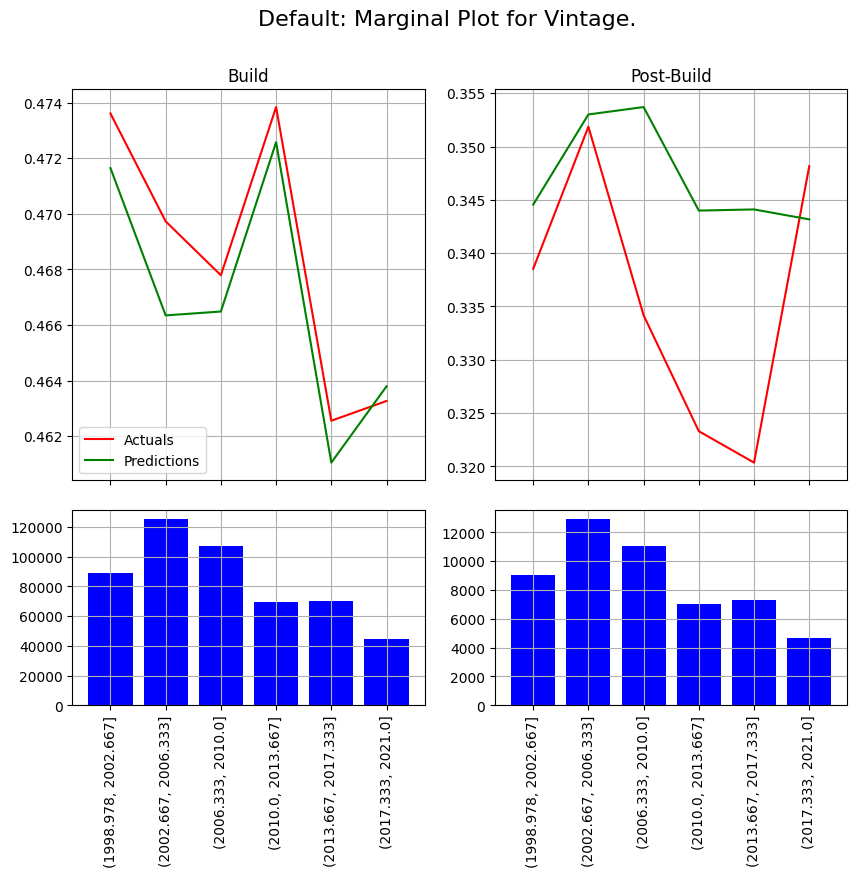

In [121]:
import matplotlib.pyplot as plt
from matplotlib import gridspec
fig = plt.figure(figsize=(10,8))
fig.suptitle('Default: Marginal Plot for {}.'.format(x_var_plot), fontsize=16)
gs = gridspec.GridSpec(2, 2, hspace=.1,height_ratios=[2, 1])


# the first subplot for model performance along the feature of interest in-sample
ax0 = plt.subplot(gs[0])

s=df_ins_4plot.groupby([pd.cut(df_ins_4plot[x_var],bins=bin_size)]).mean() [y_var]
line0, = ax0.plot(s.index.astype(str), s.values, color='r',label='line1')
sp=df_ins_4plot.groupby([pd.cut(df_ins_4plot[x_var],bins=bin_size)]).mean() [y_pred]
line1, = ax0.plot(sp.index.astype(str), sp.values, color='g',label='line2')
plt.title("Build")

# the second subplot for counts for that feature in-sample
# shared axis X
ax1 = plt.subplot(gs[2], sharex = ax0)
ax0.grid()
ax1.grid()



t=df_ins_4plot.groupby([pd.cut(df_ins_4plot[x_var],bins=bin_size)]).count() [x_var]
plt.setp(ax0.get_xticklabels(), visible=False)
line2= ax1.bar(t.index.astype(str), t.values, color='b')
plt.xticks(rotation = 90)
# remove last tick label for the second subplot
yticks = ax1.yaxis.get_major_ticks()
yticks[-1].label1.set_visible(False)
# put legend on first subplot
ax0.legend((line0, line1), ('Actuals', 'Predictions'), loc='lower left')


# the third subplot for model performance along the feature of interest in holdout

ax2 = plt.subplot(gs[1])
# log scale for axis Y of the first subplot
s=df_oot_4plot.groupby([pd.cut(df_oot_4plot[x_var],bins=bin_size)]).mean() [y_var]
line4, = ax2.plot(s.index.astype(str), s.values, color='r',label='line1')
sp=df_oot_4plot.groupby([pd.cut(df_oot_4plot[x_var],bins=bin_size)]).mean() [y_pred]+0.20
line5, = ax2.plot(sp.index.astype(str), sp.values, color='g',label='line2')
plt.title("Post-Build")

# # the fourth subplot for counts for that feature in holdout
# shared axis X
ax3 = plt.subplot(gs[3], sharex = ax2)
ax2.grid()
ax3.grid()



t=df_oot_4plot.groupby([pd.cut(df_oot_4plot[x_var],bins=bin_size)]).count() [x_var]
plt.setp(ax2.get_xticklabels(), visible=False)
line6= ax3.bar(t.index.astype(str), t.values, color='b')


#plt.xticks(ax2.get_xticklabels(), [fmt(i) for i in x_sum], rotation=90)
plt.xticks(rotation = 90)
# remove last tick label for the second subplot
yticks = ax3.yaxis.get_major_ticks()
yticks[-1].label1.set_visible(False)

plt.show()




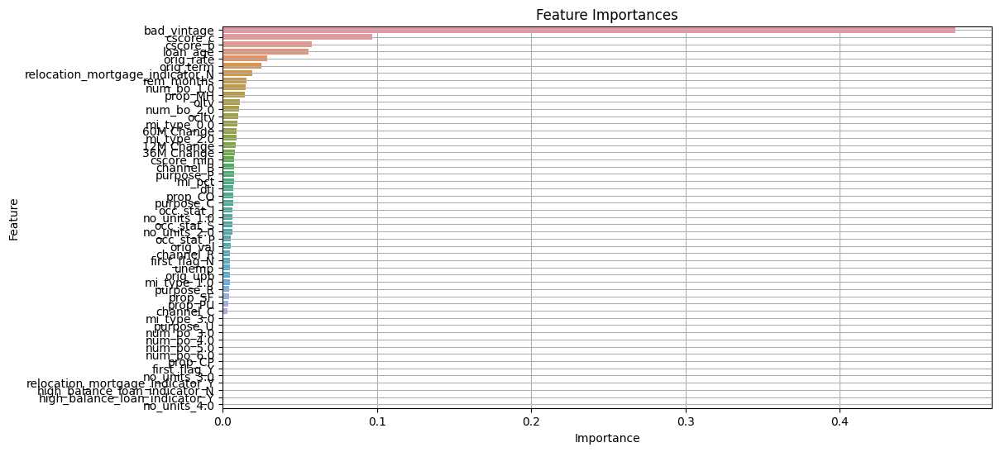

In [122]:
# Get feature importances from the trained model
feature_importances = xgbc_feature.feature_importances_

# Get the corresponding feature names (assuming your features are in a DataFrame)
feature_names = df_ins.columns

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Create a bar plot to visualize feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.grid()
plt.show()


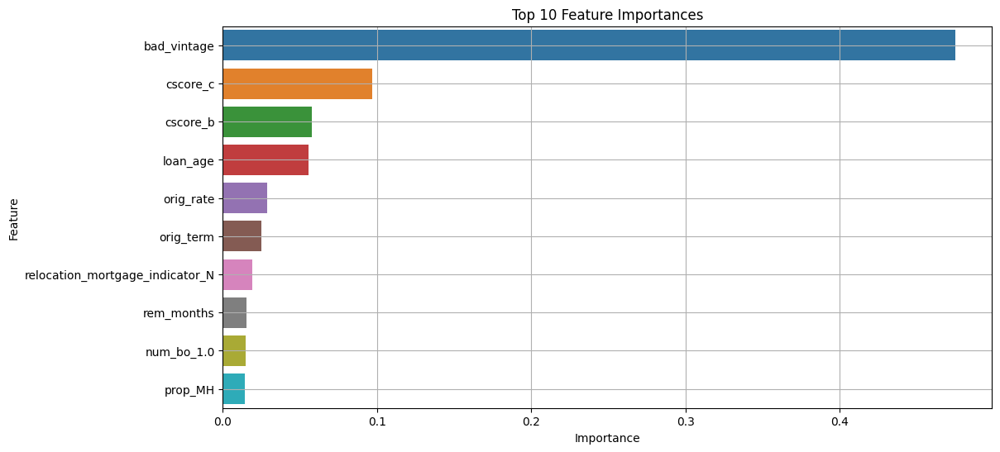

In [123]:
# Get the top 10 most important features
top_10_features = feature_importance_df.head(10)

# Create a bar plot to visualize the top 10 feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=top_10_features)
plt.title('Top 10 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.grid()
plt.show()


[[0.9205781  0.07942186]
 [0.7969411  0.20305888]
 [0.7270975  0.27290252]
 ...
 [0.9907222  0.00927783]
 [0.9712286  0.0287714 ]
 [0.9883902  0.0116098 ]]
[[24074 10182]
 [ 4002 13768]]


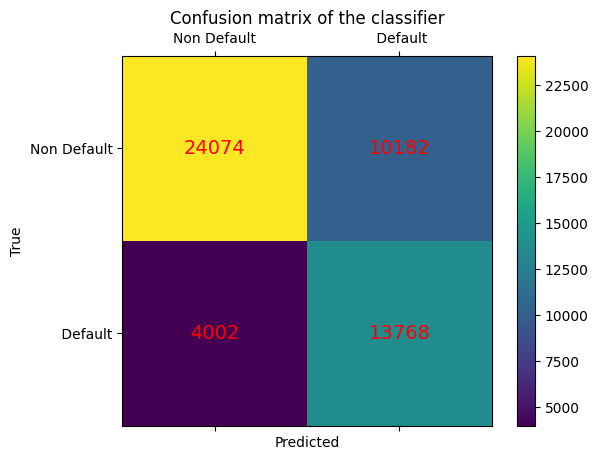

f1: 66.00%


0.8166681667865667

In [124]:
from sklearn.metrics import confusion_matrix, f1_score,roc_auc_score

threshold=0.07
ypred = best_model.predict_proba(df_oot.values)
print(ypred)
## added Sep 2023
ypred_binary = (ypred[:, 1] >= threshold).astype(int)
np.unique(ypred_binary,return_counts=True)
#cm = confusion_matrix(Y_oot,ypred,labels=[0, 1])
cm = confusion_matrix(Y_oot,ypred_binary)
print(cm)
labels=['Non Default', ' Default']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
# Add class counts to the heatmap cells
for i in range(2):
    for j in range(2):
        ax.text(j + 0.0, i + 0.0, str(cm[i, j]), ha='center', va='center', color='red',fontsize=14)


plt.show()
f1 = f1_score(Y_oot, ypred_binary)
print("f1: %.2f%%" % (f1 * 100.0)) 

ypred_p = best_model.predict_proba(df_oot.values)
roc_auc_score(Y_oot, ypred_p[:, 1])

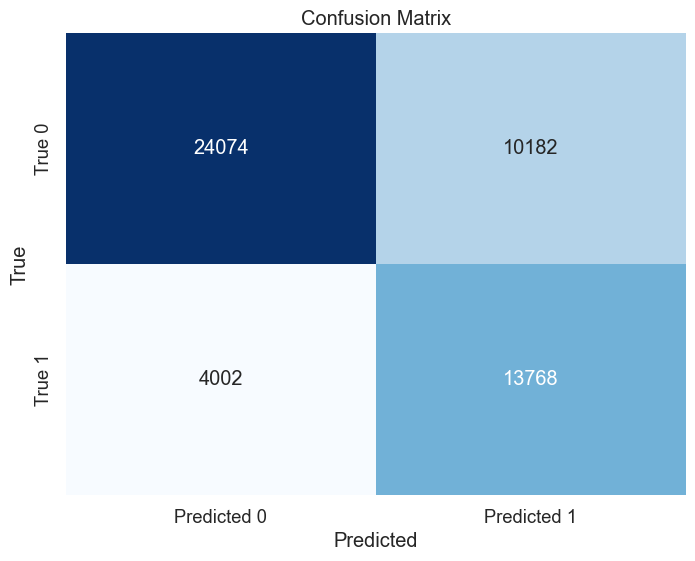

In [125]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Sample true labels and predicted labels (replace these with your own data)


# Calculate the confusion matrix
confusion_mat = cm

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)  # Adjust font size for better visualization
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['True 0', 'True 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


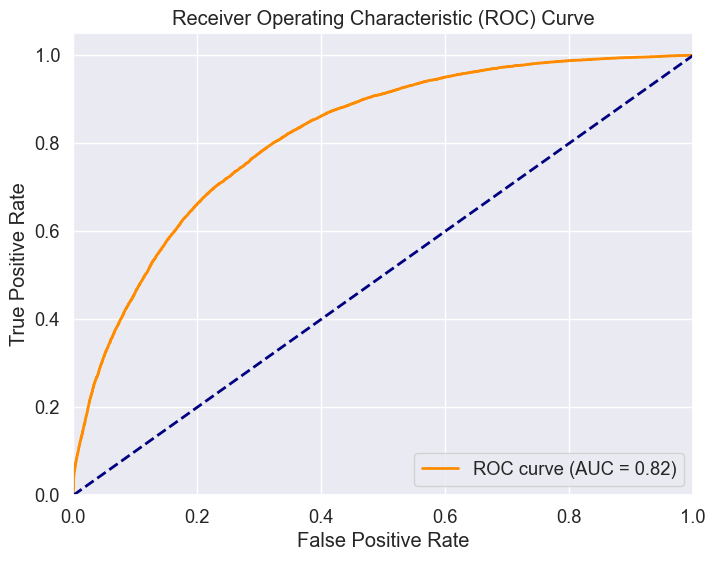

In [126]:
#roc_auc_score(Y_oot, ypred_p[:, 1])
ypred_p = best_model.predict_proba(X_test.values)

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, ypred_p[:, 1])
roc_auc = roc_auc_score(y_test, ypred_p[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [127]:
y_pred , y_test

('pred',
 0         1
 13        1
 21        1
 47        1
 49        1
          ..
 357663    0
 357671    0
 357679    0
 357681    0
 357685    0
 Name: Default, Length: 52026, dtype: int64)

# EDA

In [128]:
x_var='Vintage'
x_var_plot='Vintage'
y_var='target'
y_pred='pred'
bin_size=6


In [129]:
ypred = pd.DataFrame(best_model.predict_proba(df_ins.values),columns=['predA','pred'])
df1 = pd.DataFrame(df_ins.values, columns =updated_final_features)
df2 = pd.DataFrame(Y_ins.values, columns =['target'])
df3 = df.drop(oot_index_names) ## df_oot=df_model.loc[oot_index_names]s ##
df_ins_4plot_xgb=pd.concat([df1,df2,df3[['loan_id','act_period','Vintage']],ypred],axis=1)

In [130]:
ypred_oot = pd.DataFrame(best_model.predict_proba(df_oot.values),columns=['predA','pred'])
df1_oot = pd.DataFrame(df_oot.values, columns =updated_final_features)
df2_oot = pd.DataFrame(Y_oot.values, columns =['target'])
df3_oot=df.loc[oot_index_names] ## df_oot=df_model.loc[oot_index_names]
df_oot_4plot_xgb=pd.concat([df1_oot,df2_oot,df3_oot[['loan_id','act_period','Vintage']],ypred_oot],axis=1)

In [131]:


def marginal_plots(df_ins_4plot,df_oot_4plot,x_var,x_var_plot,y_var,y_pred,bin_size=6):
    fig = plt.figure(figsize=(10,8))
    fig.suptitle('Default: Marginal Plot for {}.'.format(x_var_plot), fontsize=16)
    gs = gridspec.GridSpec(2, 2, hspace=.1,height_ratios=[2, 1])


    # the first subplot for model performance along the feature of interest in-sample
    ax0 = plt.subplot(gs[0])

    s=df_ins_4plot.groupby([pd.cut(df_ins_4plot[x_var],bins=bin_size)]).mean() [y_var]
    line0, = ax0.plot(s.index.astype(str), s.values, color='r',label='line1')
    sp=df_ins_4plot.groupby([pd.cut(df_ins_4plot[x_var],bins=bin_size)]).mean() [y_pred]
    line1, = ax0.plot(sp.index.astype(str), sp.values, color='g',label='line2')
    plt.title("Build")

    # the second subplot for counts for that feature in-sample
    # shared axis X
    ax1 = plt.subplot(gs[2], sharex = ax0)
    ax0.grid()
    ax1.grid()



    t=df_ins_4plot.groupby([pd.cut(df_ins_4plot[x_var],bins=bin_size)]).count() [x_var]
    plt.setp(ax0.get_xticklabels(), visible=False)
    line2= ax1.bar(t.index.astype(str), t.values, color='b')
    plt.xticks(rotation = 90)
    # remove last tick label for the second subplot
    yticks = ax1.yaxis.get_major_ticks()
    yticks[-1].label1.set_visible(False)
    # put legend on first subplot
    ax0.legend((line0, line1), ('Actuals', 'Predictions'), loc='lower left')


    # the third subplot for model performance along the feature of interest in holdout

    ax2 = plt.subplot(gs[1])
    # log scale for axis Y of the first subplot
    s=df_oot_4plot.groupby([pd.cut(df_oot_4plot[x_var],bins=bin_size)]).mean() [y_var]
    line4, = ax2.plot(s.index.astype(str), s.values, color='r',label='line1')
    sp=df_oot_4plot.groupby([pd.cut(df_oot_4plot[x_var],bins=bin_size)]).mean() [y_pred]+0.20
    line5, = ax2.plot(sp.index.astype(str), sp.values, color='g',label='line2')
    plt.title("Post-Build")

    # # the fourth subplot for counts for that feature in holdout
    # shared axis X
    ax3 = plt.subplot(gs[3], sharex = ax2)
    ax2.grid()
    ax3.grid()



    t=df_oot_4plot.groupby([pd.cut(df_oot_4plot[x_var],bins=bin_size)]).count() [x_var]
    plt.setp(ax2.get_xticklabels(), visible=False)
    line6= ax3.bar(t.index.astype(str), t.values, color='b')


    #plt.xticks(ax2.get_xticklabels(), [fmt(i) for i in x_sum], rotation=90)
    plt.xticks(rotation = 90)
    # remove last tick label for the second subplot
    yticks = ax3.yaxis.get_major_ticks()
    yticks[-1].label1.set_visible(False)

    plt.show()




In [132]:
x_var_list=['Vintage',
            'orig_rate',
 'orig_upb',
 'orig_val',
 'orig_term',
 'loan_age',
# 'rem_months',
 'oltv',
 'ocltv',
 'dti',
 'cscore_b',
 'cscore_c',
 'cscore_min',
 'mi_pct',
 '12M Change',
 '36M Change',
 '60M Change',
 'unemp']
x_var_name=['Vintage',
            'Origination Rate',
            'Origination Balance',
            'Origination Value',
            'Origination Term',
            'Loan Age',
#            'Remaining Months',
            'Origination LTV',
           'Origination CLTV',
            'Debt to Income',
            'Borrower FICO',
            'CoBorrower FICO',
            'Minimum FICO',
            'Mortgage Insurance Percent',
            '12M HPA',
            '36M HPA',
            '60M HPA',
            'Unemployment']


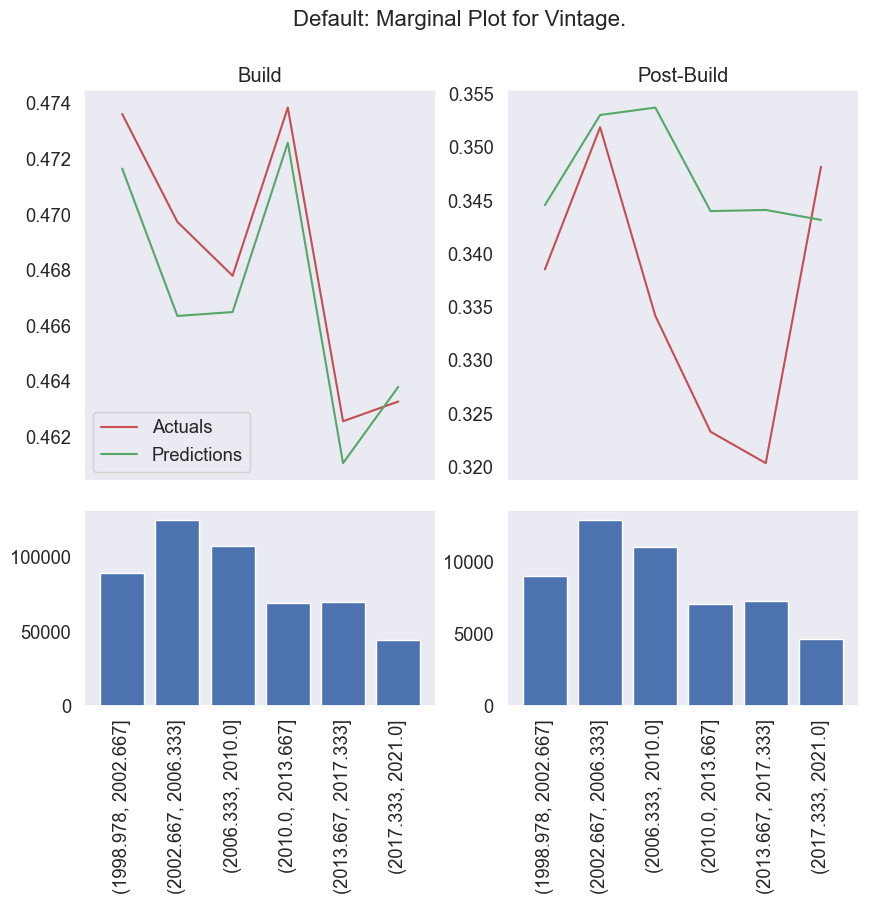

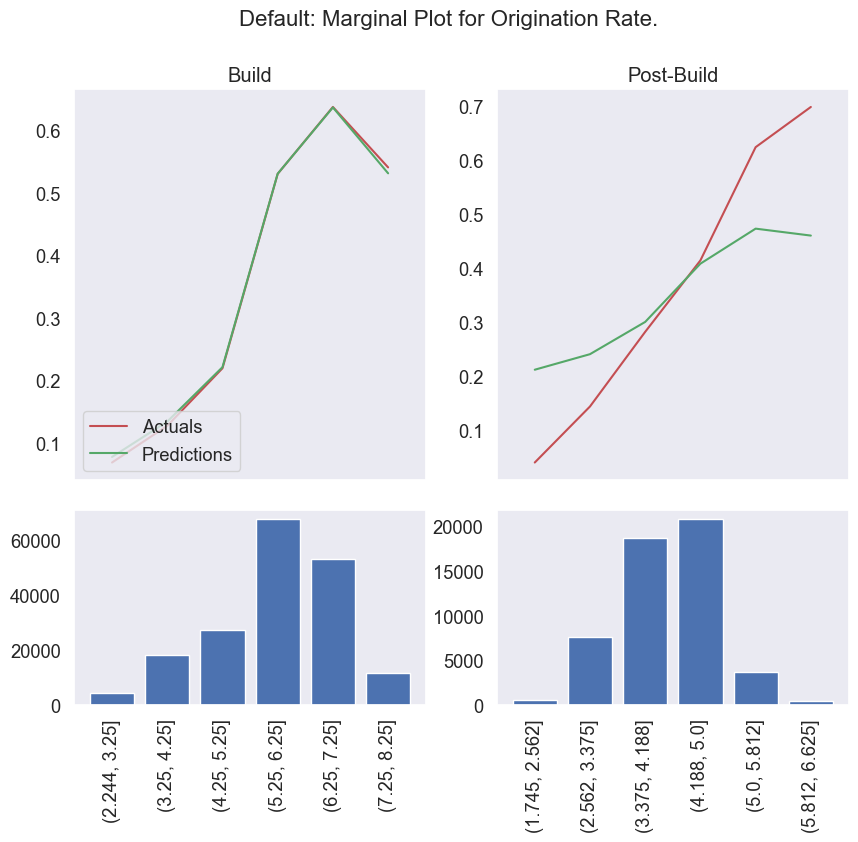

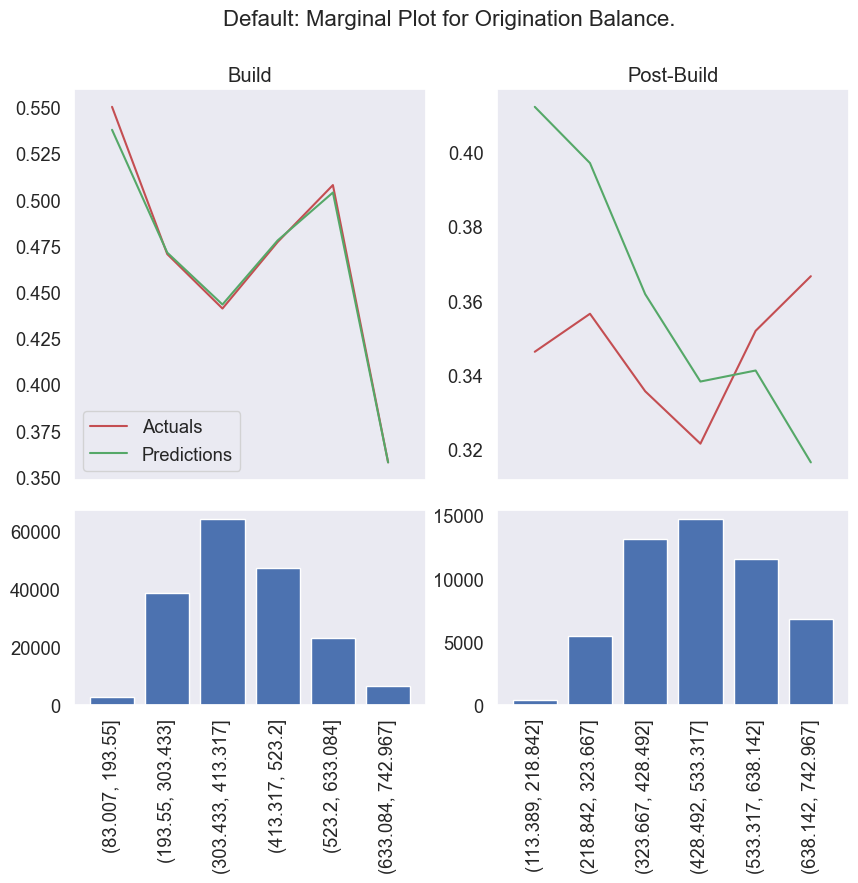

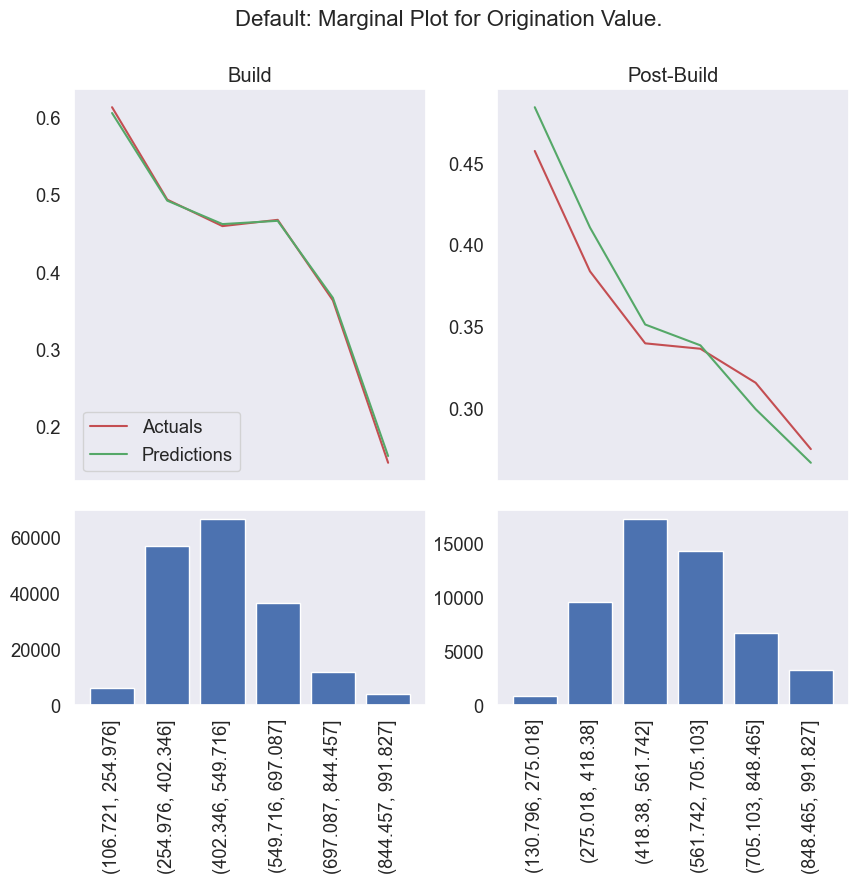

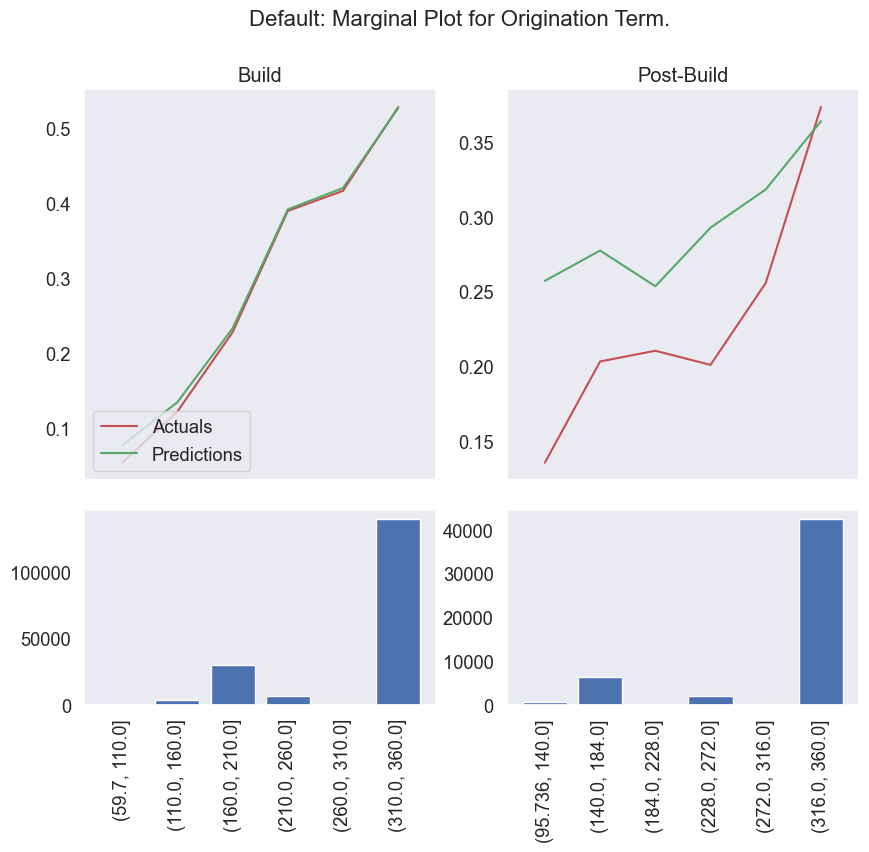

...

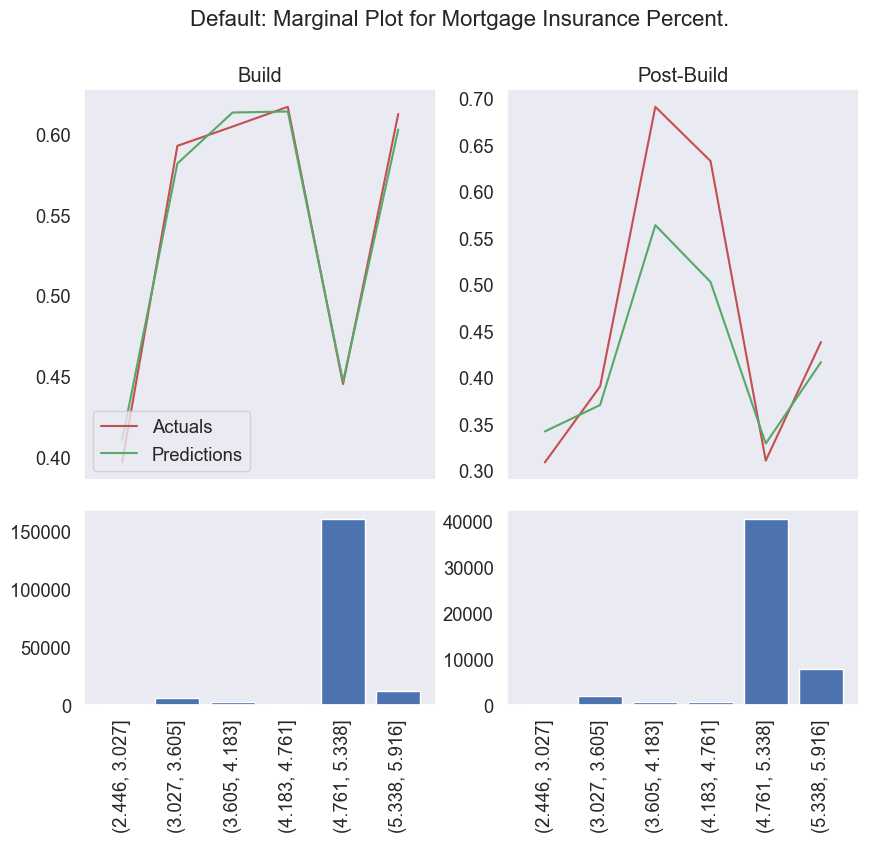

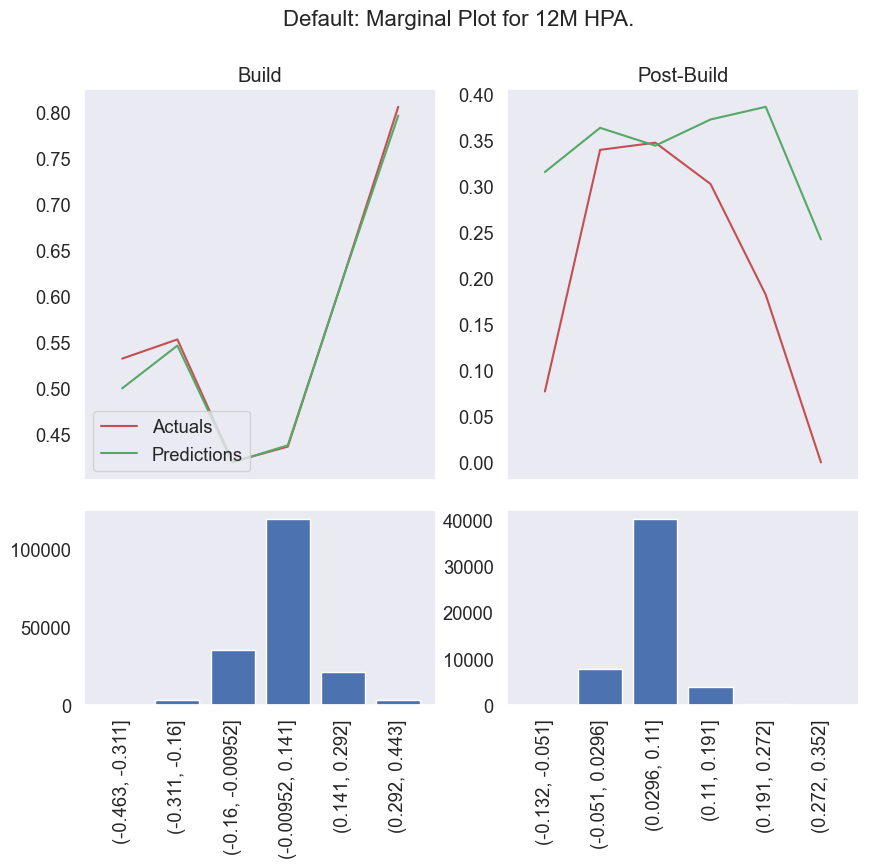

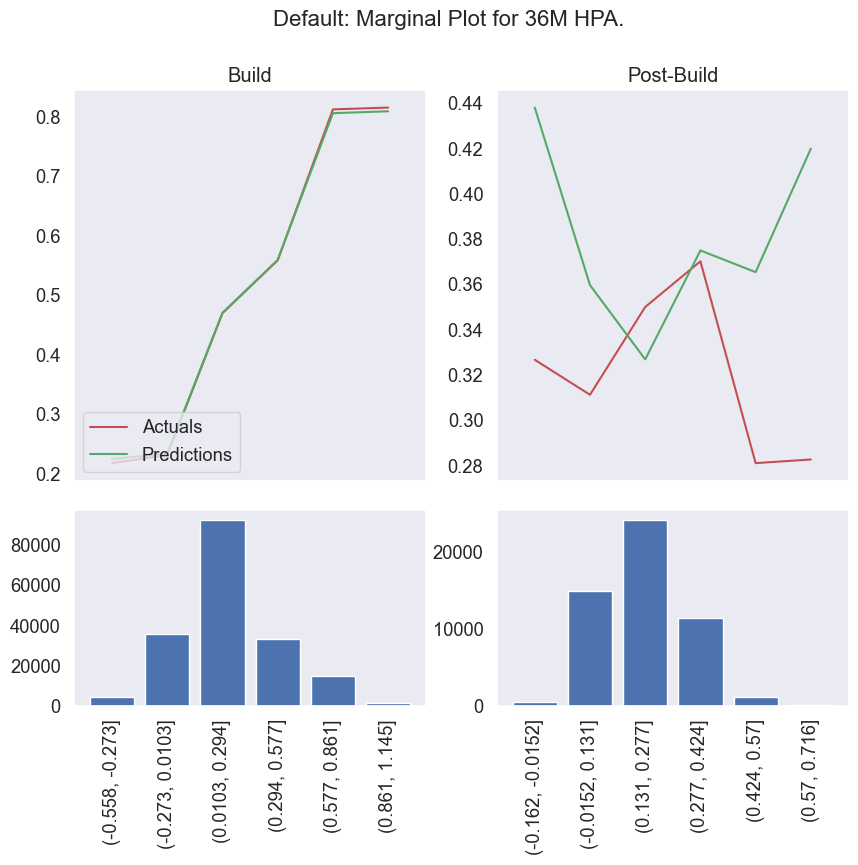

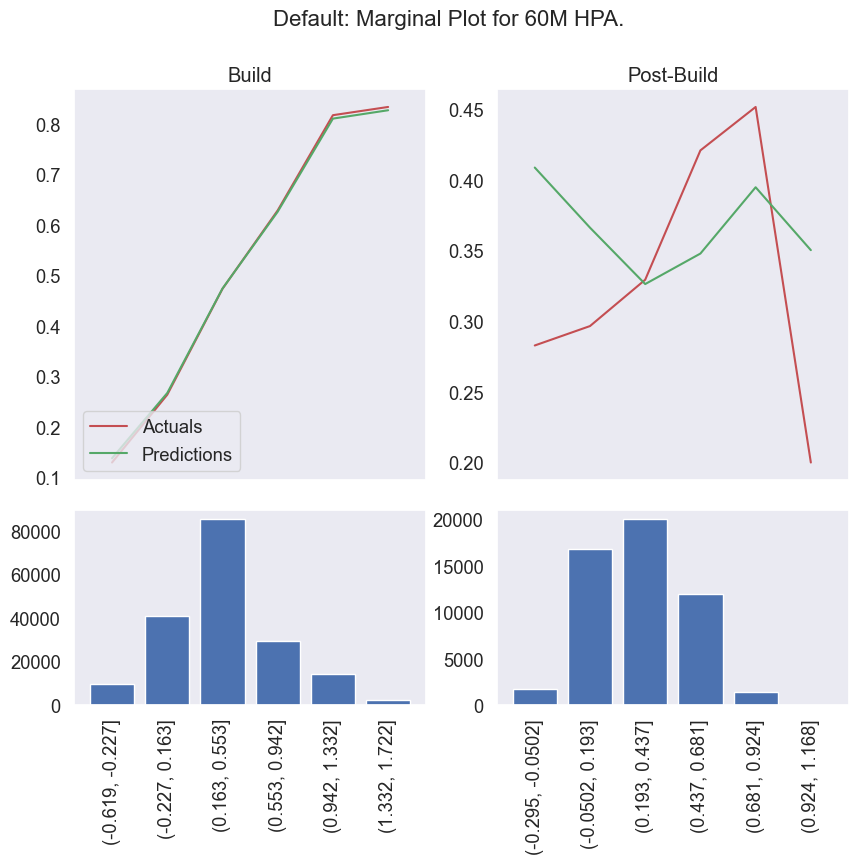

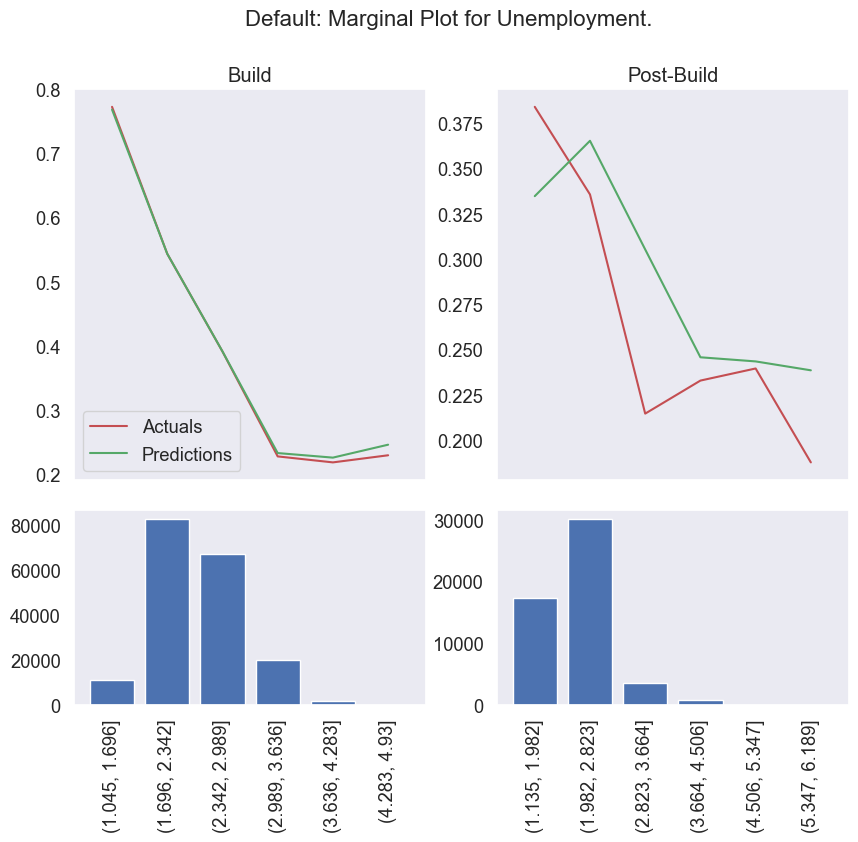

In [133]:

for i,j in zip(x_var_list, x_var_name):
    marginal_plots(df_ins_4plot_xgb,df_oot_4plot_xgb,i,j,y_var,y_pred,bin_size)

# Logistic Regression

In [134]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [135]:
df_model_log = pd.get_dummies(df_model, drop_first=True, columns=cat_vars+bin_vars)
df_model_log.drop(['Vintage'],axis=1,inplace=True)

In [136]:
df_model_log.isna().sum().sum()

0

In [137]:
### there are different types of scalers but for interpretability purposes I will center the numerical variables at their mean


from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

x = df_model_log[num_vars].values #returns a numpy array
print(dict(zip(num_vars,x.mean(axis=0))))
print(dict(zip(num_vars,x.std(axis=0))))
scaled_mean=x.mean(axis=0)
scaled_std=x.std(axis=0)
"""
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_model_log = pd.DataFrame(x_scaled, index = df_model_log.index, columns = df_model_log.columns)
"""
"""power_trans=preprocessing.power_transform(x, standardize=True, copy=True)
#x_power_trans=power_trans.fit_transform(x)
df_model_log_num=pd.DataFrame(power_trans, index = df_model_log.index, columns = num_vars)"""

scaler = StandardScaler()

# Fit and transform the data
centered_data = scaler.fit_transform(x)

# The centered data will have a mean close to zero
print(np.mean(centered_data))
# Output: [0.]
df_model_log_num=pd.DataFrame(centered_data, index = df_model_log.index, columns = num_vars)

{'orig_rate': 5.434146296146355, 'orig_upb': 190229.91038135864, 'orig_val': 274023.5668143383, 'orig_term': 321.7123637928757, 'loan_age': 55.7250373943689, 'rem_months': 273.42734838767416, 'oltv': 73.2751074954935, 'ocltv': 74.10656223232664, 'dti': 36.05369873988435, 'cscore_b': 720.6255960726324, 'cscore_c': 721.819309557191, 'cscore_min': 715.8573814992692, 'mi_pct': 24.77790088681119, '12M Change': 0.05036579755171938, '36M Change': 0.19134178120705514, '60M Change': 0.33365531938453585, 'unemp': 5.73851002083857}
{'orig_rate': 1.264571231155936, 'orig_upb': 111124.50524266943, 'orig_val': 179148.60808659348, 'orig_term': 73.28151796647718, 'loan_age': 41.47252387016116, 'rem_months': 89.11027717592363, 'oltv': 16.35818931047985, 'ocltv': 16.449272821307073, 'dti': 11.589301390388423, 'cscore_b': 61.16612344659058, 'cscore_c': 61.36443970132158, 'cscore_min': 61.22869495145147, 'mi_pct': 3.4452944083047967, '12M Change': 0.08515505699072082, '36M Change': 0.22933640263908386, '6

In [138]:
df_model_log_num

,orig_rate,orig_upb,orig_val,orig_term,loan_age,rem_months,oltv,ocltv,dti,cscore_b,cscore_c,cscore_min,mi_pct,12M Change,36M Change,60M Change,unemp
0,-1.232945,1.770717,0.870654,0.522473,-0.981976,0.803192,1.022417,0.966209,0.081653,1.150545,1.127374,1.227245,0.064464,-0.094037,0.128890,0.631874,-1.243450
1,0.546315,-0.470013,-0.566700,0.522473,1.381034,2.048839,0.411102,0.358280,0.858231,-2.119238,-2.131842,-2.039197,0.064464,-0.737423,-0.587021,-0.467576,-0.213353
2,1.040553,-0.353027,-0.593060,0.522473,0.151304,0.275756,1.022417,0.966209,0.254226,0.087866,0.019241,0.116655,0.064464,-0.643851,1.474954,1.544255,-0.926497
4,0.150924,-0.784975,-0.911371,0.522473,0.368315,0.309422,1.205811,1.148588,1.893669,-0.598789,-0.616307,-0.520301,1.515719,0.134727,-0.168881,-0.324869,0.460172
5,0.842858,-1.387902,-1.298610,0.522473,0.440652,0.141091,0.839023,0.783830,-1.212644,-1.056559,-1.072597,-0.977603,0.064464,0.126145,0.068061,0.054482,0.579029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357678,0.744010,0.285896,0.144999,0.522473,-1.054313,0.836858,0.044314,0.966209,0.081653,0.185959,0.165905,0.263645,0.064464,0.092004,-0.105845,-0.201581,-0.015257
357679,-1.035249,2.103677,1.428850,0.522473,-1.319549,0.960301,0.411102,0.358280,-1.644077,-0.091972,-0.111128,-0.014003,0.064464,-0.255878,-0.427724,-0.434433,-0.332210
357681,-0.145620,1.734722,1.320932,0.522473,-0.885527,0.758304,0.105445,0.054315,0.599372,1.166894,0.964413,1.063923,0.064464,-0.102531,-0.203464,-0.268239,-0.609544
357683,-1.628336,-0.757978,-0.789979,0.522473,-0.113932,0.399198,0.411102,0.358280,-0.436066,1.183243,1.192559,1.259910,0.064464,-0.128058,-1.170983,-2.148575,1.965699


In [139]:
### since I have only centered numeric features I need to reconstitute the model dataset
l_cat=list(df_model_log.columns)
#l_cat.remove(num_vars)
l_cat = [i for i in l_cat if i not in num_vars]
l_cat.remove('Default')

In [140]:
df_model_log = pd.concat([df_model_log_num, df_model_log[l_cat],df_model_log['Default']], axis=1)

In [141]:
### the variables below created issues with logistic regression. Therefore I dropped them
### TO DO: create a variable for num_bo so I can combine any number of borrowers greater than 1 into one category

l=list(df_model_log.columns)
l.remove('Default')
#l.remove('cscore_c')
#l.remove('cscore_min')
#l.remove('ocltv')
l.remove('mi_type_3.0')
#l.remove('num_bo_5.0')
#l.remove('num_bo_6.0')
#l.remove('num_bo_7.0')
#l.remove('high_balance_loan_indicator')
#l.remove('Vintage')

In [142]:
df_oot_log=df_model_log.loc[oot_index_names]
X_oot_log=df_oot_log[l]
Y_oot_log=df_oot_log["Default"]

In [143]:
df_ins_log=df_model_log.drop(oot_index_names)
X_ins_log=df_ins_log[l]
Y_ins_log=df_ins_log["Default"]

In [144]:
Y_ins_log.value_counts(dropna=False)

0    97922
1    84713
Name: Default, dtype: int64

# Logistic Regression w/ GridSearch

In [145]:
model_log = LogisticRegression(max_iter=100, n_jobs=-1)
pipeline = Pipeline(steps=[('selector', SelectKBest(f_classif, k=16)), ('classifier', model_log)])
param_grid = [
    {'classifier__penalty' : ['l1', 'l2','elasticnet'],
     'classifier__C' : np.linspace(0.1, 0.3, 4),
     'classifier__solver' : ['liblinear', 'lbfgs']
}]

In [146]:
log_reg_grid = GridSearchCV( pipeline, param_grid)

In [147]:
log_reg_grid.fit(X_ins_log, Y_ins_log)

GridSearchCV(estimator=Pipeline(steps=[('selector', SelectKBest(k=16)),
                                       ('classifier',
                                        LogisticRegression(n_jobs=-1))]),
             param_grid=[{'classifier__C': array([0.1       , 0.16666667, 0.23333333, 0.3       ]),
                          'classifier__penalty': ['l1', 'l2', 'elasticnet'],
                          'classifier__solver': ['liblinear', 'lbfgs']}])

In [148]:
print('best_parameters :', log_reg_grid.best_params_)
print('accuracy :', log_reg_grid.best_score_)

best_parameters : {'classifier__C': 0.23333333333333334, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear'}
accuracy : 0.8001642620527282


In [149]:
print('Training Score:', log_reg_grid.score(X_ins_log, Y_ins_log))
print('Testing Score:', log_reg_grid.score(X_oot_log, Y_oot_log))

Training Score: 0.8000766556246065
Testing Score: 0.740399031253604


In [150]:
model_LR5 = LogisticRegression(max_iter=1000, C = 0.23333333333333334, penalty= 'l2', solver = 'liblinear')
pipeline_log = Pipeline(steps=[('selector', SelectKBest(f_classif, k=16)), ('classifier', model_LR5)])
pipeline_log.fit(X_ins_log,Y_ins_log)
print('Training Score:', pipeline_log.score(X_ins_log, Y_ins_log))
print('Testing Score:', pipeline_log.score(X_oot_log, Y_oot_log))

Training Score: 0.8000766556246065
Testing Score: 0.740399031253604


In [151]:
model_LR6 = LogisticRegression(max_iter=1000, C = 23333333333333334, penalty= 'l2', solver = 'liblinear')
pipeline_log1 = Pipeline(steps=[('classifier', model_LR6)])
pipeline_log1.fit(X_ins_log,Y_ins_log)
print('Training Score:', pipeline_log1.score(X_ins_log, Y_ins_log))
print('Testing Score:', pipeline_log1.score(X_oot_log, Y_oot_log))

Training Score: 0.8086949379910751
Testing Score: 0.7450505516472533


In [152]:
pipeline_log[:-1].get_feature_names_out()

array(['orig_rate', 'orig_term', 'loan_age', 'rem_months', 'oltv',
       'ocltv', 'dti', 'cscore_b', 'cscore_c', 'cscore_min', '36M Change',
       '60M Change', 'unemp', 'purpose_R', 'mi_type_1.0', 'num_bo_2.0'],
      dtype=object)

In [153]:
pipeline_log.steps[0][1]

SelectKBest(k=16)

In [154]:
pipeline_log.steps[1][1]

LogisticRegression(C=0.23333333333333334, max_iter=1000, solver='liblinear')

In [155]:
a1= pipeline_log[:-1].get_feature_names_out()

In [156]:
a1

array(['orig_rate', 'orig_term', 'loan_age', 'rem_months', 'oltv',
       'ocltv', 'dti', 'cscore_b', 'cscore_c', 'cscore_min', '36M Change',
       '60M Change', 'unemp', 'purpose_R', 'mi_type_1.0', 'num_bo_2.0'],
      dtype=object)

In [157]:
len(pipeline_log[:-1].get_feature_names_out())

16

In [158]:
a2 = pipeline_log.steps[1][1].coef_

In [159]:
a2

array([[ 0.12582789, -0.29643782,  1.05839537,  0.73708728,  0.05316605,
         0.47266292,  0.26939855, -0.37380628, -0.25177404, -0.21225823,
        -0.67213719,  1.19467557, -0.11177094, -0.09697053, -0.08494197,
        -0.71331549]])

In [160]:
df_log_results = pd.DataFrame(a1)

In [161]:
df_log_results2 = pd.DataFrame(a2[0])

In [162]:
result_log = pd.concat([df_log_results, df_log_results2], axis = 1)

In [163]:
result_log.columns = ['feature_names','feature_importances']

In [164]:
result_log['abs_feature_importances']=np.abs(result_log.feature_importances)

In [165]:
result_log.sort_values('feature_importances')

,feature_names,feature_importances,abs_feature_importances
15,num_bo_2.0,-0.713315,0.713315
10,36M Change,-0.672137,0.672137
7,cscore_b,-0.373806,0.373806
1,orig_term,-0.296438,0.296438
8,cscore_c,-0.251774,0.251774
9,cscore_min,-0.212258,0.212258
12,unemp,-0.111771,0.111771
13,purpose_R,-0.096971,0.096971
14,mi_type_1.0,-0.084942,0.084942
4,oltv,0.053166,0.053166


In [166]:
pipeline_log.steps[1][1].intercept_

array([-0.15501078])

In [167]:
result_log.set_index('feature_names', inplace=True)
result_log

,feature_importances,abs_feature_importances
feature_names,,
orig_rate,0.125828,0.125828
orig_term,-0.296438,0.296438
loan_age,1.058395,1.058395
rem_months,0.737087,0.737087
oltv,0.053166,0.053166
ocltv,0.472663,0.472663
dti,0.269399,0.269399
cscore_b,-0.373806,0.373806
cscore_c,-0.251774,0.251774


# Saving best Logistic Regression Model

In [168]:
# import joblib
# grid_search_filename = 'logistic_regression_grid_search.joblib'
# # Save the grid search object, including the best model and parameters
# joblib.dump(log_reg_grid, grid_search_filename)

In [169]:
# import joblib
# # Load the grid search object
# loaded_grid_search_log = joblib.load("logistic_regression_grid_search.joblib")
# # Access the best model and best parameters
# best_model = log_reg_grid.best_estimator_
# best_params = log_reg_grid.best_params_

In [170]:
best_params

{'classifier__gamma': 0.05,
 'classifier__learning_rate': 0.15,
 'classifier__max_depth': 12,
 'classifier__min_child_weight': 20,
 'classifier__n_estimators': 30}

In [171]:
best_model

Pipeline(steps=[('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0.05, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.15,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=12, max_leaves=None,
                               min_child_weight=20, missing=nan,
                               monotone_constraints=None, n_estimators=30,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=None, ...))])

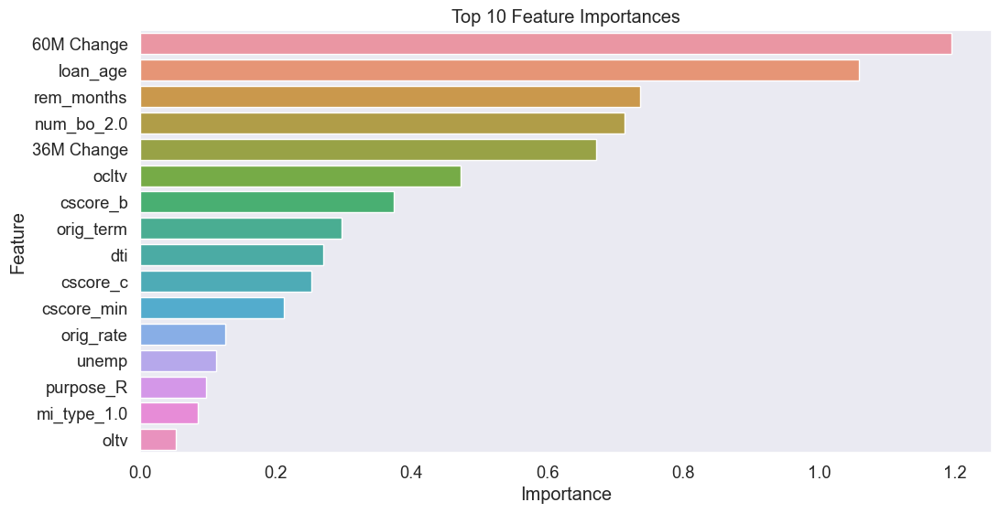

In [172]:
import seaborn as sns

# Get the top 10 most important features
top_10_features = result_log['abs_feature_importances'].nlargest(16)

# Create a bar plot to visualize the top 10 feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index)
plt.title('Top 10 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.grid(axis='x')  # Add grid lines on the x-axis
plt.show()


In [173]:
y_pred= pipeline_log.predict(X_oot_log)

In [174]:
from sklearn.metrics import confusion_matrix, f1_score,roc_auc_score

threshold=0.07
y_pred= pipeline_log.predict(X_oot_log)
print(ypred)
## added Sep 2023
ypred_binary = (ypred[:, 1] >= threshold).astype(int)
np.unique(ypred_binary,return_counts=True)
#cm = confusion_matrix(Y_oot,ypred,labels=[0, 1])
cm = confusion_matrix(Y_oot,ypred_binary)
print(cm)
labels=['Non Default', ' Default']
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
# Add class counts to the heatmap cells
for i in range(2):
    for j in range(2):
        ax.text(j + 0.0, i + 0.0, str(cm[i, j]), ha='center', va='center', color='red',fontsize=14)


plt.show()
f1 = f1_score(Y_oot, ypred_binary)
print("f1: %.2f%%" % (f1 * 100.0)) 

ypred_p = best_model.predict_proba(df_oot.values)
roc_auc_score(Y_oot, ypred_p[:, 1])

           predA      pred
0       0.075188  0.924812
1       0.055578  0.944422
2       0.149928  0.850072
3       0.166443  0.833557
4       0.230791  0.769209
...          ...       ...
182630  0.987783  0.012217
182631  0.930616  0.069384
182632  0.960626  0.039374
182633  0.964997  0.035003
182634  0.975501  0.024499

[182635 rows x 2 columns]


InvalidIndexError: (slice(None, None, None), 1)

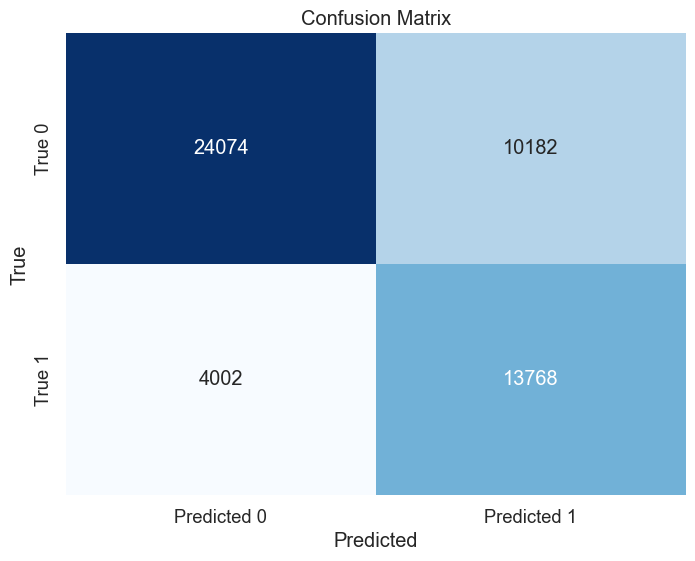

In [175]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Sample true labels and predicted labels (replace these with your own data)


# Calculate the confusion matrix
confusion_mat = cm

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.set(font_scale=1.2)  # Adjust font size for better visualization
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted 0', 'Predicted 1'],
            yticklabels=['True 0', 'True 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


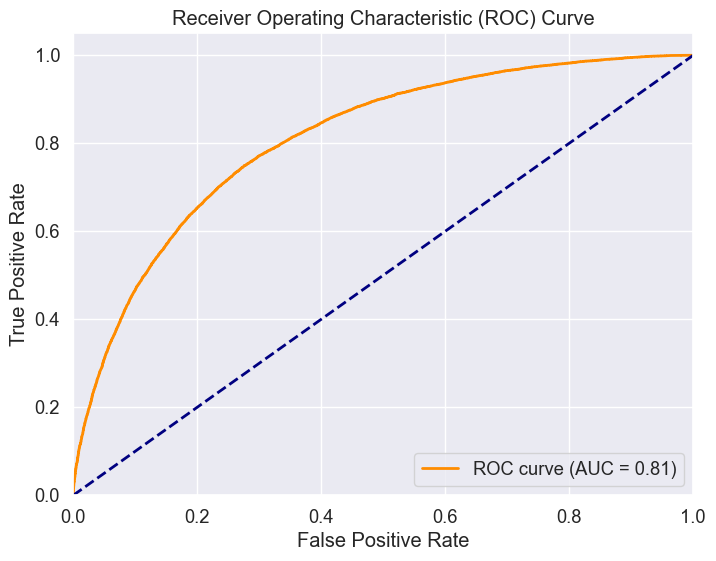

In [176]:
#roc_auc_score(Y_oot, ypred_p[:, 1])
ypred_p = pipeline_log.predict_proba(X_oot_log)

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(Y_oot_log, ypred_p[:, 1])
roc_auc = roc_auc_score(Y_oot_log, ypred_p[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [177]:
## Lets calculate intercept adjustment
Original_Data_Actives=2293375803
Original_Data_Defaults=17966109
#Original_Data_Event_Rate:
p1=Original_Data_Defaults/(Original_Data_Defaults+Original_Data_Actives)
print(p1)
Sampled_Data_Actives=114327
Sampled_Data_Defaults=78962
#Sampled_Data_Event_Rate:
r1=Sampled_Data_Defaults/(Sampled_Data_Defaults+Sampled_Data_Actives)
print(r1)
#log[(r1*(1-p1)) / ((1-r1)*p1)],
Intercept_Adjustment=np.log((r1*(1-p1)) / ((1-r1)*p1))

Intercept_Adjustment

0.007773020904749639
0.40851781529212733


4.479196971741276

In [178]:
offset = [ Intercept_Adjustment for i in range(len(X_ins_log.index))]


In [179]:
X_ins_log= sm.add_constant(X_ins_log)
final_features_log=list(X_ins_log.columns)
# Instantiate a binomial family model with the default link function.
#log_model = sm.GLM(Y_ins_log, X_ins_log, family=sm.families.Binomial(),offset=offset)
log_model = sm.GLM(Y_ins_log, X_ins_log, family=sm.families.Binomial())

In [180]:
log_results = log_model.fit()

print(log_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Default   No. Observations:               182635
Model:                            GLM   Df Residuals:                   182593
Model Family:                Binomial   Df Model:                           41
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -78371.
Date:                Tue, 17 Oct 2023   Deviance:                   1.5674e+05
Time:                        14:26:45   Pearson chi2:                 2.29e+05
No. Iterations:                    19   Pseudo R-squ. (CS):             0.4072
Covariance Type:            nonrobust                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [181]:
coeff=log_results.params

In [182]:
coeff

const                               0.664294
orig_rate                           0.077480
orig_upb                            0.541770
orig_val                           -0.523161
orig_term                          -0.248273
loan_age                            1.078413
rem_months                          0.708824
oltv                               -0.279200
ocltv                               0.636962
dti                                 0.245494
cscore_b                           -0.318415
cscore_c                           -0.191966
cscore_min                         -0.318585
mi_pct                              0.008251
12M Change                         -0.441701
36M Change                          0.181414
60M Change                          0.627572
unemp                              -0.118767
channel_C                          -0.114618
channel_R                          -0.265609
purpose_P                          -0.646737
purpose_R                          -0.404752
purpose_U 

In [183]:
coeff_new=coeff.drop('const').to_frame(name='coef')

In [184]:
coeff_new['feat']=coeff_new.index

In [185]:
coeff_new.reset_index(inplace=True)

In [186]:
coeff_new.drop('index',inplace=True,axis=1)

In [187]:
coeff_new_all=pd.concat([coeff_new,pd.Series(scaled_mean),pd.DataFrame(scaled_std)],axis=1).set_axis(labels=['A','B','C','D'],axis=1)

In [188]:
coeff_new_all

,A,B,C,D
0,0.077480,orig_rate,5.434146,1.264571
1,0.541770,orig_upb,190229.910381,111124.505243
2,-0.523161,orig_val,274023.566814,179148.608087
3,-0.248273,orig_term,321.712364,73.281518
4,1.078413,loan_age,55.725037,41.472524
5,0.708824,rem_months,273.427348,89.110277
6,-0.279200,oltv,73.275107,16.358189
7,0.636962,ocltv,74.106562,16.449273
8,0.245494,dti,36.053699,11.589301
9,-0.318415,cscore_b,720.625596,61.166123


In [189]:
coeff_new_all['Beta_adj']=np.exp(coeff_new_all['A']/coeff_new_all['D'])

In [190]:
coeff_new_all

,A,B,C,D,Beta_adj
0,0.077480,orig_rate,5.434146,1.264571,1.063186
1,0.541770,orig_upb,190229.910381,111124.505243,1.000005
2,-0.523161,orig_val,274023.566814,179148.608087,0.999997
3,-0.248273,orig_term,321.712364,73.281518,0.996618
4,1.078413,loan_age,55.725037,41.472524,1.026344
5,0.708824,rem_months,273.427348,89.110277,1.007986
6,-0.279200,oltv,73.275107,16.358189,0.983077
7,0.636962,ocltv,74.106562,16.449273,1.039482
8,0.245494,dti,36.053699,11.589301,1.021409
9,-0.318415,cscore_b,720.625596,61.166123,0.994808


In [191]:
df_model.loc[oot_index_names]

,channel,orig_rate,orig_upb,orig_term,loan_age,rem_months,oltv,ocltv,num_bo,dti,...,relocation_mortgage_indicator,high_balance_loan_indicator,cscore_min,orig_val,Vintage,Default,12M Change,36M Change,60M Change,unemp
0,C,3.875,387000.0,360.0,15.0,345.0,90.0,90.0,1.0,37.0,...,N,N,791.0,430000.000000,2019,1,0.042358,0.220901,0.556672,2.6
13,C,4.500,92000.0,360.0,31.0,329.0,60.0,60.0,1.0,31.0,...,N,N,683.0,153333.333333,2016,1,0.072343,0.221307,0.228621,4.8
21,C,4.875,80000.0,360.0,27.0,333.0,97.0,97.0,1.0,29.0,...,N,N,727.0,82474.226804,2017,1,0.043385,0.119036,0.147404,2.7
47,R,4.000,82000.0,360.0,33.0,327.0,87.0,87.0,2.0,33.0,...,N,N,720.0,94252.873563,2016,1,0.008078,0.027774,0.025166,6.4
49,C,4.625,200000.0,360.0,17.0,343.0,80.0,80.0,1.0,46.0,...,N,N,677.0,250000.000000,2019,1,0.035888,0.082315,0.237040,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357663,R,4.500,177000.0,360.0,32.0,328.0,80.0,80.0,1.0,28.0,...,N,N,713.0,221250.000000,2017,0,0.112417,0.295025,0.617942,3.6
357671,C,3.875,45000.0,120.0,86.0,34.0,75.0,75.0,1.0,17.0,...,N,N,796.0,60000.000000,2014,0,0.014515,-0.008814,-0.054931,5.8
357679,R,4.125,424000.0,360.0,1.0,359.0,80.0,80.0,1.0,17.0,...,N,N,715.0,530000.000000,2017,0,0.028576,0.093249,0.180325,4.9
357681,B,5.250,383000.0,360.0,19.0,341.0,75.0,75.0,2.0,43.0,...,N,N,781.0,510666.666667,2019,0,0.041635,0.144680,0.238982,4.2


In [192]:

ypred_log = pd.DataFrame(log_results.predict(X_ins_log.values),columns=['pred'])

df1=pd.DataFrame(X_ins_log.values,columns=final_features_log)

df2=pd.DataFrame(Y_ins_log.values,columns =['target'])

df3 =df_model.drop(oot_index_names)
df_ins_4plot=pd.concat([df1,df2,df3[['Vintage']],ypred_log],axis=1)

In [193]:
X_oot_log= sm.add_constant(X_oot_log)
ypred_log_oot = pd.DataFrame(log_results.predict(X_oot_log.values),columns=['pred'])
df1_oot=pd.DataFrame(X_oot_log.values,columns=final_features_log)
df2_oot=pd.DataFrame(Y_oot_log.values,columns =['target'])
df3_oot=df_model.loc[oot_index_names]
df_oot_4plot=pd.concat([df1_oot,df2_oot,df3_oot[['Vintage']],ypred_log_oot],axis=1)

In [194]:
x_var='Vintage'
x_var_plot='Vintage'
y_var='target'
y_pred='pred'
bin_size=6

In [195]:
x_var_list=['Vintage',
            'orig_rate',
 'orig_upb',
 'orig_val',
 'orig_term',
 'loan_age',
 'rem_months',
 'oltv',
 'ocltv',
 'dti',
 'cscore_b',
 'cscore_c',
 'cscore_min',
 'mi_pct',
 '12M Change',
 '36M Change',
 '60M Change',
 'unemp']
x_var_name=['Vintage',
            'Origination Rate',
            'Origination Balance',
            'Origination Value',
            'Origination Term',
            'Loan Age',
            'Remaining Months',
            'Origination LTV',
           'Origination CLTV',
            'Debt to Income',
            'Borrower FICO',
            'CoBorrower FICO',
            'Minimum FICO',
            'Mortgage Insurance Percent',
            '12M HPA',
            '36M HPA',
            '60M HPA',
            'Unemployment']


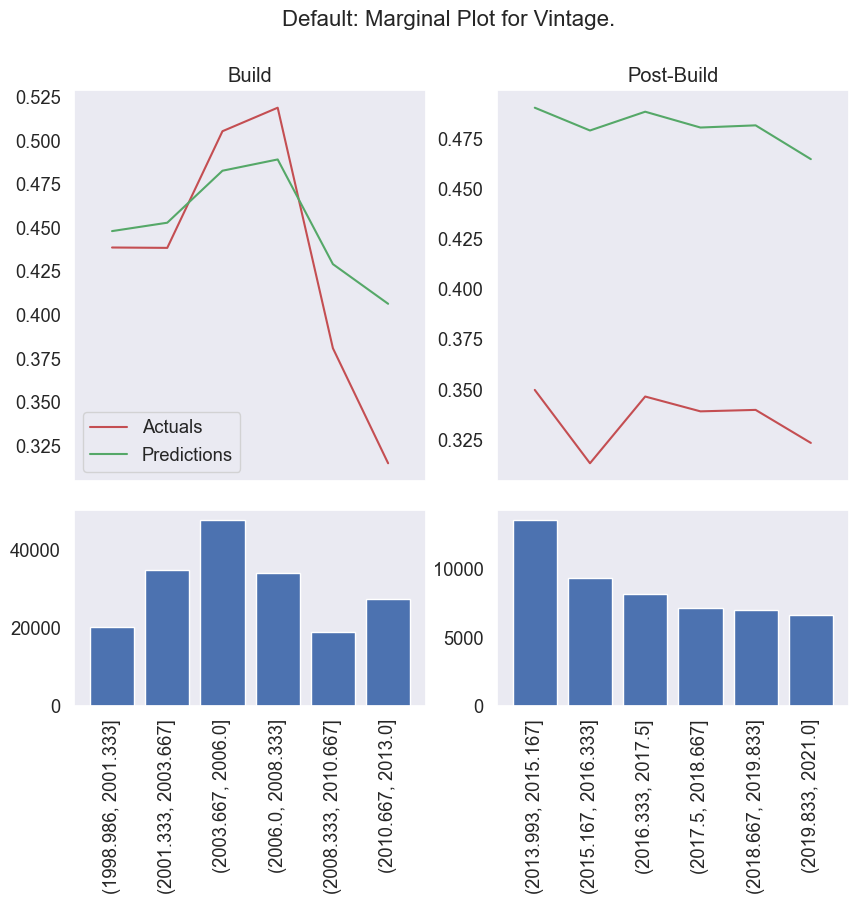

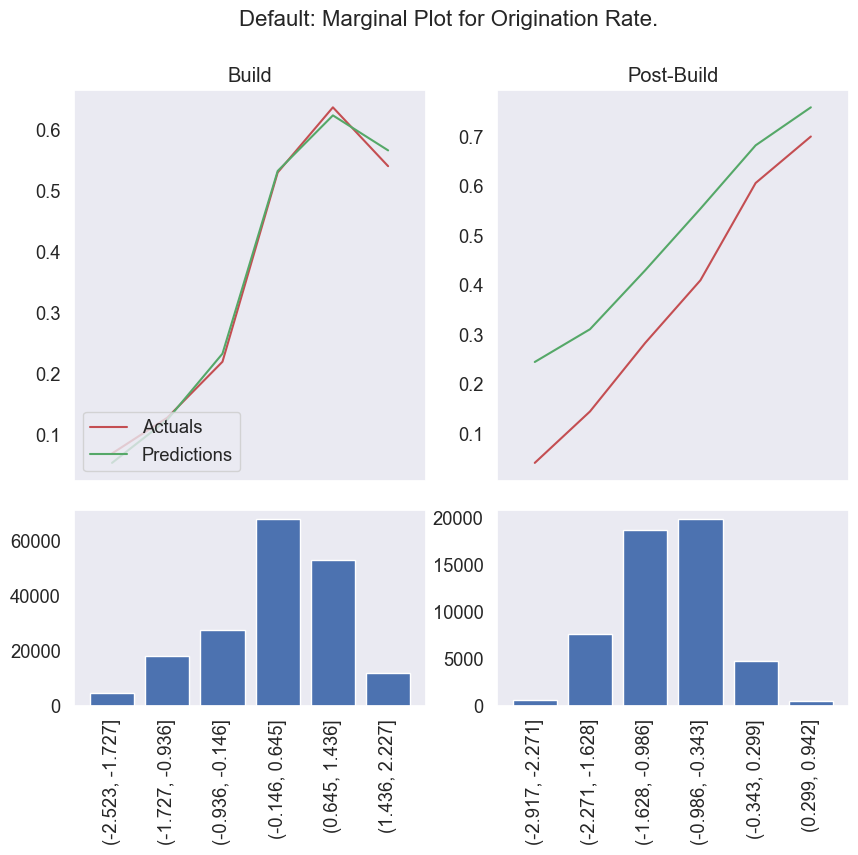

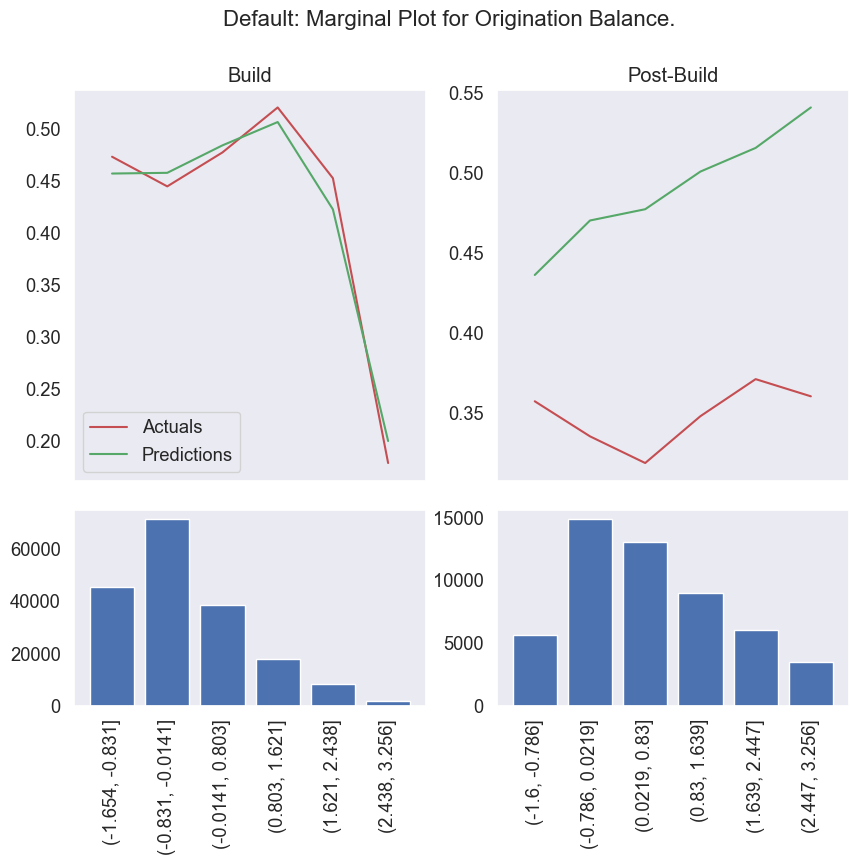

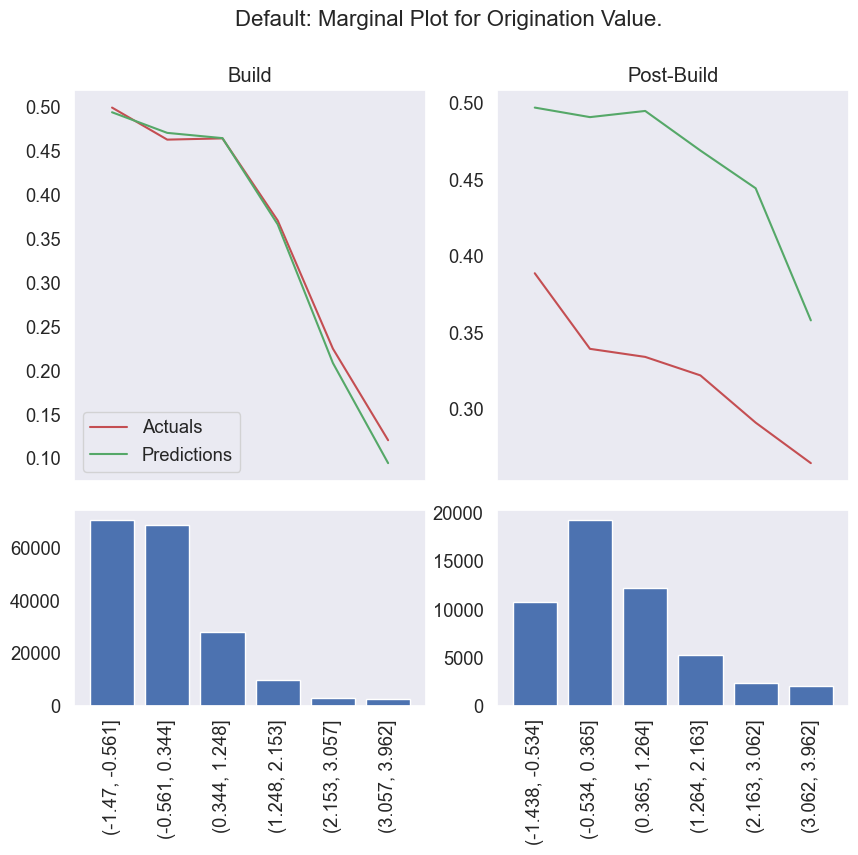

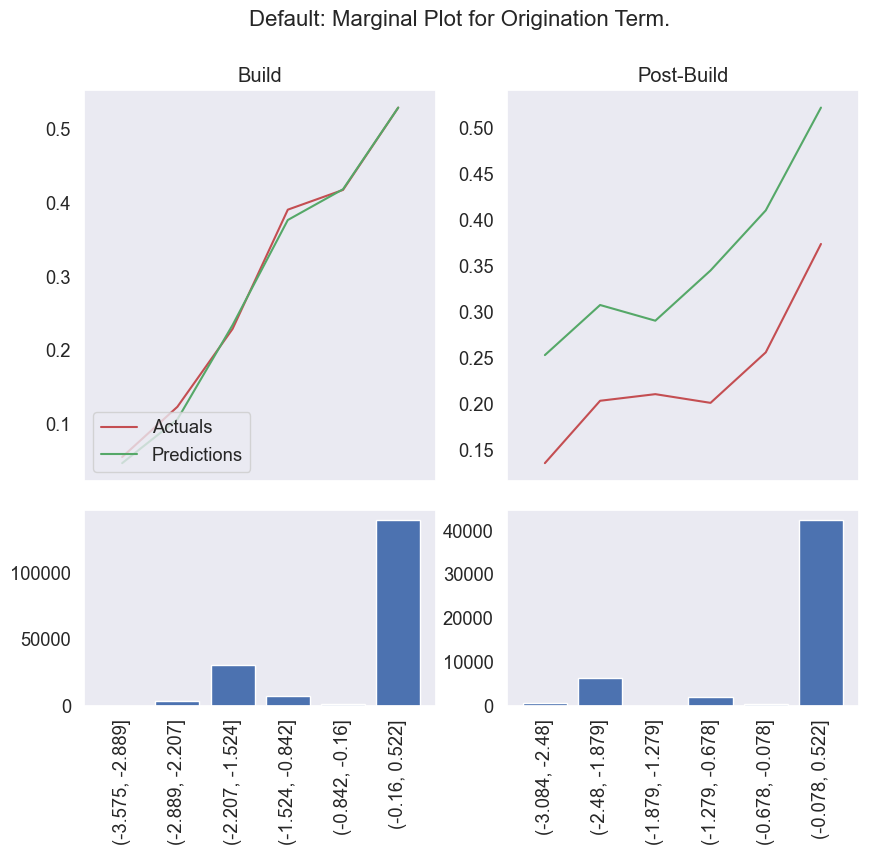

...

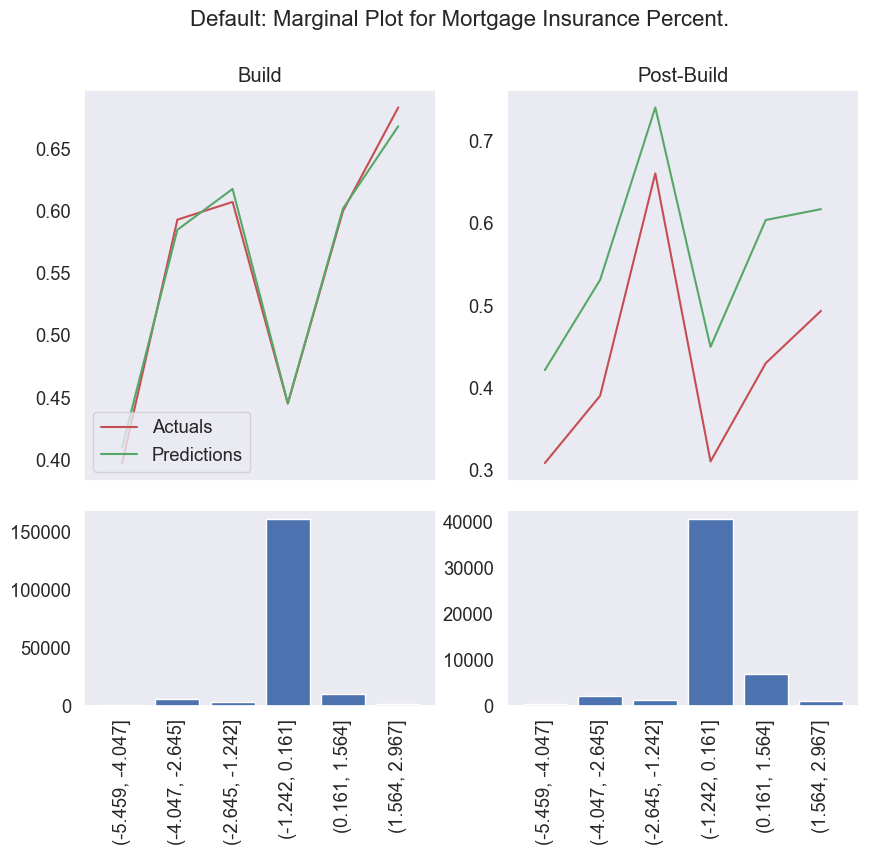

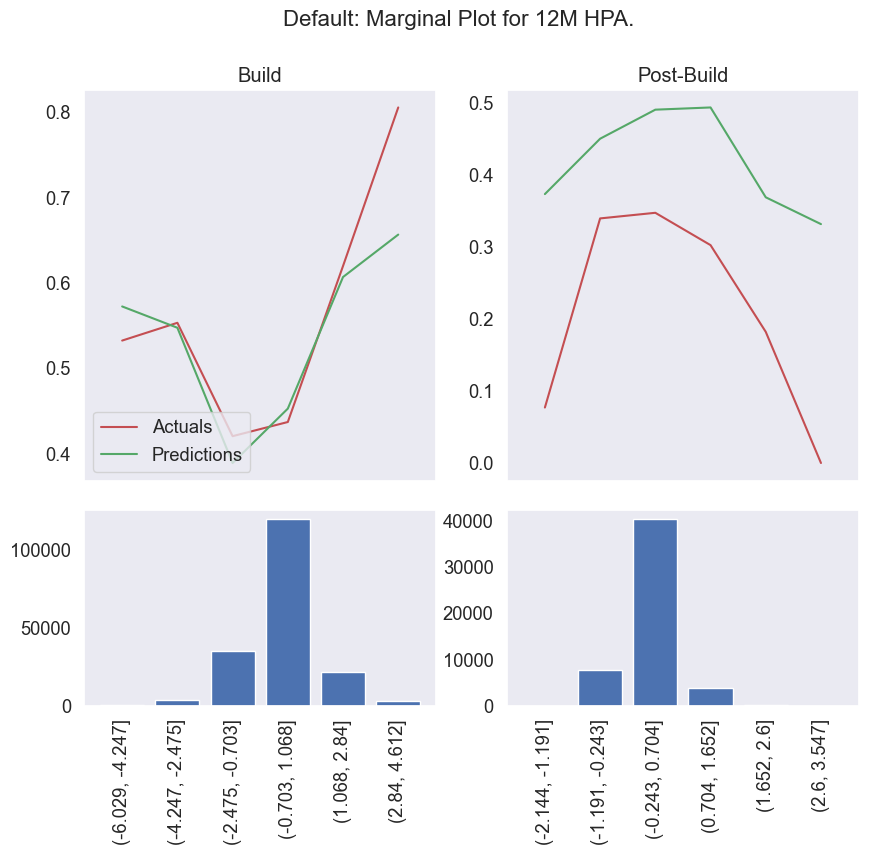

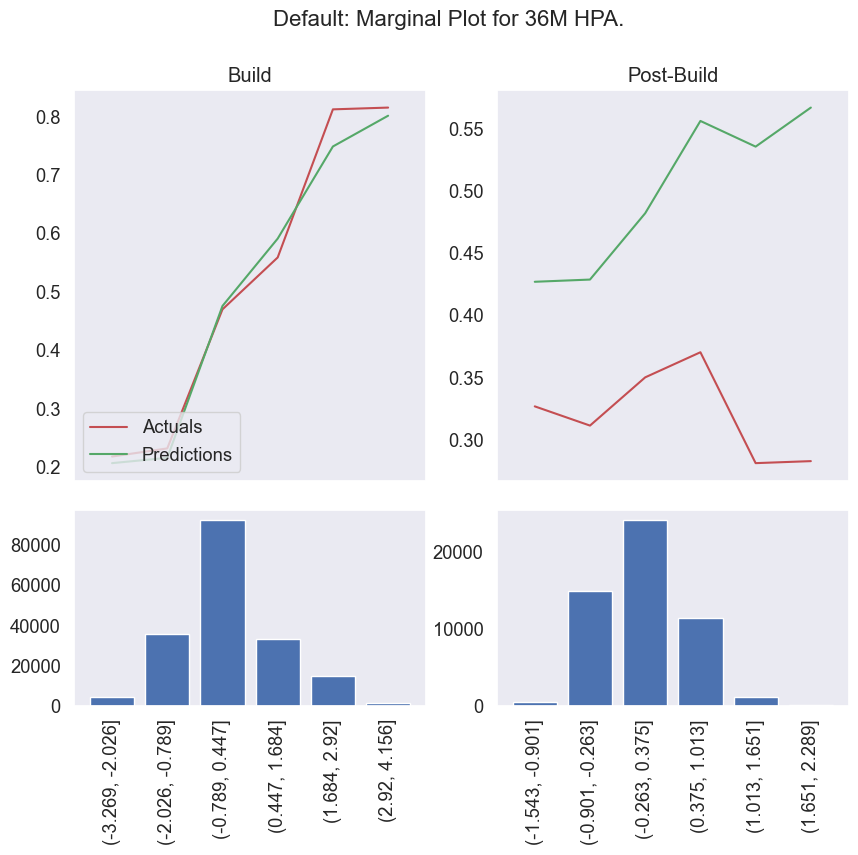

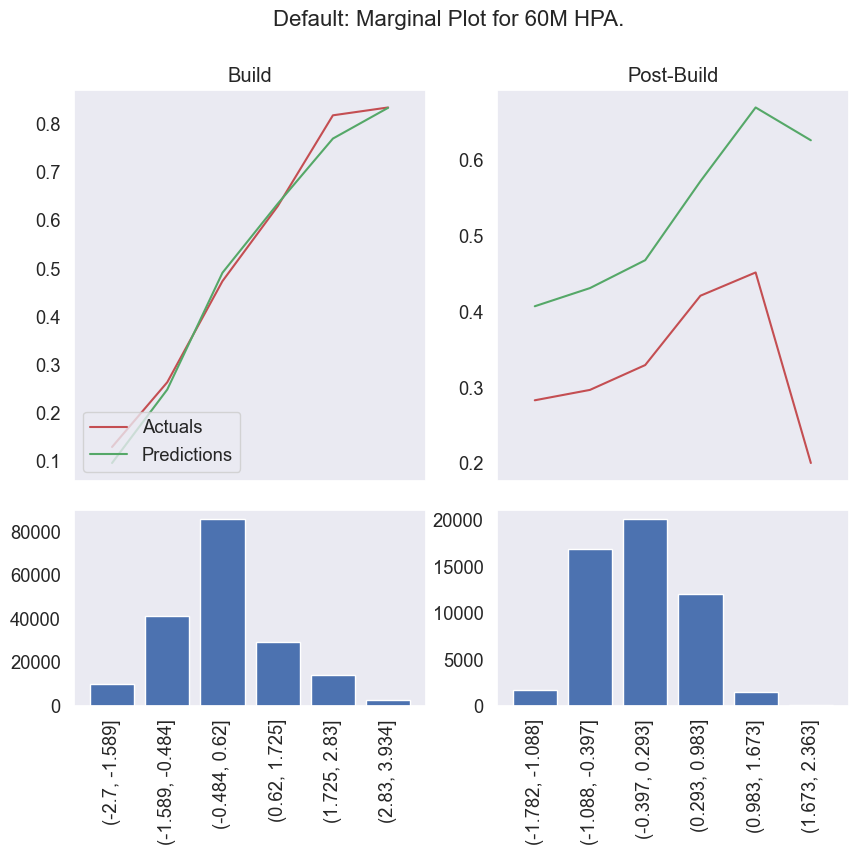

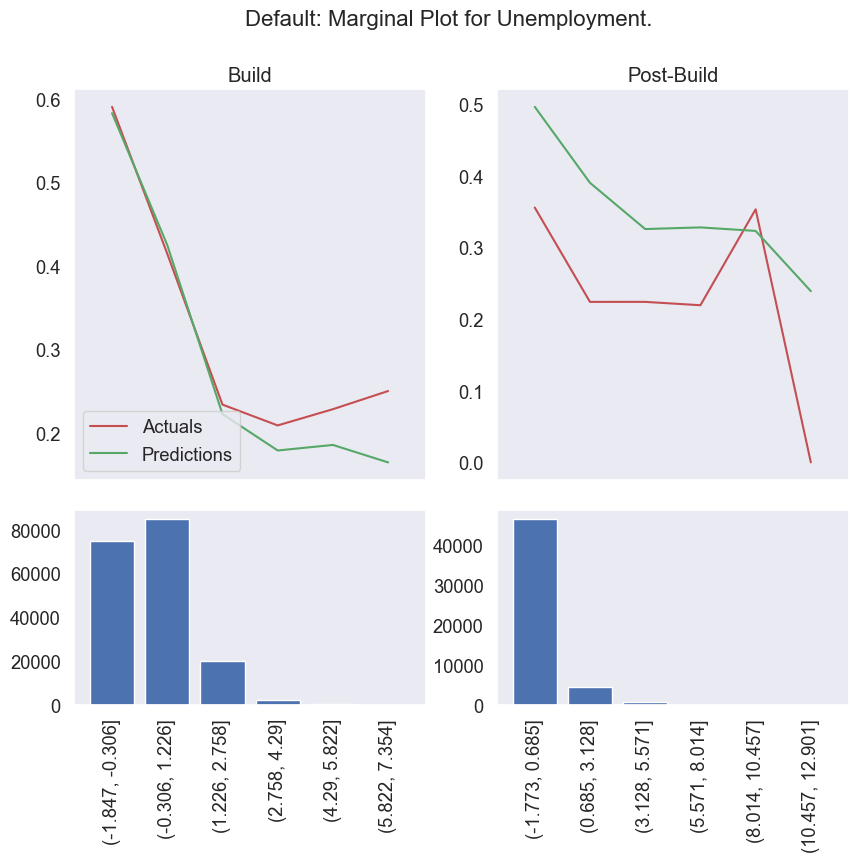

In [196]:

for i,j in zip(x_var_list, x_var_name):

    marginal_plots(df_ins_4plot,df_oot_4plot,i,j,y_var,y_pred,bin_size)

In [197]:
### there are different types of scalers but for interpretability purposes I will center the numerical variables at their mean


from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

x = df_model_log[num_vars].values #returns a numpy array
"""
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_model_log = pd.DataFrame(x_scaled, index = df_model_log.index, columns = df_model_log.columns)
"""
"""power_trans=preprocessing.power_transform(x, standardize=True, copy=True)
#x_power_trans=power_trans.fit_transform(x)
df_model_log_num=pd.DataFrame(power_trans, index = df_model_log.index, columns = num_vars)"""

scaler = StandardScaler()

# Fit and transform the data
centered_data = scaler.fit_transform(x)

# The centered data will have a mean close to zero
#print(np.mean(centered_data))
# Output: [0.]
#df_model_log_num=pd.DataFrame(centered_data, index = df_model_log.index, columns = num_vars)

In [198]:


# Specify the independent (numericals to spline and dummies as is) and dependent variables
#x1 = data["Independent_Variable_1"]
#x2 = data["Independent_Variable_2"]
#y = data["Dependent_Variable"]

# Define a design matrix for B-splines only for x1
#x_trans = sm.tools.tools.add_constant(x, prepend=False)
#x_spline = sm.tools.splines.BSplines(x, df=3, degree=3)
#x1_trans = x_spline.build_design_matrix(x_trans)

from sklearn import preprocessing
from sklearn.preprocessing import SplineTransformer
spline = SplineTransformer(degree=1, n_knots=2)
#x1_trans=spline.fit_transform(x)
x1_trans=spline.fit_transform(centered_data)
spline_cols=spline.get_feature_names_out(input_features=num_vars)



#df_model_log_num_spline=pd.DataFrame(x1_trans, index = df_model_log.index, columns = num_vars)
df_model_log_num_spline=pd.DataFrame(x1_trans, index = df_model_log.index,columns=spline_cols)

In [199]:
### since I have only centered numeric features I need to reconstitute the model dataset

l_cat=list(df_model_log.columns)
#l_cat.remove(num_vars)
l_cat = [i for i in l_cat if i not in num_vars]
l_cat.remove('Default')

In [200]:
df_model_log_spline = pd.concat([df_model_log_num_spline, df_model_log[l_cat],df_model_log['Default']], axis=1)


In [201]:
### the variables below created issues with logistic regression. Therefore I dropped them
### TO DO: create a variable for num_bo so I can combine any number of borrowers greater than 1 into one category

l=list(df_model_log_spline.columns)
l.remove('Default')
#l.remove('cscore_c')
#l.remove('cscore_min')
#l.remove('ocltv')
l.remove('mi_type_3.0')
l.remove('num_bo_5.0')
#l.remove('num_bo_6.0')
#l.remove('num_bo_7.0')
#l.remove('high_balance_loan_indicator')
#l.remove('Vintage')

In [202]:
df_oot_log_spline=df_model_log_spline.loc[oot_index_names]
X_oot_log_spline=df_oot_log_spline[l]
Y_oot_log_spline=df_oot_log_spline["Default"]

In [203]:
df_ins_log_spline=df_model_log_spline.drop(oot_index_names)
X_ins_log_spline=df_ins_log_spline[l]
Y_ins_log_spline=df_ins_log_spline["Default"]

In [204]:
X_ins_log_spline= sm.add_constant(X_ins_log_spline)
final_features_log_spline=list(X_ins_log_spline.columns)
# Instantiate a binomial family model with the default link function.
#log_model = sm.GLM(Y_ins_log, X_ins_log, family=sm.families.Binomial(),offset=offset)
log_model_spline = sm.GLM(Y_ins_log_spline, X_ins_log_spline, family=sm.families.Binomial())

In [205]:
log_results_spline = log_model_spline.fit()

print(log_results_spline.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                Default   No. Observations:               182635
Model:                            GLM   Df Residuals:                   182594
Model Family:                Binomial   Df Model:                           40
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -78373.
Date:                Tue, 17 Oct 2023   Deviance:                   1.5675e+05
Time:                        14:28:06   Pearson chi2:                 2.29e+05
No. Iterations:                   100   Pseudo R-squ. (CS):             0.4071
Covariance Type:            nonrobust                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [206]:
#ypred = pd.DataFrame(xgbc.predict_proba(df_ins.values),columns=['predA','pred'])
ypred_log_spline = pd.DataFrame(log_results_spline.predict(X_ins_log_spline.values),columns=['pred'])
#df1 = pd.DataFrame(df_ins.values, columns =final_features)
df1=pd.DataFrame(X_ins_log_spline.values,columns=final_features_log_spline)
#df2 = pd.DataFrame(Y_ins.values, columns =['target'])
df2=pd.DataFrame(Y_ins_log.values,columns =['target'])
#df3 = df.drop(oot_index_names) ## df_oot=df_model.loc[oot_index_names]s ##
df3 =df_model.drop(oot_index_names)
df_ins_4plot=pd.concat([df1,df2,df3[['Vintage']+num_vars],ypred_log],axis=1)

In [207]:
X_oot_log_spline= sm.add_constant(X_oot_log_spline)
#ypred_oot = pd.DataFrame(xgbc.predict_proba(df_oot.values),columns=['predA','pred'])
ypred_log_oot_spline = pd.DataFrame(log_results_spline.predict(X_oot_log_spline.values),columns=['pred'])
#df1_oot = pd.DataFrame(df_oot.values, columns =final_features)
df1_oot=pd.DataFrame(X_oot_log_spline.values,columns=final_features_log_spline)
#df2_oot = pd.DataFrame(Y_oot.values, columns =['target'])
df2_oot=pd.DataFrame(Y_oot_log_spline.values,columns =['target'])
#df3_oot=df.loc[oot_index_names] ## df_oot=df_model.loc[oot_index_names]
df3_oot=df_model.loc[oot_index_names]
df_oot_4plot=pd.concat([df1_oot,df2_oot,df3_oot[['Vintage']+num_vars],ypred_log_oot],axis=1)

In [208]:
x_var_list=['Vintage',
            'orig_rate',
 'orig_upb',
 'orig_val',
 'orig_term',
 'loan_age',
 'rem_months',
 'oltv',
 'ocltv',
 'dti',
 'cscore_b',
 'cscore_c',
 'cscore_min',
 'mi_pct',
 '12M Change',
 '36M Change',
 '60M Change',
 'unemp']
x_var_name=['Vintage',
            'Origination Rate',
            'Origination Balance',
            'Origination Value',
            'Origination Term',
            'Loan Age',
            'Remaining Months',
            'Origination LTV',
           'Origination CLTV',
            'Debt to Income',
            'Borrower FICO',
            'CoBorrower FICO',
            'Minimum FICO',
            'Mortgage Insurance Percent',
            '12M HPA',
            '36M HPA',
            '60M HPA',
            'Unemployment']


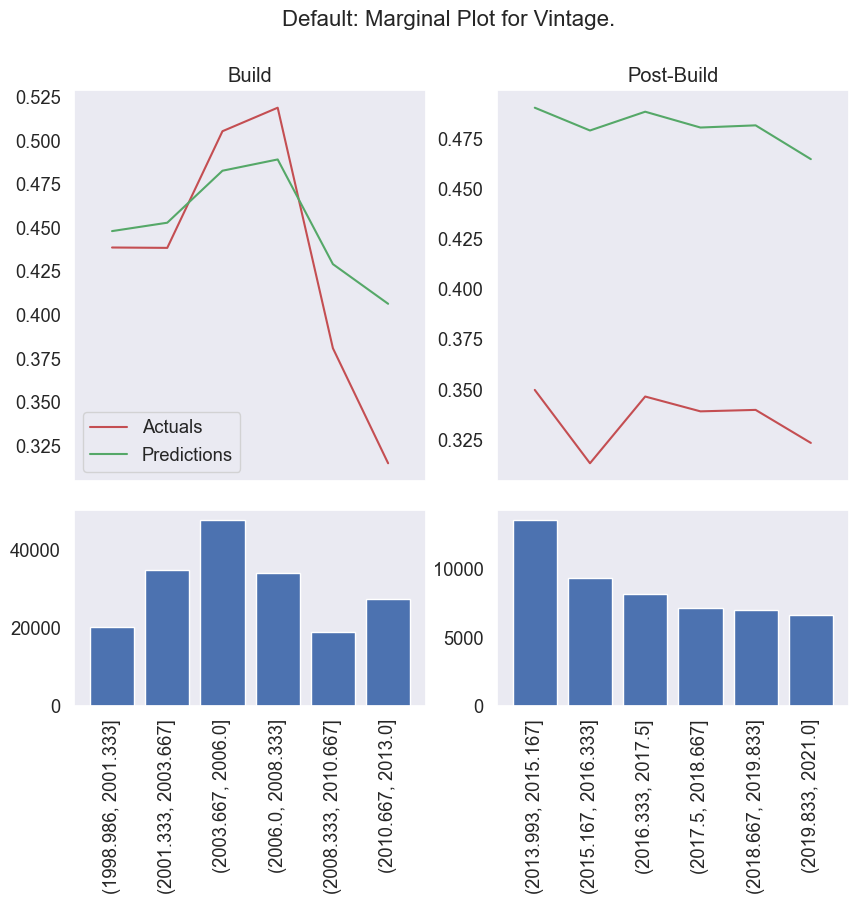

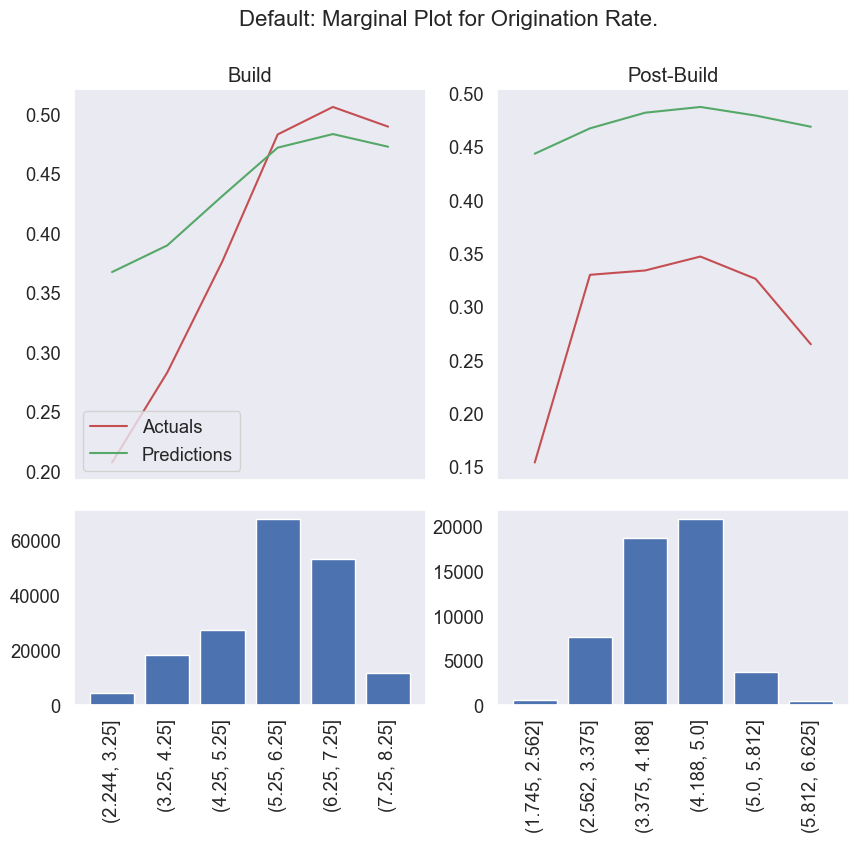

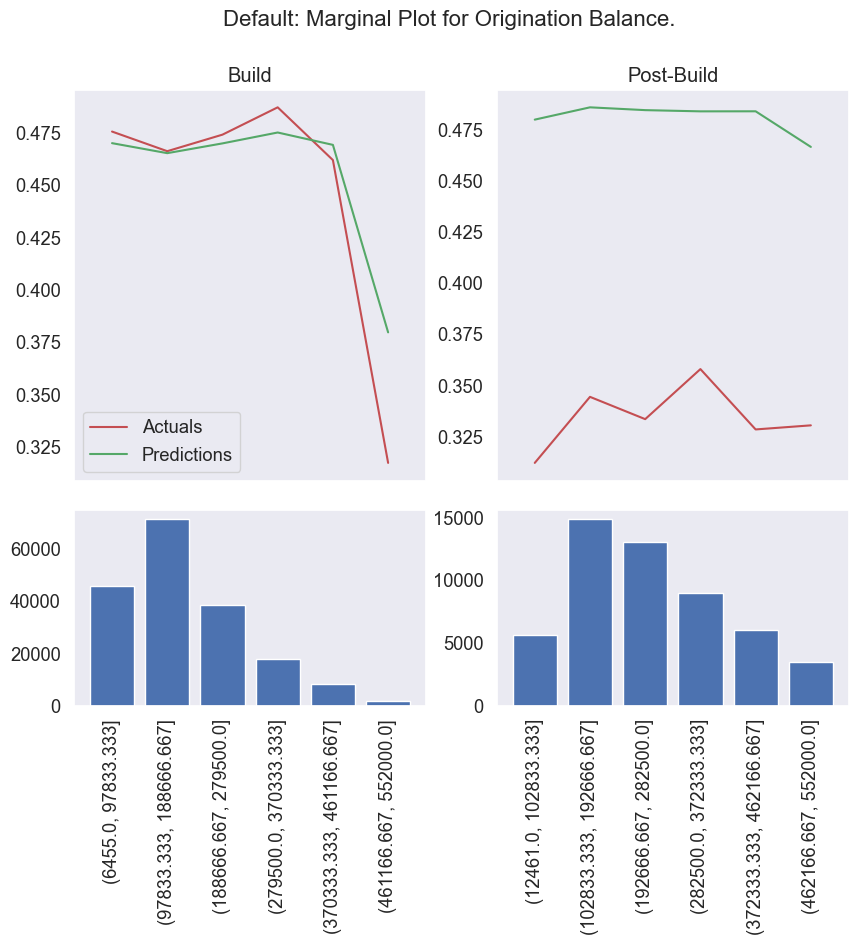

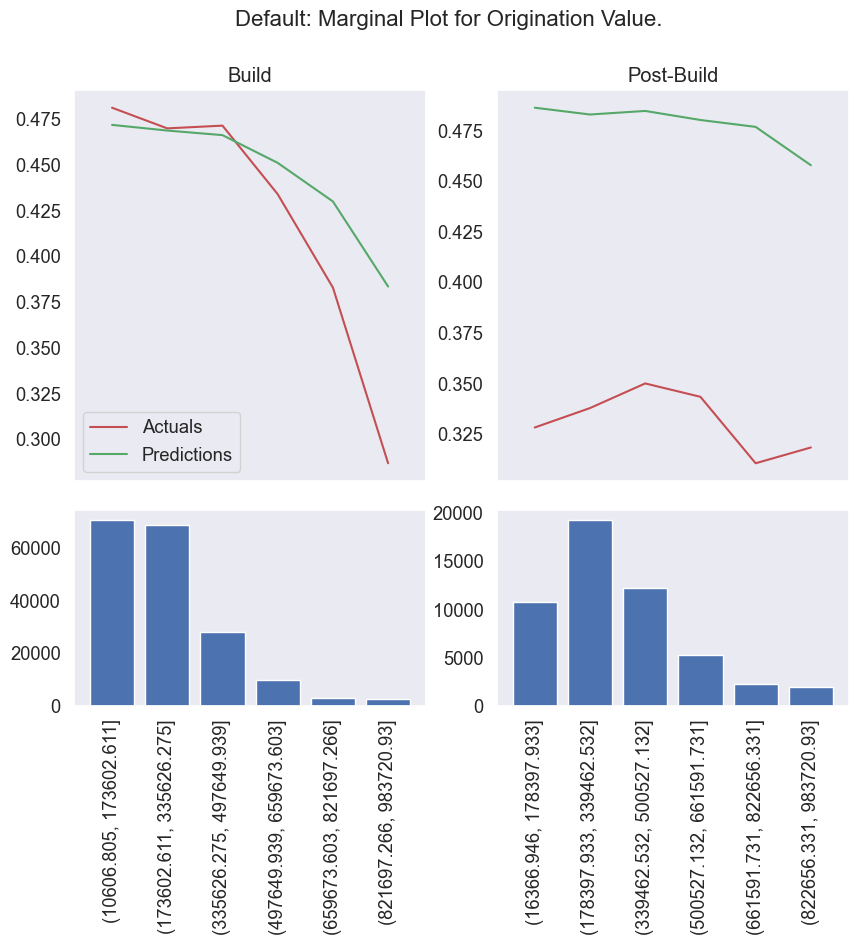

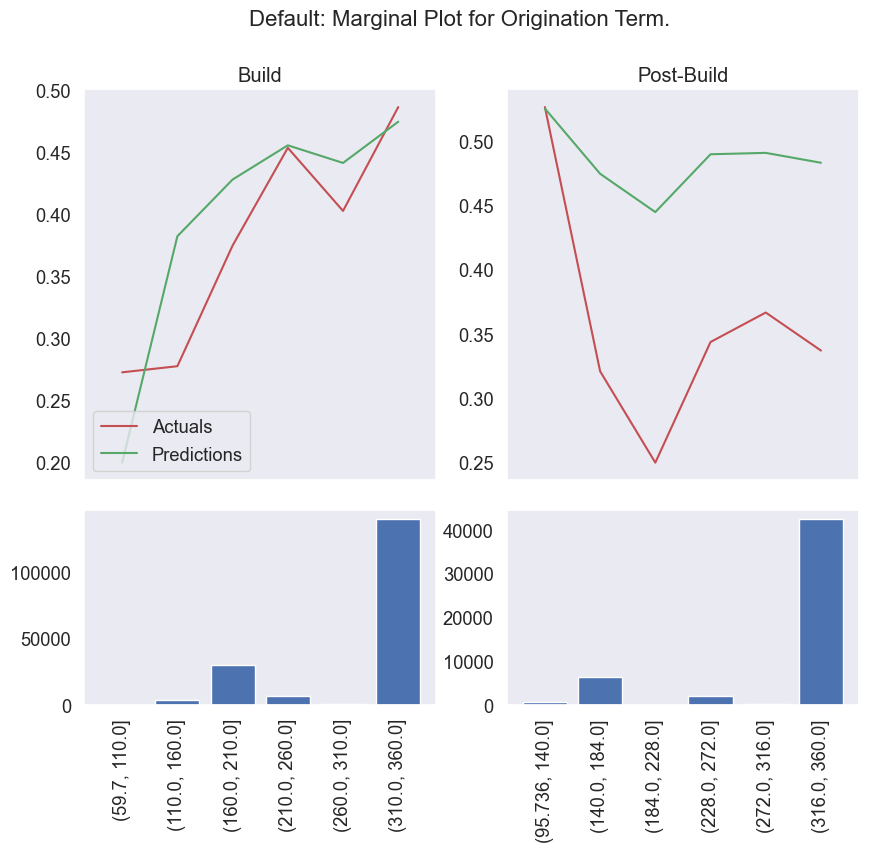

...

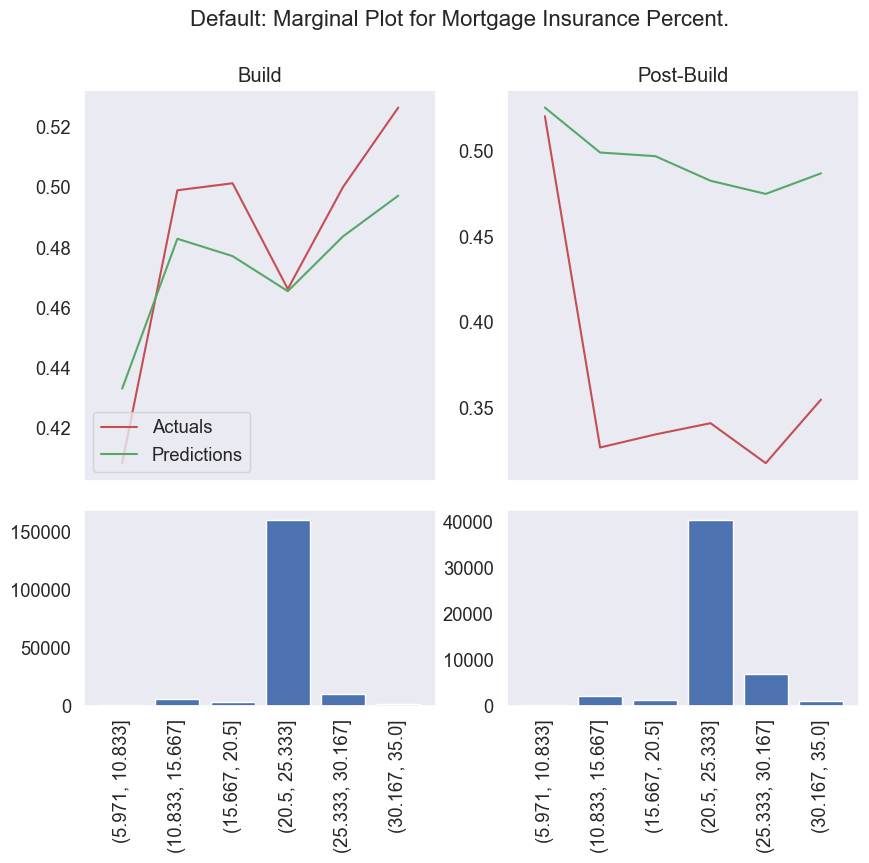

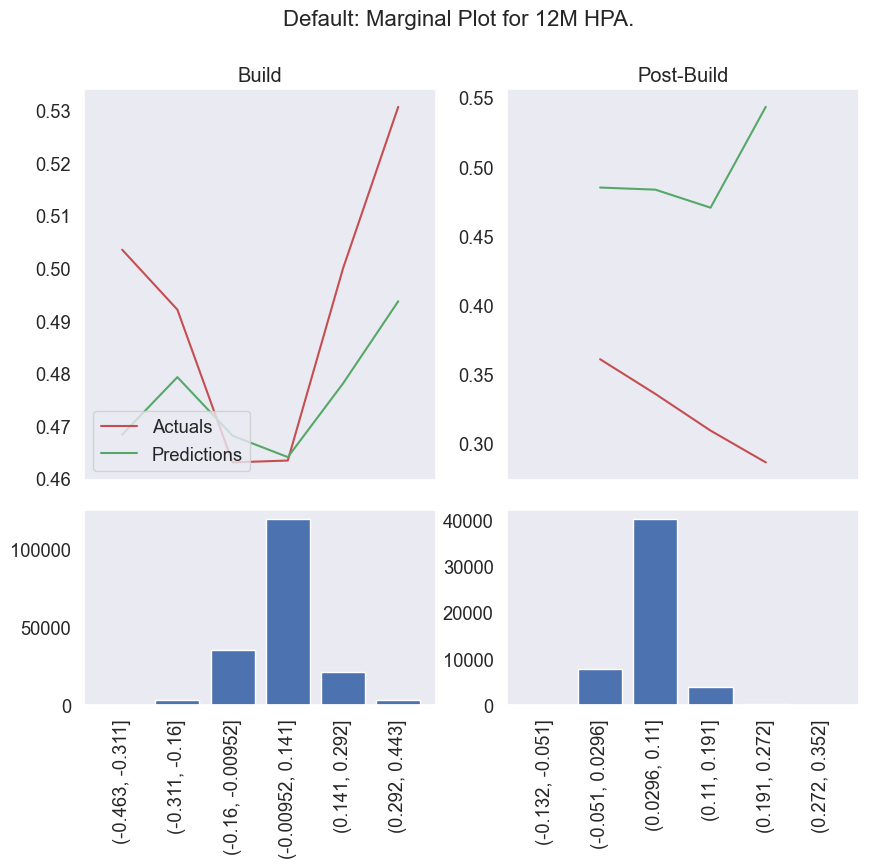

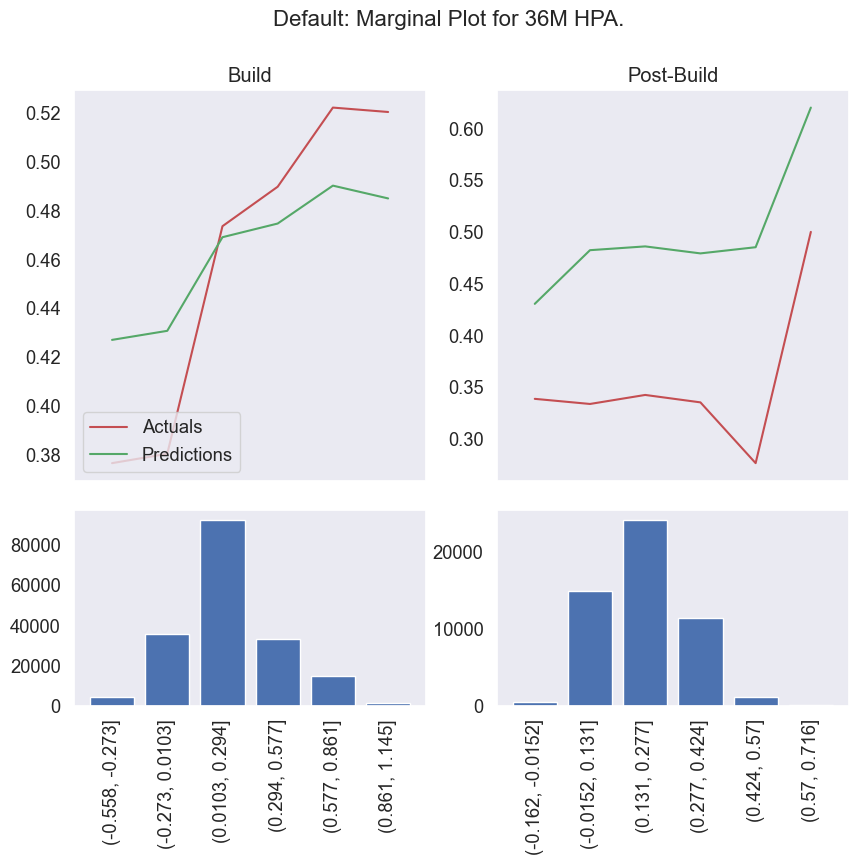

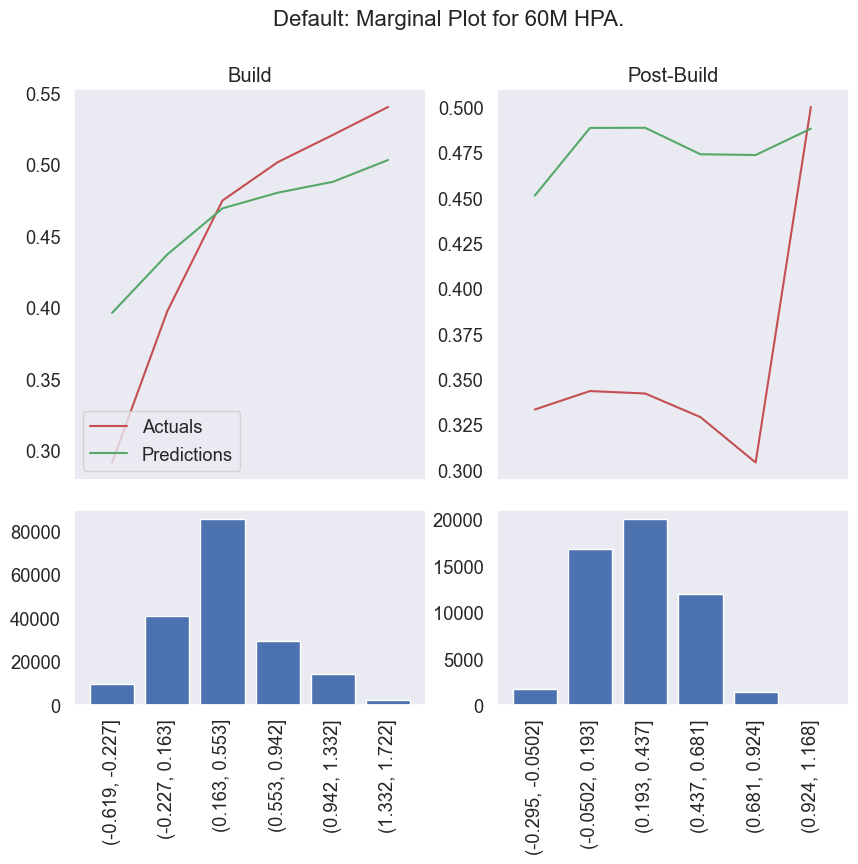

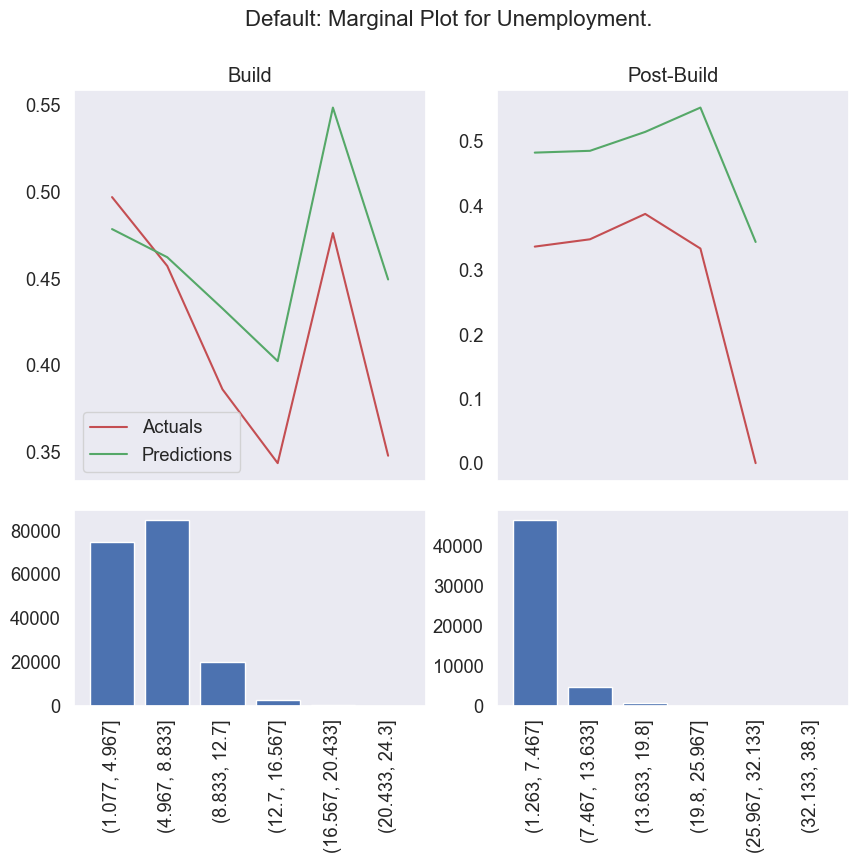

In [209]:
for i,j in zip(x_var_list, x_var_name):

    marginal_plots(df_ins_4plot,df_oot_4plot,i,j,y_var,y_pred,bin_size)

In [210]:
ypred = log_results.predict(X_oot_log)

#cm = confusion_matrix(Y_oot_log,ypred)
#print(cm)

#f1 = f1_score(Y_oot_log, ypred)
#print("f1: %.2f%%" % (f1 * 100.0))

In [211]:
ypred_log = log_results.predict(X_oot_log.values)
roc_auc_score(Y_oot, ypred_log)

0.8088426688048045

# SHAP Explainability

In [288]:
driver = "DEFAULT"

In [238]:
features_v=['orig_rate', 'orig_upb', 'orig_term', 'loan_age', 'rem_months',
       'oltv', 'ocltv', 'dti', 'cscore_b', 'cscore_c', 'mi_pct',
       'cscore_min', 'orig_val', '12M Change', '36M Change', '60M Change',
       'unemp', 'channel_B', 'channel_C', 'channel_R', 'purpose_C',
       'purpose_P', 'purpose_R', 'purpose_U', 'prop_CO', 'prop_CP',
       'prop_MH', 'prop_PU', 'prop_SF', 'no_units_1.0', 'no_units_2.0',
       'no_units_3.0', 'no_units_4.0', 'occ_stat_I', 'occ_stat_P',
       'occ_stat_S', 'mi_type_0.0', 'mi_type_1.0', 'mi_type_2.0',
       'mi_type_3.0', 'num_bo_1.0', 'num_bo_2.0', 'num_bo_3.0',
       'num_bo_4.0', 'num_bo_5.0', 'num_bo_6.0', 'first_flag_N',
       'first_flag_Y', 'relocation_mortgage_indicator_N',
       'relocation_mortgage_indicator_Y', 'high_balance_loan_indicator_N',
       'high_balance_loan_indicator_Y', 'bad_vintage']
featrures_nv=['orig_rate', 'orig_upb', 'orig_term', 'loan_age', 'rem_months',
       'oltv', 'ocltv', 'dti', 'cscore_b', 'cscore_c', 'mi_pct',
       'cscore_min', 'orig_val', '12M Change', '36M Change', '60M Change',
       'unemp', 'channel_B', 'channel_C', 'channel_R', 'purpose_C',
       'purpose_P', 'purpose_R', 'purpose_U', 'prop_CO', 'prop_CP',
       'prop_MH', 'prop_PU', 'prop_SF', 'no_units_1.0', 'no_units_2.0',
       'no_units_3.0', 'no_units_4.0', 'occ_stat_I', 'occ_stat_P',
       'occ_stat_S', 'mi_type_0.0', 'mi_type_1.0', 'mi_type_2.0',
       'mi_type_3.0', 'num_bo_1.0', 'num_bo_2.0', 'num_bo_3.0',
       'num_bo_4.0', 'num_bo_5.0', 'num_bo_6.0', 'first_flag_N',
       'first_flag_Y', 'relocation_mortgage_indicator_N',
       'relocation_mortgage_indicator_Y', 'high_balance_loan_indicator_N',
       'high_balance_loan_indicator_Y', 'bad_vintage']

In [213]:
df_ins

,orig_rate,orig_upb,orig_term,loan_age,rem_months,oltv,ocltv,dti,cscore_b,cscore_c,...,num_bo_4.0,num_bo_5.0,num_bo_6.0,first_flag_N,first_flag_Y,relocation_mortgage_indicator_N,relocation_mortgage_indicator_Y,high_balance_loan_indicator_N,high_balance_loan_indicator_Y,bad_vintage
1,6.125,371.483512,360.0,113.0,456.0,80.0,80.0,46.0,591.0,591.0,...,0,0,0,0,1,1,0,1,0,1
2,6.750,388.587185,360.0,62.0,298.0,90.0,90.0,39.0,726.0,723.0,...,0,0,0,1,0,1,0,1,0,1
4,5.625,320.936131,360.0,71.0,301.0,93.0,93.0,58.0,684.0,684.0,...,0,0,0,1,0,1,0,1,0,0
5,6.500,189.736660,360.0,74.0,286.0,87.0,87.0,22.0,656.0,656.0,...,0,0,0,1,0,1,0,1,0,0
6,5.375,433.589668,360.0,104.0,256.0,80.0,80.0,21.0,661.0,661.0,...,0,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357675,6.500,273.861279,360.0,4.0,356.0,52.0,52.0,30.0,761.0,743.0,...,0,0,0,1,0,1,0,1,0,1
357676,5.375,184.390889,360.0,31.0,329.0,75.0,75.0,35.0,724.0,804.0,...,0,0,0,1,0,1,0,1,0,0
357677,6.250,330.151480,360.0,9.0,351.0,80.0,80.0,61.0,698.0,688.0,...,0,0,0,1,0,1,0,1,0,1
357678,6.375,471.168760,360.0,12.0,348.0,74.0,90.0,37.0,732.0,732.0,...,0,0,0,1,0,1,0,1,0,1


In [214]:
df_oot

,orig_rate,orig_upb,orig_term,loan_age,rem_months,oltv,ocltv,dti,cscore_b,cscore_c,...,num_bo_4.0,num_bo_5.0,num_bo_6.0,first_flag_N,first_flag_Y,relocation_mortgage_indicator_N,relocation_mortgage_indicator_Y,high_balance_loan_indicator_N,high_balance_loan_indicator_Y,bad_vintage
0,3.875,622.093241,360.0,15.0,345.0,90.0,90.0,37.0,791.0,791.0,...,0,0,0,0,1,1,0,1,0,0
13,4.500,303.315018,360.0,31.0,329.0,60.0,60.0,31.0,683.0,683.0,...,0,0,0,1,0,1,0,1,0,0
21,4.875,282.842712,360.0,27.0,333.0,97.0,97.0,29.0,727.0,727.0,...,0,0,0,0,1,1,0,1,0,0
47,4.000,286.356421,360.0,33.0,327.0,87.0,87.0,33.0,740.0,720.0,...,0,0,0,1,0,1,0,1,0,0
49,4.625,447.213595,360.0,17.0,343.0,80.0,80.0,46.0,677.0,677.0,...,0,0,0,0,1,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357663,4.500,420.713679,360.0,32.0,328.0,80.0,80.0,28.0,713.0,713.0,...,0,0,0,1,0,1,0,1,0,0
357671,3.875,212.132034,120.0,86.0,34.0,75.0,75.0,17.0,796.0,796.0,...,0,0,0,1,0,1,0,1,0,0
357679,4.125,651.152824,360.0,1.0,359.0,80.0,80.0,17.0,715.0,715.0,...,0,0,0,0,1,1,0,1,0,0
357681,5.250,618.869938,360.0,19.0,341.0,75.0,75.0,43.0,792.0,781.0,...,0,0,0,1,0,1,0,1,0,0


In [ ]:
{'classifier__gamma': 0.05,
 'classifier__learning_rate': 0.15,
 'classifier__max_depth': 12,
 'classifier__min_child_weight': 20,
 'classifier__n_estimators': 30}

In [227]:
model_nv = XGBClassifier(gamma = 0.05,
                        learning_rate = 0.15,
                        max_depth = 12,
                        min_child_weight = 20,
                        n_estimators = 30
                        )

In [228]:
model_nv.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.05, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=12, max_leaves=None,
              min_child_weight=20, missing=nan, monotone_constraints=None,
              n_estimators=30, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [229]:
pred = model_nv.predict(X_test)

In [230]:
explainer_nv = shap.TreeExplainer(model_nv)
print(f"base value for the target driver (average prediction): {explainer_nv.expected_value}")


base value for the target driver (average prediction): [0.]


In [234]:

X_sampled = X_train.sample(1000, random_state=10)

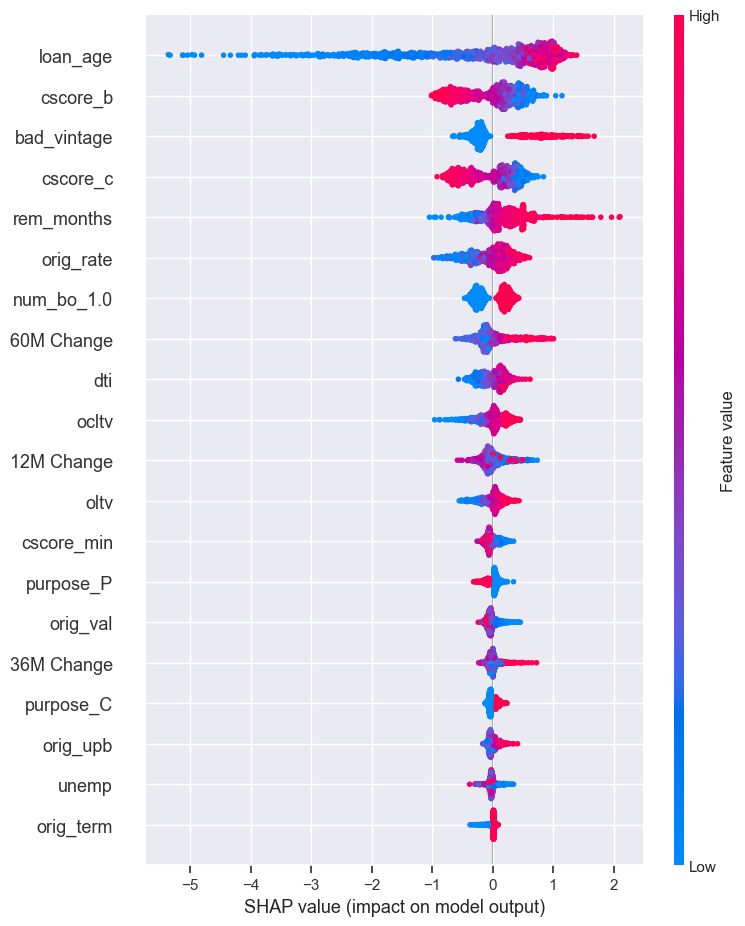

In [236]:
shap_values = explainer_nv.shap_values(X_sampled)
shap.summary_plot(shap_values, X_sampled)

In [239]:
features_nv=featrures_nv

shap_values_ins_nv =  explainer_nv.shap_values(df_ins[features_nv], check_additivity = False  )
shap_values_oot_nv =  explainer_nv.shap_values(df_oot[features_nv], check_additivity = False  )

In [240]:
## merge shap values with the original dataframe ans save the dataframe

for i, col in enumerate(features_nv):
    df_ins[col+'_shap'] = shap_values_ins_nv[:,i]


for i, col in enumerate(features_nv):
    df_oot[col+'_shap'] = shap_values_oot_nv[:,i]


In [242]:
df_ins

,orig_rate,orig_upb,orig_term,loan_age,rem_months,oltv,ocltv,dti,cscore_b,cscore_c,...,num_bo_4.0_shap,num_bo_5.0_shap,num_bo_6.0_shap,first_flag_N_shap,first_flag_Y_shap,relocation_mortgage_indicator_N_shap,relocation_mortgage_indicator_Y_shap,high_balance_loan_indicator_N_shap,high_balance_loan_indicator_Y_shap,bad_vintage_shap
1,6.125,371.483512,360.0,113.0,456.0,80.0,80.0,46.0,591.0,591.0,...,0.0,0.0,0.0,0.000998,0.0,0.000808,0.0,0.0,0.0,0.402396
2,6.750,388.587185,360.0,62.0,298.0,90.0,90.0,39.0,726.0,723.0,...,0.0,0.0,0.0,0.006038,0.0,0.000512,0.0,0.0,0.0,1.046180
4,5.625,320.936131,360.0,71.0,301.0,93.0,93.0,58.0,684.0,684.0,...,0.0,0.0,0.0,0.001771,0.0,0.001005,0.0,0.0,0.0,-0.167196
5,6.500,189.736660,360.0,74.0,286.0,87.0,87.0,22.0,656.0,656.0,...,0.0,0.0,0.0,0.000947,0.0,0.001112,0.0,0.0,0.0,-0.212289
6,5.375,433.589668,360.0,104.0,256.0,80.0,80.0,21.0,661.0,661.0,...,0.0,0.0,0.0,-0.000104,0.0,0.000988,0.0,0.0,0.0,-0.162881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357675,6.500,273.861279,360.0,4.0,356.0,52.0,52.0,30.0,761.0,743.0,...,0.0,0.0,0.0,0.000583,0.0,0.000245,0.0,0.0,0.0,0.524884
357676,5.375,184.390889,360.0,31.0,329.0,75.0,75.0,35.0,724.0,804.0,...,0.0,0.0,0.0,-0.000525,0.0,0.000368,0.0,0.0,0.0,-0.213424
357677,6.250,330.151480,360.0,9.0,351.0,80.0,80.0,61.0,698.0,688.0,...,0.0,0.0,0.0,0.000907,0.0,0.000486,0.0,0.0,0.0,0.561089
357678,6.375,471.168760,360.0,12.0,348.0,74.0,90.0,37.0,732.0,732.0,...,0.0,0.0,0.0,0.000927,0.0,0.000402,0.0,0.0,0.0,0.847172


In [243]:
sv_ins=pd.DataFrame()
for i, col in enumerate(features_nv):
    sv_ins[col] = df_ins[col+'_shap']

sv_oot=pd.DataFrame()
for i, col in enumerate(features_nv):
    sv_oot[col] =df_oot[col+'_shap']

In [245]:
shap_cols = [col for col in df_ins.columns if '_shap' in col]

In [246]:
shap_cols

['orig_rate_shap',
 'orig_upb_shap',
 'orig_term_shap',
 'loan_age_shap',
 'rem_months_shap',
 'oltv_shap',
 'ocltv_shap',
 'dti_shap',
 'cscore_b_shap',
 'cscore_c_shap',
 'mi_pct_shap',
 'cscore_min_shap',
 'orig_val_shap',
 '12M Change_shap',
 '36M Change_shap',
 '60M Change_shap',
 'unemp_shap',
 'channel_B_shap',
 'channel_C_shap',
 'channel_R_shap',
 'purpose_C_shap',
 'purpose_P_shap',
 'purpose_R_shap',
 'purpose_U_shap',
 'prop_CO_shap',
 'prop_CP_shap',
 'prop_MH_shap',
 'prop_PU_shap',
 'prop_SF_shap',
 'no_units_1.0_shap',
 'no_units_2.0_shap',
 'no_units_3.0_shap',
 'no_units_4.0_shap',
 'occ_stat_I_shap',
 'occ_stat_P_shap',
 'occ_stat_S_shap',
 'mi_type_0.0_shap',
 'mi_type_1.0_shap',
 'mi_type_2.0_shap',
 'mi_type_3.0_shap',
 'num_bo_1.0_shap',
 'num_bo_2.0_shap',
 'num_bo_3.0_shap',
 'num_bo_4.0_shap',
 'num_bo_5.0_shap',
 'num_bo_6.0_shap',
 'first_flag_N_shap',
 'first_flag_Y_shap',
 'relocation_mortgage_indicator_N_shap',
 'relocation_mortgage_indicator_Y_shap',
 'h

In [247]:
shap.initjs()
shap.force_plot(explainer_nv.expected_value, df_ins[shap_cols].values[1000,:],feature_names=features_v)


In [248]:
shap.initjs()
shap.force_plot(explainer_nv.expected_value, df_ins[shap_cols].values[0:10,:],feature_names=features_v)

**3. Feature Importance**

In [249]:
def get_imp_features(df, features, shap_values, n=10):
    vals = np.abs(shap_values).mean (0)
    feature_importance = pd.DataFrame(
    list(zip(df[features].columns, vals)),
    columns=["col_name", "feature_importance_vals"],
  )
    feature_importance.sort_values(
  by=[ "feature_importance_vals"], ascending=False, inplace=True
  )
    return list (feature_importance.head(n) ["col_name"])

In [250]:
ins_imp_features = get_imp_features(df_ins[features_nv],
                                                features_nv,
                                                 sv_ins,
                                                  n=10)
oot_imp_features = get_imp_features(df_oot[features_nv],
                                               features_nv,
                                               sv_oot,
                                               n=10)


In [251]:
ins_imp_features

['loan_age',
 'cscore_b',
 'bad_vintage',
 'cscore_c',
 'rem_months',
 'orig_rate',
 'num_bo_1.0',
 '60M Change',
 'dti',
 'ocltv']

In [252]:
oot_imp_features

['loan_age',
 'cscore_b',
 'rem_months',
 'cscore_c',
 'orig_rate',
 'bad_vintage',
 'num_bo_1.0',
 'ocltv',
 'dti',
 '12M Change']

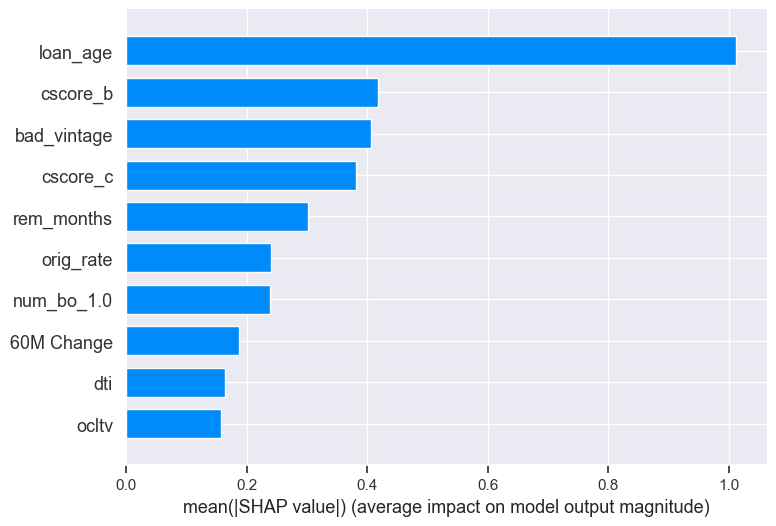

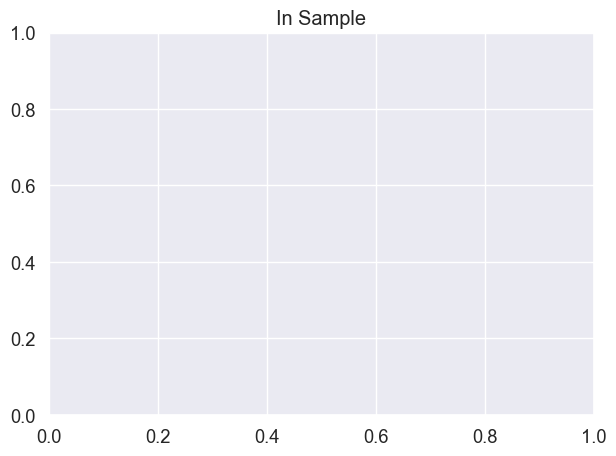

In [254]:
# Important features of in-sample
shap.summary_plot(df_ins[ shap_cols].values,
                  df_ins[ features_nv],
                  plot_type="bar",
                  max_display=10,
                  feature_names=features_nv,
                 show=True)
plt.title("In Sample")
plt.tight_layout()
plt.savefig(os.path.join("shap importance _ins.png"))

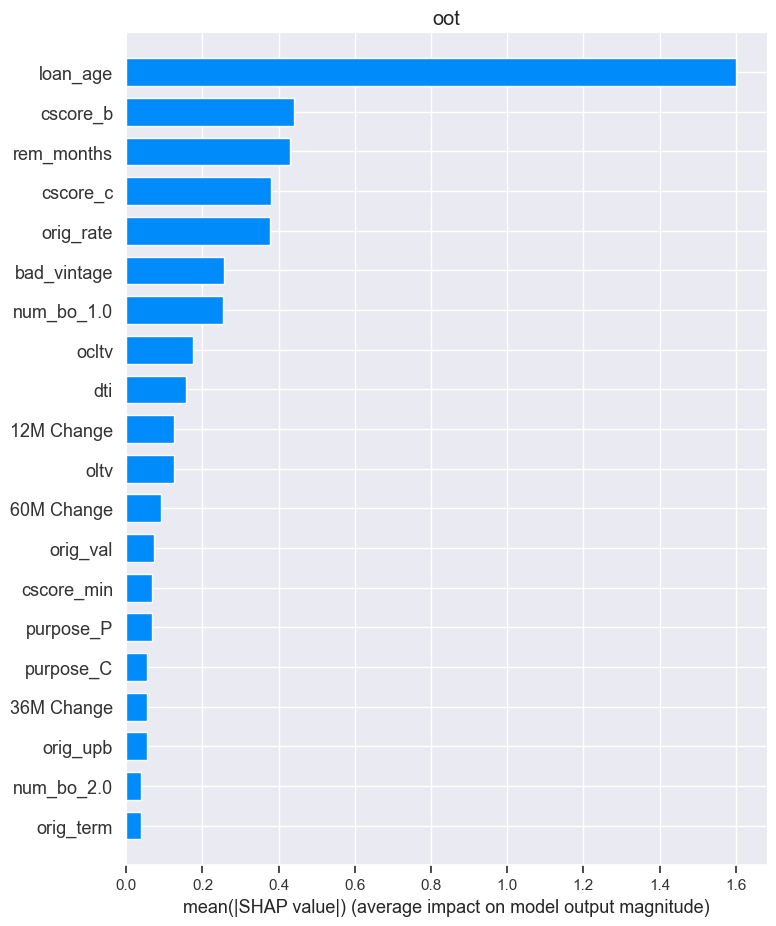

In [256]:
shap.summary_plot(df_oot[shap_cols].values,
                  df_oot[features_nv],
                  plot_type="bar",
                  max_display=20,
                  feature_names=features_nv,
                  show=False)
plt.title( 'oot')
plt.tight_layout()
plt.savefig(os.path. join(' shap importance oot.png'))

In [257]:
def write_sorted_output (df, column_name, output):
    df.columns = [column_name]
    df.sort_values (by=column_name, ascending=False, inplace=True)
    df[ "% of sum"] =df[column_name] / df[column_name].sum ()
    df.to_csv(output)

In [259]:
write_sorted_output (pd.DataFrame(sv_oot[oot_imp_features].abs().mean()),
                                   column_name= 'avg_abs_shap',
                                   output=os.path.join('mean_SHAP_oot.csv'))

In [265]:
import xgboost as xgb

In [266]:
def feat_importance(
model, feature_names,importance_type,  output, column_name=None, ax=None,  **kwargs
):

    if not column_name:
        column_name = importance_type

    mod= model if isinstance(model, xgb.Booster) else model.get_booster()


    gain =mod.get_score(importance_type=importance_type)

    write_sorted_output(
    pd.DataFrame.from_dict(gain, orient="index"),
    column_name=column_name,
    output=output,
  )
    if not ax:
     #fig, ax = plt.subplots (figsize=kwargs.get ("figsize", (10,10)))
        fig, ax = plt.subplots (figsize=(10,10))
        ax.spines["top"].set_visible (False)
        ax.spines["right"].set_visible(False)
        ax.spines["bottom"].set_visible(True)
        ax.spines["left"].set_visible(True)

    xgb.plot_importance(
      gain,
      ax=ax,
      importance_type=importance_type,
      #max_num_features=int(kwargs.get("max_num_feats",20)),
      max_num_features=20,
      title=kwargs.get("title", column_name),
      grid=False,
      ylabel=None,
      color=kwargs.get("color", "maroon"),
    )
    return ax


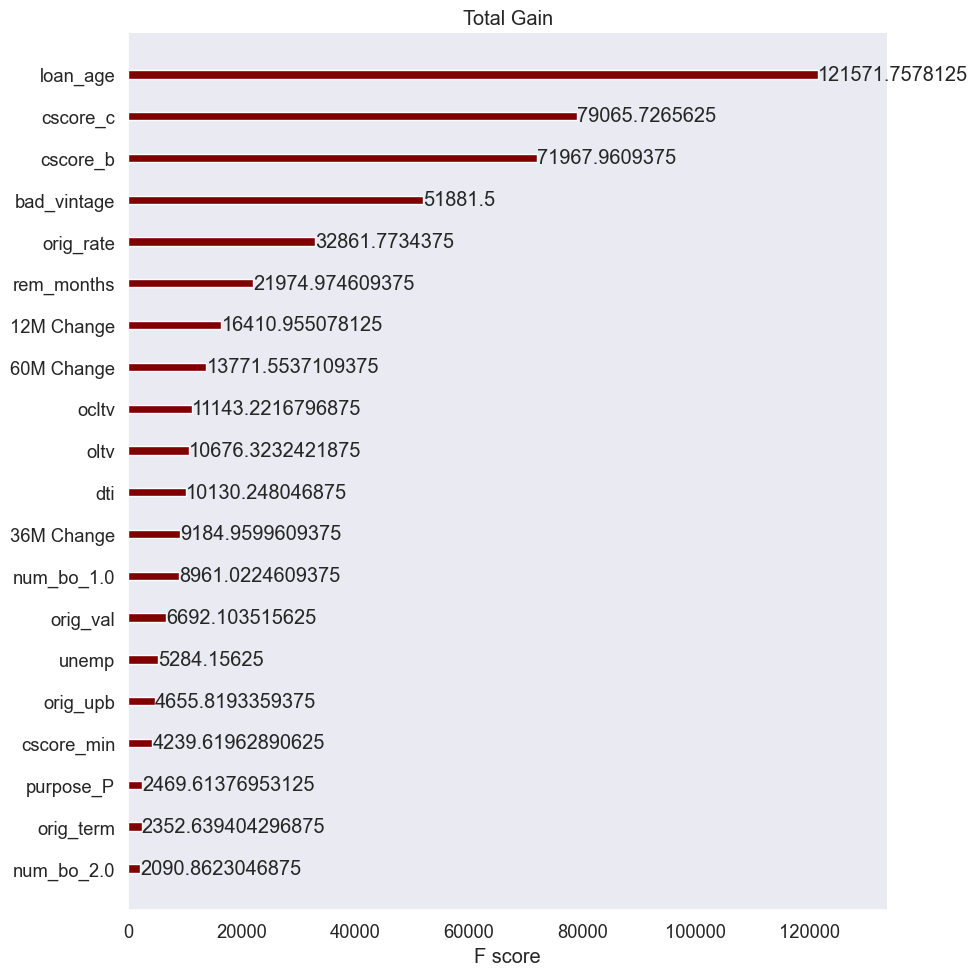

In [267]:

feat_importance(model_nv,features_nv,
                           importance_type='total_gain',
                           output=os.path.join('total_gain.csv'),
                           title='Total Gain',
                           color='maroon',
                           )
plt.tight_layout()
plt.savefig(os.path.join('feat_importance_total_gain_nv.png'))

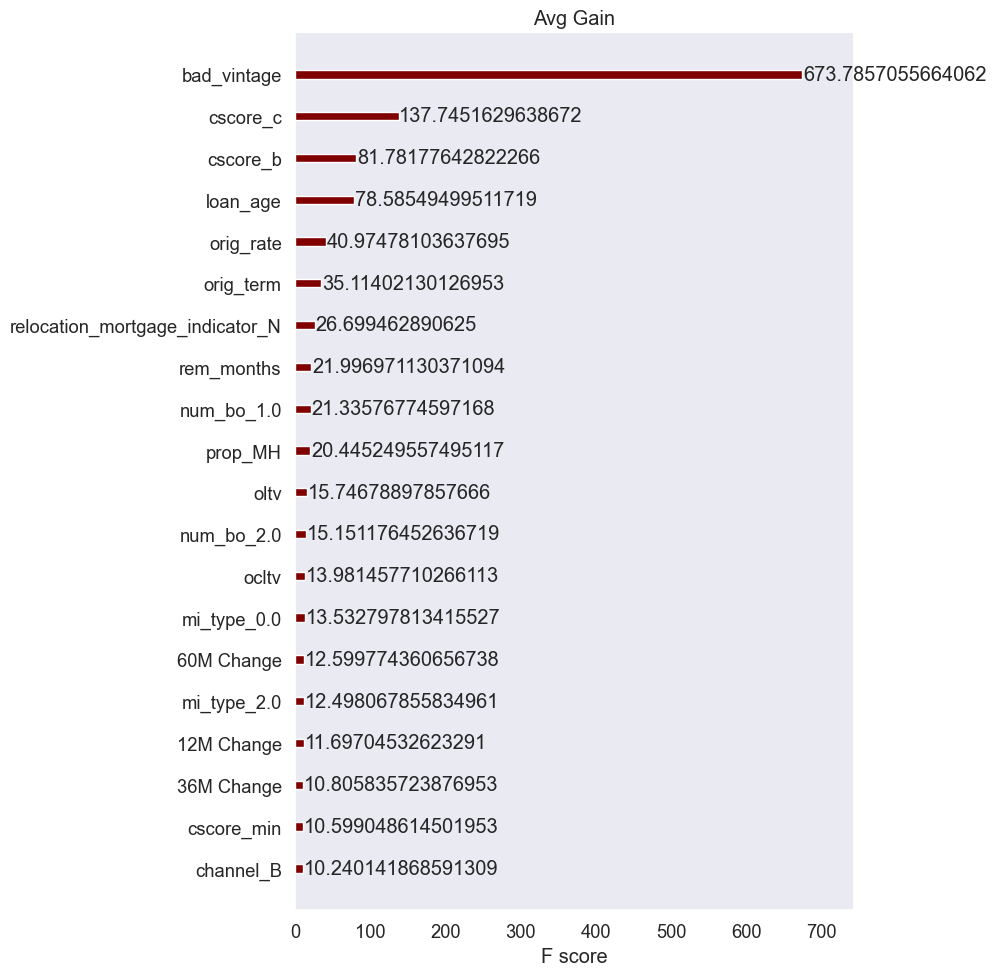

In [269]:

feat_importance(model_nv,features_nv,
                            importance_type='gain',
                            output=os.path.join('avg gain.csv'),
                            column_name='avg_gain',
                            title='Avg Gain',
                            color='maroon')
plt.tight_layout()
plt.savefig(os.path.join('feat_importance_avg_gain_nv.png'))

**4. Individual Feature Impact**

**4.1 PDP and ICE for Top 10 Features**

In [271]:
ds_ins_ice = df_ins
ds_oot_ice = df_oot

In [272]:
def dxgb_predictor(x):
  """

  workaround for icepick to be able to use dask xgboost objects.
  This refers to “model” from the outer scope
  """
  return mod.predict(xgb.DMatrix(x))


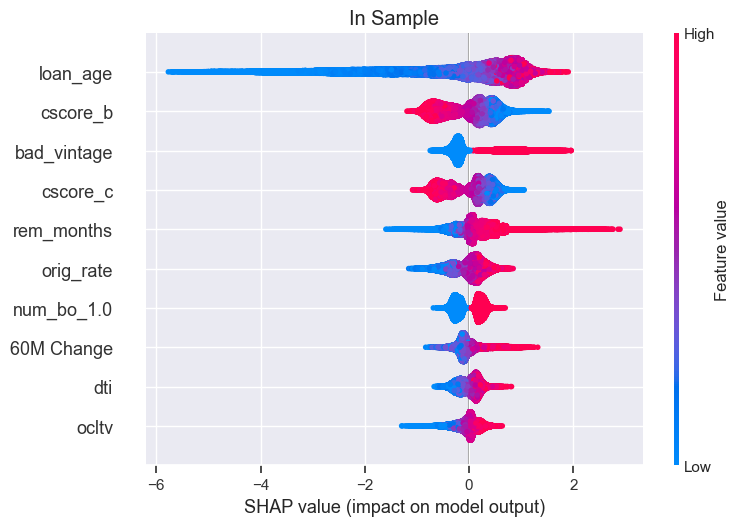

In [274]:
#%%time
# Important features of in-sample
shap.summary_plot(df_ins[shap_cols].values,
                  df_ins[features_nv],
                  max_display=10,
                  feature_names=features_nv,
                  show=False)
plt.title("In Sample")
plt.tight_layout()
plt.savefig(os.path.join("shap_summary ins.png"))

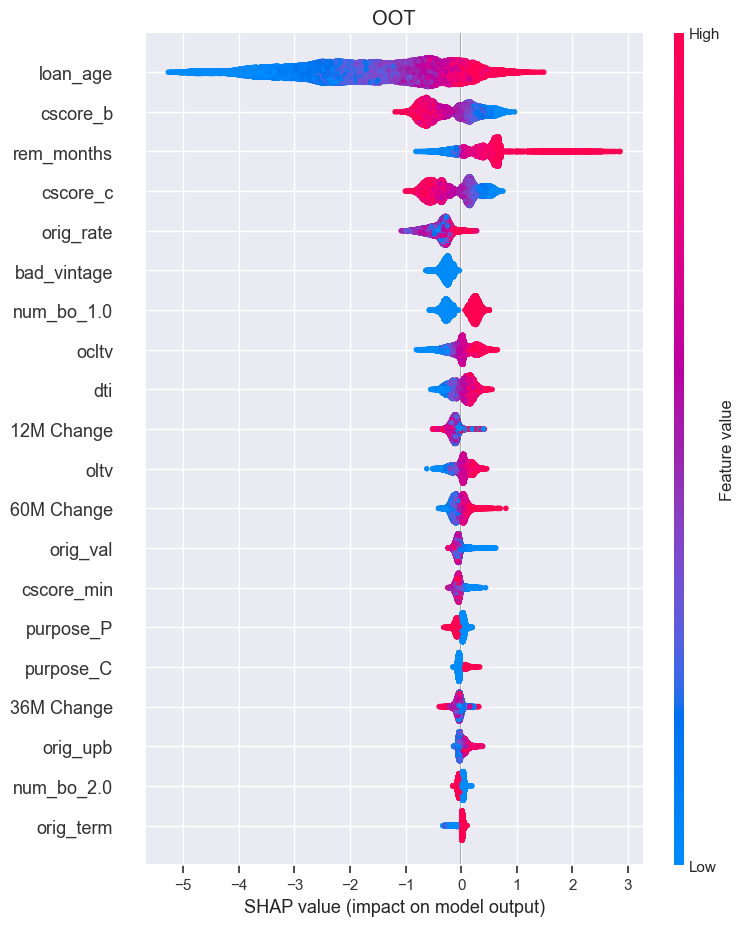

In [275]:
#%%time
# Important features of in-sample
shap.summary_plot(df_oot[shap_cols].values,
                  df_oot[features_nv],
                  max_display=20,
                  feature_names=features_nv,
                  show=False)
plt.title("OOT")
plt.tight_layout()
plt.savefig(os.path.join("shap_summary oot.png"))

In [276]:
oot_imp_features

['loan_age',
 'cscore_b',
 'rem_months',
 'cscore_c',
 'orig_rate',
 'bad_vintage',
 'num_bo_1.0',
 'ocltv',
 'dti',
 '12M Change']

In [277]:
def get_mean_per_bin(df, grp_var, ret_var, nbins):
    ds_new=df.copy()
    ds_new[grp_var+"_group"], bins=pd.cut (ds_new[grp_var], nbins, labels=False, retbins=True,right=False)
    ds_new[grp_var +"_group"] += 1.0

    bin_midpoints = pd.DataFrame (pd.Series(bins).rolling(2).mean().iloc[1:])
    bin_midpoints.columns = [grp_var +"_midpt"]
    bin_midpoints[grp_var + "_group"]=list (range (1, nbins + 1))

    _df=ds_new.merge (bin_midpoints, left_on=grp_var + "_group", right_on=grp_var +"_group")

    return(
      _df[[grp_var +"_midpt", ret_var]].groupby (grp_var + "_midpt").mean()[ret_var])
### HH figure out what retbins did for your pd.cut

In [290]:
def plot_shap(f, df, driver, explainer, kind="bar", ax=None,
**kwargs):


  if not ax:
    fig, ax =plt.subplots (figsize=(10,10) )

  _=ax.axhline(
    y=0,
    color="black",
    linestyle="-",
    label=kwargs.get(
    "hline_label", "Avg. Prediction={:.1f}".format (explainer.expected_value)
    ) ,
    )
  ax.scatter(
    df[f],
    df [f +"_shap"],
    label="SHAP values",
    s=6,
    color='turquoise',
    alpha=0.01,
  )
  if kind== "bar":
    grp_plt = df[[f,f + "_shap"]].groupby(f) .mean () [f + "_shap"]
    ax.bar(
       grp_plt.index,
       grp_plt,
       label="Avg. SHAP values",
       width=1,
       color="gray",
    )


  elif kind == "line":
    grp_plt = get_mean_per_bin(df, f, f + "_shap",
  nbins=kwargs.get ("nbins", 10))
    ax.plot(grp_plt, label="Avg. SHAP values",

color=kwargs.get("color", "brown"))
  else:
    raise Exception(f"{kind} not recognized. Should be one of['bar', line ]")

  ax.set_xlabel(f)
  ax.set_ylabel("Impact on "+ driver + "\n(deviation from | avg. pred)")

# set full alpha for scatter plot marker in legend.

  leg = ax.legend ()
  for lh in leg.legendHandles:
      lh.set_alpha (1)

  return ax

In [291]:
def plot_shap_test_train(ins_df, oot_df, explainer, nbins=10, kind='line', **kwargs,):
    fig, axes = plt.subplots(2, sharex=True, figsize=(6, 8))

    plot_shap(f,
                      ins_df,
                      driver,
                      nbins=nbins,
                      explainer=explainer,
                      ax=axes[0],
                      alpha=0.05,
                      kind=kind,
                      **kwargs)
    plot_shap(f,
                      oot_df,
                      driver,
                      nbins=nbins,
                      explainer=explainer,
                      ax=axes[1],
                      alpha=0.05,
                      kind=kind,
                      **kwargs)
    _ = axes[0].set_title('In Sample')
    _ = axes[1].set_title('Out of Sample')
    plt.tight_layout()
    if kwargs.get('output'):
        plt.savefig(kwargs.get( 'output' ))

CPU times: total: 1.67 s
Wall time: 2.76 s


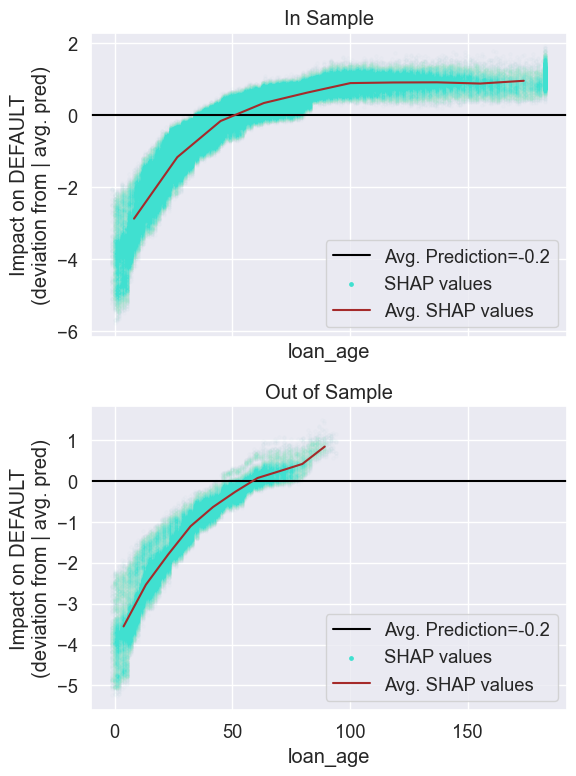

In [292]:
%%time
f='loan_age'



plot_shap_test_train(df_ins,
                      df_oot,
                      explainer_nv,
                      nbins=10,
                      kind='line',
                      output=os.path.join('shap_v_{}.png'.format(f)),
                      )

CPU times: total: 1.47 s
Wall time: 2.77 s


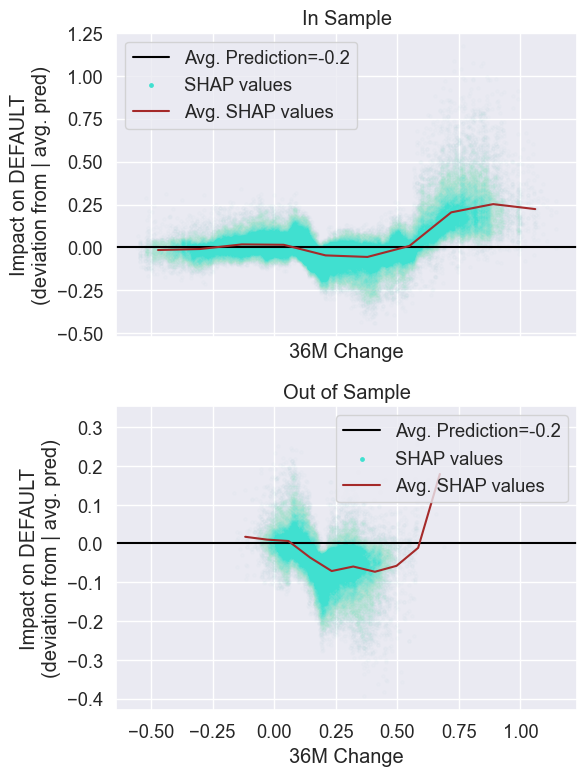

In [295]:
%%time
f= '36M Change'
plot_shap_test_train(df_ins,
                    df_oot,
                    explainer_nv,
                    nbins=10,
                    kind='line',
                    output=os.path.join('shap_nv_{}.png'.format(f)),
)


CPU times: total: 1.92 s
Wall time: 2.4 s


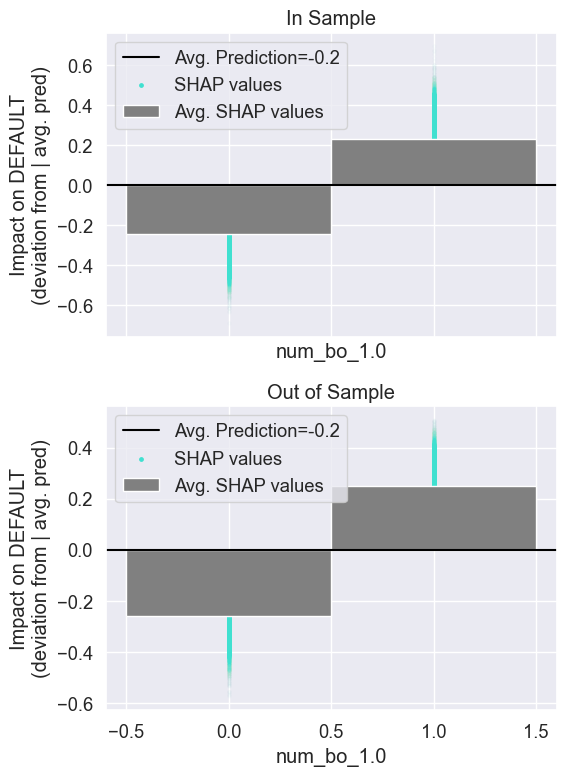

In [296]:
%%time
f='num_bo_1.0'


plot_shap_test_train(df_ins,
                    df_oot,
                    explainer_nv,
                    nbins=10,
                    kind='bar',
                    output=os.path.join('shap_{}.png'.format(f)))

CPU times: total: 1.67 s
Wall time: 2.37 s


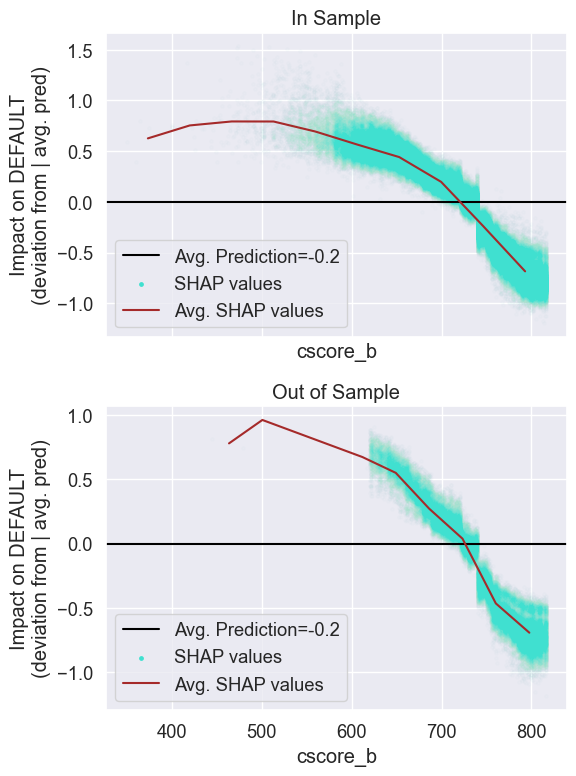

In [297]:

%%time
f='cscore_b'


plot_shap_test_train(df_ins,
                    df_oot,
                    explainer_nv,
                    nbins=10,
                    kind='line',
                    output=os.path.join('shap_{}.png'.format(f)))

CPU times: total: 1.34 s
Wall time: 1.99 s


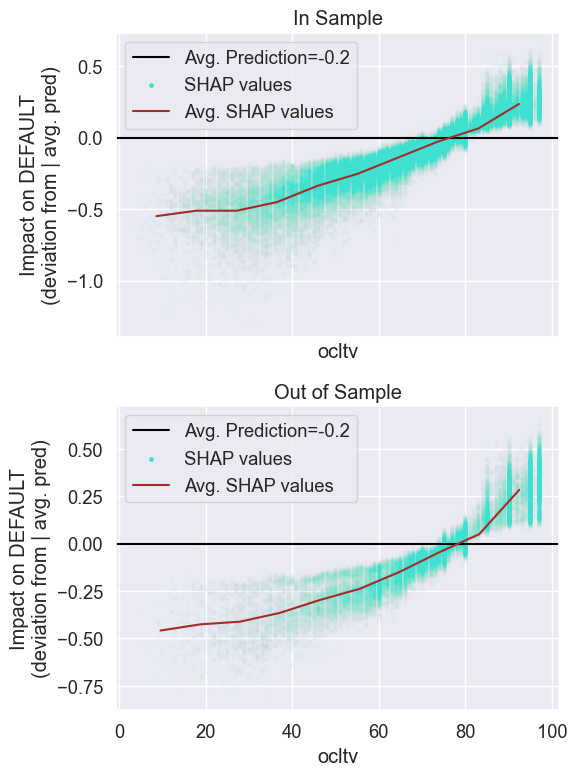

In [299]:
%%time
f='ocltv'

plot_shap_test_train(df_ins,
                     df_oot,
                     explainer_nv,
                     nbins=10,
                     kind='line',
                     output=os.path.join('shap_{}.png' .format(f)))

CPU times: total: 1.17 s
Wall time: 1.54 s


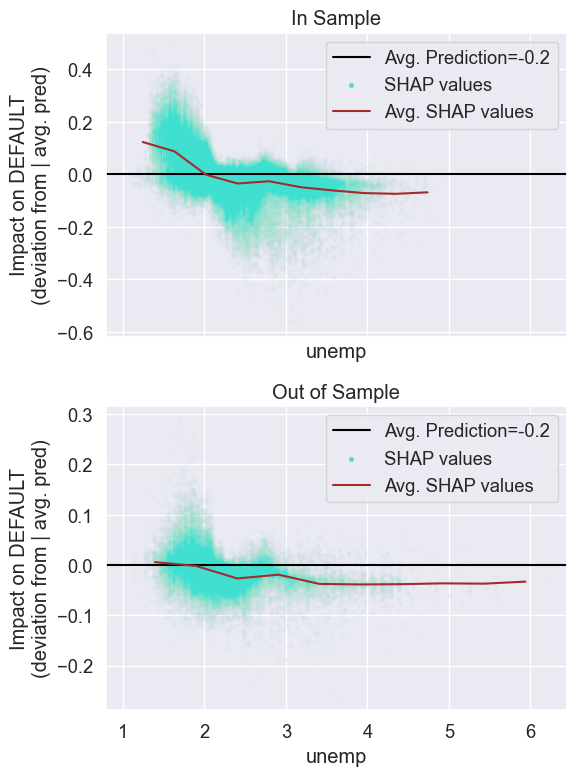

In [300]:
%%time
f='unemp'

plot_shap_test_train(df_ins,
                     df_oot,
                     explainer_nv,
                     nbins=10,
                     kind='line',
                     output=os.path.join('shap_{}.png' .format(f)))

## **4.3 ALE Plot for Top 10 Features**

In [301]:
def ale_compare_test_train(ds_ins,
                           ds_oot,
                           f,
                           predictor,
                           driver,
                           explainer,
                           features,
                           n_bins=10,
                           x_grid_points=None,
                           feature_type='Cont',
                           **kwargs):


    #fig, ax = plt.subplots(1, figsize=(8, 6))

    if feature_type!='Discrete':
     ale_eff = ale(
          X=ds_ins[features], model=predictor, feature=[f],include_CI=False, C=0.95)
     ale_eff = ale(
          X=ds_oot[features], model=predictor, feature=[f],include_CI=False, C=0.95)
    else:
     ale_discr = ale(ds_ins[features],model=predictor, feature=[f],feature_type="discrete")
     ale_discr = ale(ds_oot[features],model=predictor, feature=[f],feature_type="discrete")
    if kwargs.get('output'):
              plt.savefig(kwargs.get('output'))



PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.


"f = 'x1'\nmod = model_v\nale_compare_test_train1(ds_ins_v,\n                        ds_oot_v,\n                        f,\n                        model_nv,\n                        driver,\n                        explainer_v,\n                        features_v,\n                        n_bins=10,\n                        x_grid_points=None,\n                        output=os.path.join(fig_dir, 'shap {}.png'.format(f)))"

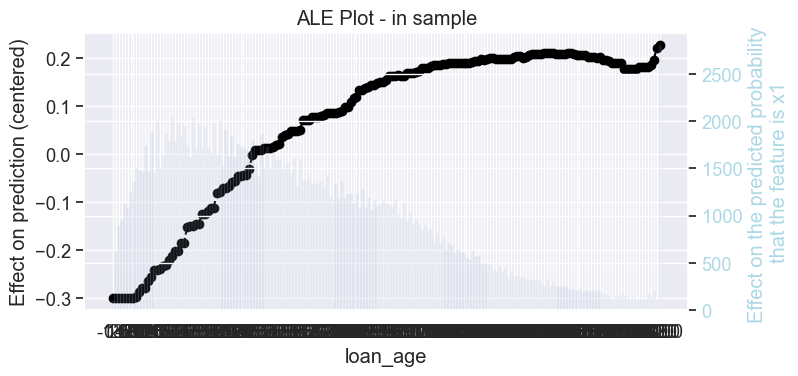

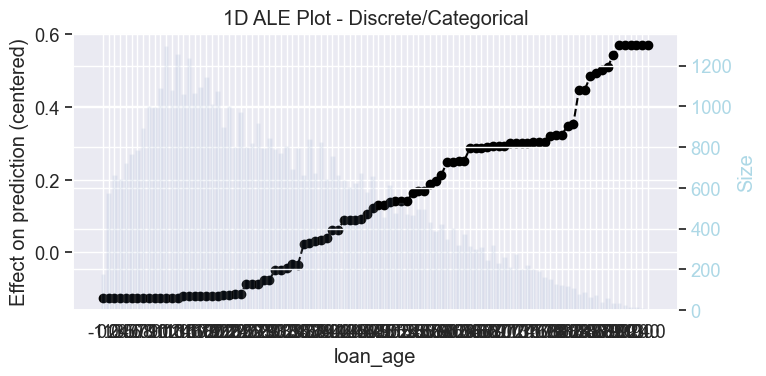

In [305]:

dmatrix=xgb.DMatrix(df_ins[features_nv])
model_nv.predict(df_ins[features_nv])

ale_eff = ale(
X=df_ins[features_nv], model=model_nv, feature=['loan_age'], include_CI=False, C=0.95,
    )
plt.ylabel('Effect on the predicted probability \nthat the feature is x1')
plt.title('ALE Plot - in sample')
ale_eff = ale(
X=df_oot[features_nv], model=model_nv, feature=['loan_age'], include_CI=False, C=0.95,)

"""
ale_discr = ale(
    ds_ins_v[features_v],
    model=model_v,
    feature=["x_bnry1"],
    feature_type="discrete",
    include_CI=True,
    C=0.95)
#ale_eff = ale(X=ds_ins_v[features_v], model=model_v, feature=["x1", "x2"], grid_size=5)

"""
"""
HH the implementation is buggy
#drop_list=['x5_0','x5_1','x5_2','x3','y', 'x1_shap', 'x2_shap', 'x4_shap', 'x5_0_shap', 'x5_1_shap', 'x5_2_shap']
drop_list=['x5_0','x5_1','x5_2','x3','y']

X_feat_raw = ds_ins_v.drop(['x3','y', 'x1_shap', 'x2_shap', 'x4_shap', 'x5_0_shap', 'x5_1_shap', 'x5_2_shap'], axis=1, inplace=False).copy()
#X_feat_raw=ds_ins_v.copy()
## 1D - categorical
ale_eff = ale(
    X=X_feat_raw,
    model=model_v,
    feature=["x5"],
    encode_fun=onehot_encode,
    predictors=features_v,
)
   """
"""f = 'x1'
mod = model_v
ale_compare_test_train1(ds_ins_v,
                        ds_oot_v,
                        f,
                        model_nv,
                        driver,
                        explainer_v,
                        features_v,
                        n_bins=10,
                        x_grid_points=None,
                        output=os.path.join(fig_dir, 'shap {}.png'.format(f)))"""

In [306]:
'''f = 'unemp'
mod = model_nv
ale_compare_test_train(ds_ins,
                        ds_oot,
                        f,
                        mod,
                        driver,
                        explainer_nv,
                        features_nv,
                        x_grid_points=None,
                        output=os.path.join(fig_dir, 'shap {}.png'.format(f)))'''

"f = 'unemp'\nmod = model_nv\nale_compare_test_train(ds_ins,\n                        ds_oot,\n                        f,\n                        mod,\n                        driver,\n                        explainer_nv,\n                        features_nv,\n                        x_grid_points=None,\n                        output=os.path.join(fig_dir, 'shap {}.png'.format(f)))"

PyALE._ALE_generic:INFO: Continuous feature detected.
PyALE._ALE_generic:INFO: Continuous feature detected.


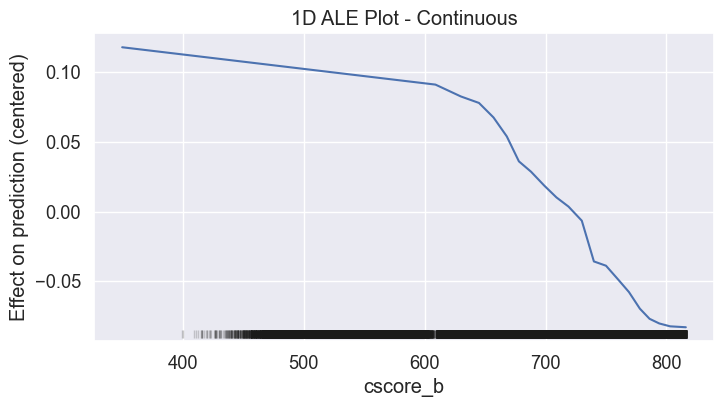

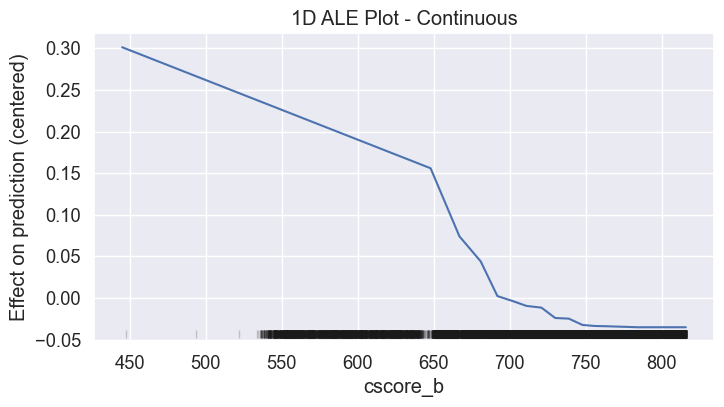

In [308]:
#f = "4Q Change"
f='cscore_b'
mod = model_nv
ale_compare_test_train(df_ins,
                        df_oot,
                        f,
                        mod,
                        driver,
                        explainer_nv,
                        features_nv,
                        x_grid_points=None,
                        output=os.path.join('shap {}.png'.format(f)))

In [310]:
#!pip install sklearn.inspection

In [320]:
ds=df_ins

<BarContainer object of 53 artists>

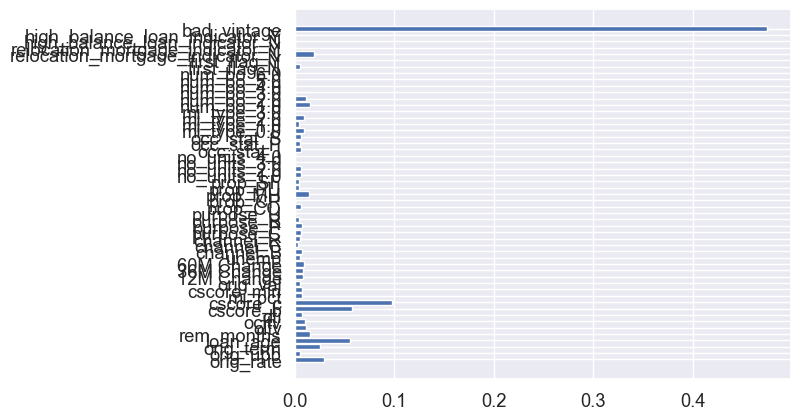

In [321]:
plt.barh(range(ds[features_nv].shape[1]), model_nv.feature_importances_, tick_label=ds[features_nv].columns)

'\nplot_partial_dependence(model_nv,\n                                   features=[\'loan_age\',\'ocltv\',"12M Change"],\n                                   X=ds[features_v],            # raw predictors data.\n                                   #feature_names=[\'curr_rate\'], # labels on graphs\n                                   grid_resolution=10,\n                                   subsample=500,\n                                   kind=\'both\',\n                                   ) # number of values to plot on x axis\n                                   '

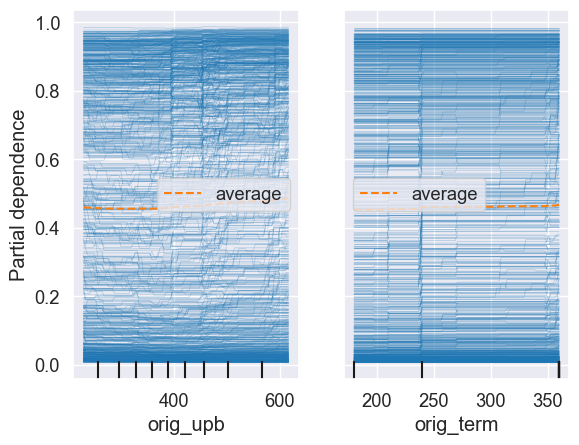

In [322]:
from sklearn.inspection._partial_dependence import  partial_dependence
#from sklearn.inspection.plot.partial_dependence import PartialDependenceDisplay

deciles = {0: np.linspace(0, 1, num=5)}
features, feature_names = [(0,)], features_v
from sklearn.inspection import PartialDependenceDisplay
#pd_results = partial_dependence( model_nv, ds[features_v], features=0, kind="average", grid_resolution=5)
#print(pd_results)
#display = PartialDependenceDisplay(
#     [pd_results], features=[0], feature_names=['oltv'],
#     target_idx=0, deciles=deciles)
#display.plot()

#plt.show()
PartialDependenceDisplay.from_estimator( model_nv, ds[features_v], [1, 2],kind='both')
"""
plot_partial_dependence(model_nv,
                                   features=['loan_age','ocltv',"12M Change"],
                                   X=ds[features_v],            # raw predictors data.
                                   #feature_names=['curr_rate'], # labels on graphs
                                   grid_resolution=10,
                                   subsample=500,
                                   kind='both',
                                   ) # number of values to plot on x axis
                                   """

# **5. Feature Interactions**

## **5.1 Rank feature interactions: H-stats**

In [334]:
#!pip list


[notice] A new release of pip available: 22.3.1 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Package                           Version
--------------------------------- ---------
absl-py                           1.4.0
ansi2html                         1.8.0
anyio                             3.6.2
appdirs                           1.4.4
argon2-cffi                       21.3.0
argon2-cffi-bindings              21.2.0
arrow                             1.2.3
asttokens                         2.2.1
astunparse                        1.6.3
atomicwrites                      1.4.1
attrs                             22.2.0
awscli                            1.29.40
backcall                          0.2.0
beautifulsoup4                    4.11.2
bleach                            6.0.0
blis                              0.7.9
boto3                             1.28.40
botocore                          1.31.40
branca                            0.6.0
cachetools                        5.3.1
catalogue                         2.0.8
category-encoders                 2.6.0
certifi                 

In [335]:
!pip install pdpbox

     --------------------------------------- 35.8/35.8 MB 40.9 MB/s eta 0:00:00
     ------------------------------------- 324.5/324.5 kB 19.6 MB/s eta 0:00:00
     ---------------------------------------- 3.2/3.2 MB 68.0 MB/s eta 0:00:00
     ---------------------------------------- 2.8/2.8 MB 59.9 MB/s eta 0:00:00
     ---------------------------------------- 61.7/61.7 kB ? eta 0:00:00
     -------------------------------------- 120.0/120.0 kB 7.3 MB/s eta 0:00:00
     ---------------------------------------- 83.5/83.5 kB ? eta 0:00:00
     ---------------------------------------- 99.2/99.2 kB ? eta 0:00:00
     ---------------------------------------- 92.7/92.7 kB 5.2 MB/s eta 0:00:00
     ---------------------------------------- 89.4/89.4 kB ? eta 0:00:00
     ------------------------------------- 572.7/572.7 kB 37.5 MB/s eta 0:00:00
     ---------------------------------------- 93.0/93.0 kB ? eta 0:00:00
     --------------------------------------- 10.1/10.1 MB 58.5 MB/s eta 0:00:

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
awscli 1.29.40 requires colorama<0.4.5,>=0.2.5, but you have colorama 0.4.6 which is incompatible.
awscli 1.29.40 requires docutils<0.17,>=0.10, but you have docutils 0.18.1 which is incompatible.
ipython-sql 0.5.0 requires sqlalchemy>=2.0, but you have sqlalchemy 1.4.49 which is incompatible.

[notice] A new release of pip available: 22.3.1 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [336]:
from pdpbox import pdp

In [339]:
def pdp_multi_interact(model, dataset, model_features, features,
                    num_grid_points=None, grid_types=None, percentile_ranges=None, grid_ranges=None, cust_grid_points=None,
                    cust_grid_combos=None, use_custom_grid_combos=False,
                    memory_limit=0.5, n_jobs=1, predict_kwds=None, data_transformer=None):

    def _expand_default(x, default, length):
        if x is None:
            return [default] * length
        return x

    def _get_grid_combos(feature_grids, feature_types):
        grids = [list(feature_grid) for feature_grid in feature_grids]
        for i in range(len(feature_types)):
            if feature_types[i] == 'onehot':
                grids[i] = np.eye(len(grids[i])).astype(int).tolist()
        return np.stack(np.meshgrid(*grids), -1).reshape(-1, len(grids))

    if predict_kwds is None:
        predict_kwds = dict()

    nr_feats = len(features)

    # check function inputs
    n_classes, predict = _check_model(model=model)
    _check_dataset(df=dataset)
    _dataset = dataset.copy()

    # prepare the grid
    pdp_isolate_outs = []
    if use_custom_grid_combos:
        grid_combos = cust_grid_combos
        feature_grids = []
        feature_types = []
    else:
        num_grid_points = _expand_default(x=num_grid_points, default=10, length=nr_feats)
        grid_types = _expand_default(x=grid_types, default='percentile', length=nr_feats)
        for i in range(nr_feats):
            _check_grid_type(grid_type=grid_types[i])

        percentile_ranges = _expand_default(x=percentile_ranges, default=None, length=nr_feats)
        for i in range(nr_feats):
            _check_percentile_range(percentile_range=percentile_ranges[i])

        grid_ranges = _expand_default(x=grid_ranges, default=None, length=nr_feats)
        cust_grid_points = _expand_default(x=cust_grid_points, default=None, length=nr_feats)

        _check_memory_limit(memory_limit=memory_limit)

        pdp_isolate_outs = []
        for idx in range(nr_feats):
            pdp_isolate_out = pdp_isolate(
                model=model, dataset=_dataset, model_features=model_features, feature=features[idx],
                num_grid_points=num_grid_points[idx], grid_type=grid_types[idx], percentile_range=percentile_ranges[idx],
                grid_range=grid_ranges[idx], cust_grid_points=cust_grid_points[idx], memory_limit=memory_limit,
                n_jobs=n_jobs, predict_kwds=predict_kwds, data_transformer=data_transformer)
            pdp_isolate_outs.append(pdp_isolate_out)

        if n_classes > 2:
            feature_grids = [pdp_isolate_outs[i][0].feature_grids for i in range(nr_feats)]
            feature_types = [pdp_isolate_outs[i][0].feature_type  for i in range(nr_feats)]
        else:
            feature_grids = [pdp_isolate_outs[i].feature_grids for i in range(nr_feats)]
            feature_types = [pdp_isolate_outs[i].feature_type  for i in range(nr_feats)]

        grid_combos = _get_grid_combos(feature_grids, feature_types)

    feature_list = []
    for i in range(nr_feats):
        feature_list.extend(_make_list(features[i]))

    # Parallel calculate ICE lines
    true_n_jobs = _calc_memory_usage(
        df=_dataset, total_units=len(grid_combos), n_jobs=n_jobs, memory_limit=memory_limit)

    grid_results = Parallel(n_jobs=true_n_jobs)(delayed(_calc_ice_lines_inter)(
        grid_combo, data=_dataset, model=model, model_features=model_features, n_classes=n_classes,
        feature_list=feature_list, predict_kwds=predict_kwds, data_transformer=data_transformer)
                                                for grid_combo in grid_combos)

    ice_lines = pd.concat(grid_results, axis=0).reset_index(drop=True)
    pdp = ice_lines.groupby(feature_list, as_index=False).mean()

    # combine the final results
    pdp_interact_params = {'n_classes': n_classes,
                        'features': features,
                        'feature_types': feature_types,
                        'feature_grids': feature_grids}
    if n_classes > 2:
        pdp_interact_out = []
        for n_class in range(n_classes):
            _pdp = pdp[feature_list + ['class_%d_preds' % n_class]].rename(
                columns={'class_%d_preds' % n_class: 'preds'})
            pdp_interact_out.append(
                PDPInteract(which_class=n_class,
                            pdp_isolate_outs=[pdp_isolate_outs[i][n_class] for i in range(nr_feats)],
                            pdp=_pdp, **pdp_interact_params))
    else:
        pdp_interact_out = PDPInteract(
            which_class=None, pdp_isolate_outs=pdp_isolate_outs, pdp=pdp, **pdp_interact_params)

    return pdp_interact_out

In [340]:
def center(arr): return arr - np.mean(arr)

def compute_f_vals_pdpbox(mdl, X, features, selectedfeatures, num_grid_points=10, use_data_grid=False):
    f_vals = {}
    data_grid = None
    if use_data_grid:
        data_grid = X[selectedfeatures].values
    # Calculate partial dependencies for full feature set
    p_full = pdp_multi_interact(mdl, X, features, selectedfeatures,
                                num_grid_points=[num_grid_points] * len(selectedfeatures),
                                cust_grid_combos=data_grid,
                                use_custom_grid_combos=use_data_grid)
    f_vals[tuple(selectedfeatures)] = center(p_full.pdp.preds.values)
    grid = p_full.pdp.drop('preds', axis=1)
    # Calculate partial dependencies for [1..SFL-1]
    for n in range(1, len(selectedfeatures)):
       for subsetfeatures in itertools.combinations(selectedfeatures, n):
            if use_data_grid:
                data_grid = X[list(subsetfeatures)].values
            p_partial = pdp_multi_interact(mdl, X, features, subsetfeatures,
                                        num_grid_points=[num_grid_points] * len(selectedfeatures),
                                        cust_grid_combos=data_grid,
                                        use_custom_grid_combos=use_data_grid)
            p_joined = pd.merge(grid, p_partial.pdp, how='left')
            f_vals[tuple(subsetfeatures)] = center(p_joined.preds.values)
    return f_vals

In [341]:
def compute_h_val(f_vals, selectedfeatures):
    denom_els = f_vals[tuple(selectedfeatures)].copy()
    numer_els = f_vals[tuple(selectedfeatures)].copy()
    sign = -1.0
    for n in range(len(selectedfeatures)-1, 0, -1):
        for subfeatures in itertools.combinations(selectedfeatures, n):
            numer_els += sign * f_vals[tuple(subfeatures)]
        sign *= -1.0
    numer = np.sum(numer_els**2)
    denom = np.sum(denom_els**2)
    return math.sqrt(numer/denom) if numer < denom else np.nan

In [342]:
def compute_h_val_any(f_vals, allfeatures, selectedfeature):
    otherfeatures = list(allfeatures)
    otherfeatures.remove(selectedfeature)
    denom_els = f_vals[tuple(allfeatures)].copy()
    numer_els = denom_els.copy()
    numer_els -= f_vals[(selectedfeature,)]
    numer_els -= f_vals[tuple(otherfeatures)]
    numer = np.sum(numer_els**2)
    denom = np.sum(denom_els**2)
    return math.sqrt(numer/denom) if numer < denom else np.nan

In [343]:
ds_sample=ds.sample(frac=0.001, replace=True, random_state=1)

In [344]:
ds_sample_oot=ds.sample(frac=0.05, replace=True, random_state=1)

In [345]:
ins_imp_features[:7]

['loan_age',
 'cscore_b',
 'bad_vintage',
 'cscore_c',
 'rem_months',
 'orig_rate',
 'num_bo_1.0']

In [346]:
feats=ins_imp_features[5:]
feats

['orig_rate', 'num_bo_1.0', '60M Change', 'dti', 'ocltv']

In [347]:
feats=['loan_age','4Q Change','cscore_min','num_bo_1.0','ocltv','orig_rate']

## **5.2 Two-way SHAP dependence plot for top 10 features**

In [350]:
def plot_dependence(ds_ins, ds_oot, feat, interaction_feat, features,
                    alpha=0.6, **kwargs):


  fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(6,10))
  axes[1].set_title("Out of Time")
  axes[0].set_title("In Time")
  output = kwargs.pop( 'output' )
  shap.dependence_plot(feat,
                      shap_values=ds_ins[shap_cols].values,
                      features=ds_ins[features].values,
                      feature_names=features,
                      interaction_index=interaction_feat,
                      alpha=alpha,
                      ax=axes[0],
                      show=False,
                          **kwargs)
  shap.dependence_plot(feat,
                      shap_values=ds_oot[shap_cols].values,
                      features=ds_oot[features].values ,
                      feature_names=features,
                      interaction_index=interaction_feat,
                      alpha=alpha,
                      ax=axes[1],
                      **kwargs)

  if output:
      plt.savefig(output)

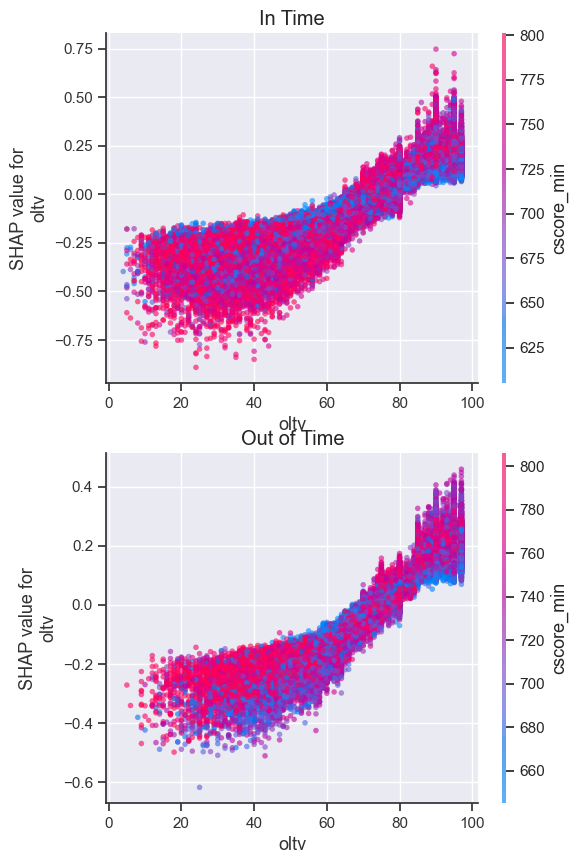

<Figure size 640x480 with 0 Axes>

In [353]:
f = 'oltv'
plot_dependence(df_ins,
                df_oot,
                feat=f,
                interaction_feat='cscore_min',
                features=features_v,
                output=os.path.join('shap dependence {}.png'.format(f)))

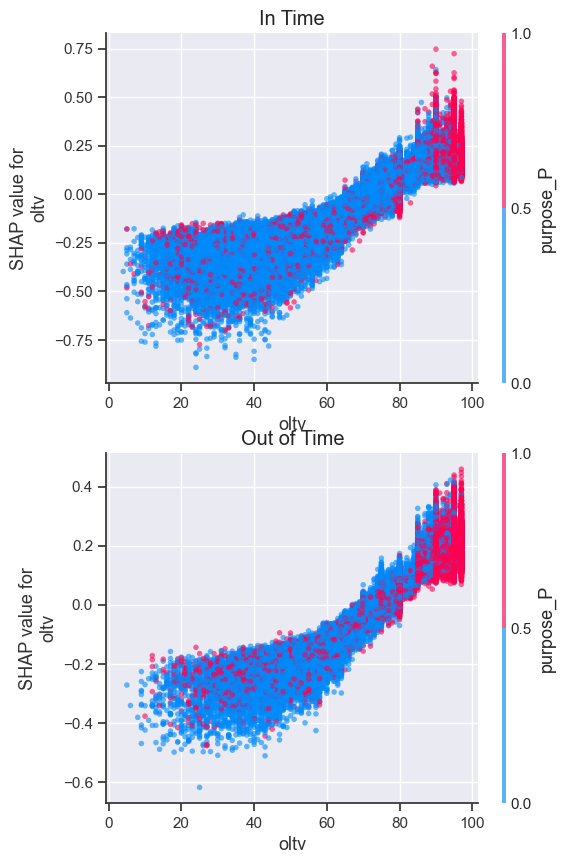

<Figure size 640x480 with 0 Axes>

In [354]:
f='oltv'
plot_dependence(df_ins,
                df_oot,
                feat=f,
                interaction_feat='purpose_P',
                features=features_nv,
                output=os.path.join('shap_dependence_{}.png'.format(f)))

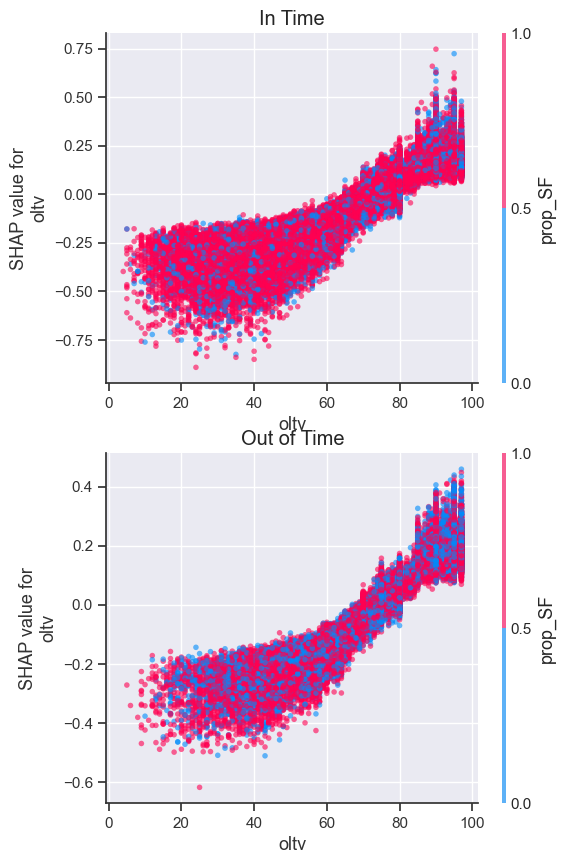

<Figure size 640x480 with 0 Axes>

In [355]:
f='oltv'
plot_dependence(df_ins,
                df_oot,
                feat=f,
                interaction_feat='prop_SF',
                features=features_nv,
                output=os.path.join('shap_dependence_{}.png'.format(f)))


In [356]:
"""f = 'ANNUAL INCOME’
plot_dependence(ds_ins_nv.loc[ds_ins_nv[f] <=100000],
                ds_oot_nv.loc[ds_ocot_nv[f] <=100000],
                feat=f,
                interaction_feat='auto',
                features=features_nv,
                output=os.path.join(fig_dir, 'shap_ dependence _{}.png'.format(f))
"""

"f = 'ANNUAL INCOME’\nplot_dependence(ds_ins_nv.loc[ds_ins_nv[f] <=100000],\n                ds_oot_nv.loc[ds_ocot_nv[f] <=100000],\n                feat=f,\n                interaction_feat='auto',\n                features=features_nv,\n                output=os.path.join(fig_dir, 'shap_ dependence _{}.png'.format(f))\n"

In [357]:
"""
f = 'BUREAU_FILE_AGE YEARS'
plot_dependence(ds_ins nv,
                ds_oot_nv,
                feat=f,
                interaction_feat='auto',
                features=features_nv,
                output=os.path.join(fig_dir, 'shap_dependence_{}.png'.format(f)))"""

"\nf = 'BUREAU_FILE_AGE YEARS'\nplot_dependence(ds_ins nv,\n                ds_oot_nv,\n                feat=f,\n                interaction_feat='auto',\n                features=features_nv,\n                output=os.path.join(fig_dir, 'shap_dependence_{}.png'.format(f)))"

In [358]:
"""f='UM_SPEND'
plot_dependence(ds_ins_nv[ds_ins_nv[f] < 10000],
                ds_oot_nv[ds_oot_nv[f] < 10000],
                feat=f,
                interaction_feat='auto',
                features=features_nv,
                output=os.path.join(fig_dir, 'shap_dependence_{}.png'.format(f)))"""

"f='UM_SPEND'\nplot_dependence(ds_ins_nv[ds_ins_nv[f] < 10000],\n                ds_oot_nv[ds_oot_nv[f] < 10000],\n                feat=f,\n                interaction_feat='auto',\n                features=features_nv,\n                output=os.path.join(fig_dir, 'shap_dependence_{}.png'.format(f)))"

## **5.3 Two-way SHAP dependence plot of Top Interactions in sample**

In [359]:
h_ins = {subsets[i]: h_vals[i] for i in range(len(subsets))}

In [360]:
h_ins

{}

In [361]:
# sort out the top 10 interactions
top_h_ins=[i[0] for i in sorted(h_ins.items(), key=lambda x: x[1], reverse=True)[:10]]

In [362]:
top_h_ins

[]

In [363]:
"""for i in range(len(top_h_ins)):

    var1, var2 = top_h_ins[i][0:2], top_h_ins[i][5:7]
    print(var1,var2)

    plot_dependence(ds_ins_nv,
                    ds_oot_nv,
                    feat=var1,
                    interaction_feat=var2,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
                    )
    plot_dependence(ds_ins_nv,
                    ds_oot_nv,
                    feat=var2,
                    interaction_feat=var1,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
    )"""

"for i in range(len(top_h_ins)):\n\n    var1, var2 = top_h_ins[i][0:2], top_h_ins[i][5:7]\n    print(var1,var2)\n\n    plot_dependence(ds_ins_nv,\n                    ds_oot_nv,\n                    feat=var1,\n                    interaction_feat=var2,\n                    features=features_nv,\n                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))\n                    )\n    plot_dependence(ds_ins_nv,\n                    ds_oot_nv,\n                    feat=var2,\n                    interaction_feat=var1,\n                    features=features_nv,\n                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))\n    )"

In [364]:
## recoding the intercation splits to make it more flexible

for i in range(len(top_h_ins)):
    vars=top_h_ins[i].rsplit(sep=' * ', maxsplit=- 1)
    if len(vars)>2:
        continue
    var1, var2 = vars[0], vars[1]
    print(var1,var2)

    plot_dependence(ds_ins,
                    ds_oot,
                    feat=var1,
                    interaction_feat=var2,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
                    )
    plot_dependence(ds_ins,
                    ds_oot,
                    feat=var2,
                    interaction_feat=var1,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
    )




In [365]:
top_h_ins

[]

## **5.4 Two-way ALE of Top Interactions**

In [366]:
mod = model_nv
for i in range(len(top_h_ins)):
    try:
        vars=top_h_ins[i].rsplit(sep=' * ', maxsplit=- 1)
        if len(vars)>2:
            continue
        var1, var2 = vars[0], vars[1]
 #       print(var1,var2)
 #       print(ds_ins_v[var2])

        plt.figure(figsize=(3,4))
        ale_eff = ale(X=ds_ins_v[features_v], model=model_v, feature=[var1, var2],grid_size=20,plot=True)


        """
        plot_2d(predictor=dxgb_predictor,
        data=ds_ins_nv[features_nv],
        variablel=varl,
        variable2=var2)

        plt.tight_layout()"""
    except:
        pass
        #plt.savefig(os.path.join(fig_dir, 'two_way ale {}_ {}.png'.format(varl, var2)))


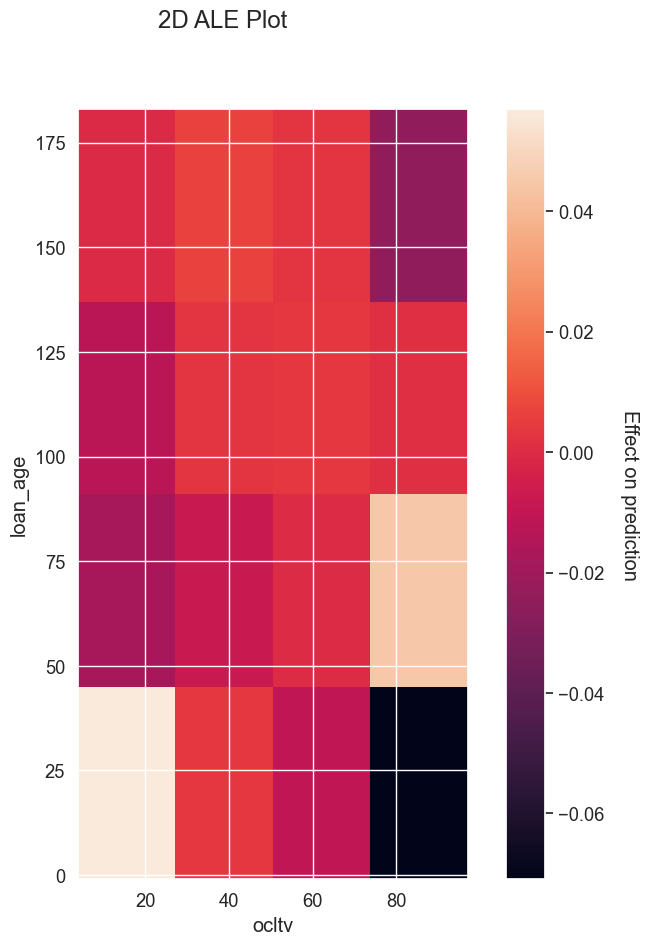

In [368]:
fig, ax = plt.subplots(figsize=(10, 10))

ale_eff = ale(X=df_ins[features_nv], model=model_nv, feature=[ "loan_age",'ocltv'],grid_size=3,ax=ax,fig=fig)
#cbar = fig.colorbar(im, ax=ax)
#cbar.ax.set_ylabel("Effect on prediction", rotation=270, labelpad=25)
#plt.colorbar(im,orientation="horizontal", fraction=0.047)

# **6.Analysis by statement**

## **6.1 SHAP by statement for top 10 features**

In [369]:
groupse=['Stmt 1-12', 'Stmt 13-24', 'Stmt 25-36']

In [370]:
def plot_stmt_group(df_ins, df_oot, feat, explainer, groups, driver, **kwargs):
    """
    plot oot and in sample shap values by statement group

    Parameters
    ----------
    df ing : pd.DataFrame
        in sample data
    df_oot : pd.DataFrame
        out of sample data
    feat : str
        features
    explainer : Tree explainer
    groups : list
        list of groups
    driver : str
        driver variable

    Other Parameters
    ----------------
    n_bins : int
        number of bins
    output : str
        output file path + name

    Returns
    -------
    None

    """
    fig, axes = plt.subplots(2, sharex=True, figsize=(6, 9))
    plot_by_stmt_grp(df_ins,
                                    feat,
                                    driver,
                                    n_bins=kwargs.get('n_bins', 10),
                                    explainer=explainer,
                                    groups=groups,
                                    ax=axes[0])
    plot_by_stmt_grp(df_oot,
                                    feat,
                                    driver,
                                    n_bins=kwargs.get('n_bins', 10),
                                    explainer=explainer,
                                    groups=groups,
                                    ax=axes[1])

    axes[0].set_title("In Sample")
    axes[1].set_title('OoT')
    fig.tight_layout()
    if kwargs.get('output'):
        fig.savefig(kwargs.get('output' ))

In [371]:
for feat in imp_feats:
  plot_stmt_group(ds_ins_nv,
                  ds_oot_nv,
                  feat,
                  explainer=explainer_nv,
                  groups=groups,
                  driver=driver,
                  n_bins=10,
                  output=os.path.join(fig_dir,'stmt_groups_{}.png'.format(feat)))

NameError: name 'imp_feats' is not defined

## **6.2 ALE by statement for top 10 features**

In [372]:
def plot_ale_by_stmt(df_ins,df_oot,var1,var2,predictor,output=None,**kwargs)
fig,axes=plt.subplots(nrows=2,sharex=True,figsize=(6,10))
axes[1].set_title("Out of Time")
axes[0].set_title("In time")
plot_2d(predictor,
        df_ins,
        var1,
        var2,
        ax=axes[0],
        **kwargs)
plot_2d(predictor,
        df_oot,
        var1,
        var2,
        ax=axes[1],
        **kwargs)
plt.tight_layout()
if output:
  plt.savefig(output)

SyntaxError: expected ':' (3923152300.py, line 1)

In [374]:
for i in range(len(top_h_ins)):
    vars=top_h_ins[i].rsplit(sep=' * ', maxsplit=- 1)
    if len(vars)>2:
        continue
    var1, var2 = vars[0], vars[1]
    print(var1,var2)

    plot_dependence(ds_ins,
                    ds_oot,
                    feat=var1,
                    interaction_feat=var2,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
                    )
    plot_dependence(ds_ins,
                    ds_oot,
                    feat=var2,
                    interaction_feat=var1,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
    )

In [380]:
## recoding the intercation splits to make it more flexible

for i in range(len(top_h_ins)):
    vars=top_h_ins[i].rsplit(sep=' * ', maxsplit=- 1)
    if len(vars)>2:
        continue
    var1, var2 = vars[0], vars[1]
    print(var1,var2)

    plot_dependence(ds_ins,
                    ds_oot,
                    feat=var1,
                    interaction_feat=var2,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
                    )
    plot_dependence(ds_ins,
                    ds_oot,
                    feat=var2,
                    interaction_feat=var1,
                    features=features_nv,
                    output=os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1,var2))
    )




In [376]:
for i in range(len(top_h_ins)):
    vars = top_h_ins[i].rsplit(sep=' * ', maxsplit=-1)
    if len(vars) != 2:
        continue  # Skip cases where there are not exactly 2 variables

    var1, var2 = vars[0], vars[1]
    output_file_path = os.path.join(fig_dir, 'shap_dependence_{}_{}.png'.format(var1, var2))

    # Assuming plot_dependence correctly generates and saves the plot
    plot_dependence(ds_ins, ds_oot, feat=var1, interaction_feat=var2, features=features_nv, output=output_file_path)
    plot_dependence(ds_ins, ds_oot, feat=var2, interaction_feat=var1, features=features_nv, output=output_file_path)
